In [1]:
from scipy import stats
import tensorflow as tf
import math
import itertools
import operator
from tensorflow.python.keras import backend as k
from tqdm import tqdm, tqdm_notebook, notebook
import numpy as np
from tensorflow.keras import layers
import os
from scipy.stats.stats import pearsonr
# from keras.utils.vis_utils import plot_model
# from keras.models import Sequential
# from keras.layers import Activation, LSTM, TimeDistributed, Dense, RepeatVector, CuDNNLSTM, GRU, Bidirectional, Input, CuDNNGRU
# #from keras.utils import np_utils
# from keras.callbacks import TensorBoard
# # import tensorflow as tf

# from keras import backend as K
# from keras.models import Model
# from keras.layers.core import Dense, Reshape
# from keras.layers.wrappers import TimeDistributed
# from keras.layers import concatenate
# import difflib
# from keras.models import load_model
# import keras
# from keras import losses
import matplotlib.pyplot as plt
import random
from random import choice
import re

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import pickle

from sklearn.preprocessing import LabelEncoder
from bio import AlignIO
# from Bio.Align import MultipleSeqAlignment
# from Bio.SeqRecord import SeqRecord
# from Bio import SeqIO
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from keras_preprocessing import sequence
import sklearn
import numpy as np
import re
import pickle
import itertools
import random
import string

ancName = ['_HPGPNRMPC', '_HPGPN' ,'_HPGP' ,'_HPG', '_HP']
desName = ['hg38']
os.environ["CUDA_VISIBLE_DEVICES"]="0"
seq_length = ['1', '5', '11', '15', '21']
train_size = ['100000', '1000000', '1500000', '2000000']
# train_size = 0
val_loss_hist = []

#K.clear_session()
#keras.backend.clear_session()

anc = str(np.load('prepData/insert1Anc_{}_{}.npy'.format(ancName[0], desName[0])))
des = str(np.load('prepData/insert1Des_{}_{}.npy'.format(ancName[0], desName[0])))

def string_to_array(my_string):
    my_string = my_string.lower()
    my_string = re.sub('[^acgt0]', 'z', my_string)
    my_array = np.array(list(my_string))
    return my_array

def readmaf(start, end, filename):
    count = 0
    oldlist =[]
    align = AlignIO.parse(filename, "maf")

    for multiple_alignment in tqdm(align):
        count = count+1
        if count >start and count<=end:
            oldlist.append(multiple_alignment)
        elif count>end:
            break
    return oldlist

oldlist = readmaf(0, 23000, "data/HU_RH_MO_RA_EL_SH_PI_CO_MI_CA.anc.maf")

def getAlign(inputList):
    alignList = []
    zeros = ''
    anc = ''
    des = ''
    for i in range(len(inputList)):
        # index for the dog
        indexDes = -1
        indexAnc = -1

        for j in range(len(inputList[i])):
            if len(inputList[i][j])>=10 and 'Human.chr22' in inputList[i][j].id  :
                indexDes = j
            elif len(inputList[i][j])>=10 and inputList[i][j].id == '_HRMR': #'_RMPC' :
                indexAnc = j
        if indexDes!=-1 and indexAnc!=-1:
            des = des+str(inputList[i][indexDes].seq)
            anc = anc+str(inputList[i][indexAnc].seq)

    return anc.upper(), des.upper()

def decodeDictSeq(anc, des, mut_dict):
    newAnc = ''
    newDes = ''
    for i in range(len(anc)):
        if len(mut_dict[des[i]]) == 1:
            newAnc += mut_dict[anc[i]]
            newDes += mut_dict[des[i]]
        elif len(mut_dict[des[i]]) ==2:
            newAnc += mut_dict[anc[i]]
            newAnc += '-'
            newDes += mut_dict[des[i]]
    return newAnc, newDes

mut_dict = np.load('mut_dict.npy',allow_pickle=True).item()
mut_dict = {v: k for k, v in mut_dict.items()}
evol_anc, evol_des = getAlign(oldlist)
evol_anc = [evol_anc[i: i + seq_length] for i in range(0, len(evol_anc), seq_length)][:-1]
evol_des = [evol_des[i: i + seq_length] for i in range(0, len(evol_des), seq_length)][:-1]

/home/mcb/users/dlim63/miniconda3/envs/research/lib/python3.7/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:541: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/mcb/users/dlim63/miniconda3/envs/research/lib/python3.7/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:542: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/mcb/users/dlim63/miniconda3/envs/research/lib/python3.7/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:543: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", n

TypeError: 'list' object cannot be interpreted as an integer

In [2]:
lstm_inputAll = np.load('inputAll_lstm__HPGPNRMPC_hg38.npy')
lstm_predAll = np.load('predAll_lstm__HPGPNRMPC_hg38.npy')
lstm_outputAll = np.load('outputAll_lstm__HPGPNRMPC_hg38.npy')
print(lstm_inputAll)

['TGCAGGGTTAA' 'GAGTGAGTAAA' 'CTCCCACAGTT' ... 'CTGAGGGAGGG' 'ATCACTTACTA'
 'TTCTGCCTCCT']


In [9]:
contextLen = 2
numBin = 10
def contextMut(size, ancNuc, desNuc, anc, des, ancName, desName, train_size, seq_length, pred, evol, lstm = False):
    cont = list(itertools.product('ACGT-', repeat=size))
    context_dict = {}
    count_dict = {}
    for i in cont:
        for j in cont:
            context_dict[(''.join(i)+ancNuc+''.join(j))] = 0
            count_dict[(''.join(i)+ancNuc+''.join(j))] = 0
    for a,b in zip(anc, des):
        for i in range(len(a)-size*2):
            if a[i+size] == ancNuc :
                count_dict[(a[i:i+size*2+1])] += 1
    for a,b in zip(anc, des):
        for i in range(len(a)-size*2):
            if a[i+size] == ancNuc and b[i+size] == desNuc:
                context_dict[(a[i:i+size*2+1])] += 1
    for key in context_dict.keys():
        if count_dict[key] !=0:
            if evol == True :
                context_dict[key] = context_dict[key]/(count_dict[key]*10) 
            else :
                context_dict[key] = context_dict[key]/count_dict[key]
        else :
            context_dict[key] = 0
    sorted_context = sorted(context_dict.items(), key=operator.itemgetter(1), reverse = 1)
    sorted_context = dict(sorted_context)
    if lstm ==False:
        if pred == True and evol ==False:
            np.save('data/pred_context{}{}{}{}{}{}.npy'.format(ancNuc,desNuc, ancName, desName, train_size, seq_length,), sorted_context)
        elif pred == True and evol == True:
            np.save('data/pred_evol_context{}{}{}{}{}{}.npy'.format(ancNuc,desNuc, ancName, desName, train_size, seq_length,), sorted_context)
        elif pred == False and evol ==False:
            np.save('data/true_context{}{}{}{}{}{}.npy'.format(ancNuc,desNuc, ancName, desName, train_size, seq_length,), sorted_context)
        elif pred == False and evol ==True:
            np.save('data/true_evol_context{}{}{}{}{}{}.npy'.format(ancNuc,desNuc, ancName, desName, train_size, seq_length,), sorted_context)
        return sorted_context
    elif lstm ==True :
        if pred == True:
            np.save('data/pred_lstm_context{}{}.npy'.format(ancNuc,desNuc), sorted_context)
        elif pred ==False:
            np.save('data/true_lstm_context{}{}.npy'.format(ancNuc,desNuc), sorted_context)
            
def contextMutInsert(size, ancNuc, desNuc, anc, des, pred, evol, lstm = False):
    cont = list(itertools.product('ACGT', repeat=size))
    context_dict = {}
    count_dict = {}
    for i in cont:
        for j in cont:
            context_dict[(''.join(i)+ancNuc+''.join(j))] = 0
            count_dict[(''.join(i)+ancNuc+''.join(j))] = 0
    for a,b in zip(anc, des):
        for i in range(len(a)-size*2):
            if a[i+size] == ancNuc :
                count_dict[(a[i:i+size*2+1])] += 1
    for a,b in zip(anc, des):
        for i in range(len(a)-size*2):
            if a[i+size] == ancNuc and b[i+size] == desNuc:
                context_dict[(a[i:i+size*2+1])] += 1
    for key in context_dict.keys():
        if count_dict[key] !=0:
            if evol == True :
                context_dict[key] = context_dict[key]/(count_dict[key]*10) 
            else :
                context_dict[key] = context_dict[key]/count_dict[key]
        else :
            context_dict[key] = 0
    sorted_context = sorted(context_dict.items(), key=operator.itemgetter(1), reverse = 1)
    sorted_context = dict(sorted_context)
    if lstm ==False:
        if pred == True and evol ==False:
            np.save('data/pred_context{}{}{}{}{}{}.npy'.format(ancNuc,desNuc), sorted_context)
        elif pred == True and evol == True:
            np.save('data/pred_evol_context{}{}{}{}{}{}.npy'.format(ancNuc,desNuc), sorted_context)
        elif pred == False and evol ==False:
            np.save('data/true_context{}{}{}{}{}{}.npy'.format(ancNuc,desNuc), sorted_context)
        elif pred == False and evol ==True:
            np.save('data/true_evol_context{}{}{}{}{}{}.npy'.format(ancNuc,desNuc), sorted_context)
        return sorted_context
    elif lstm ==True :
        if pred == True:
            np.save('data/pred_lstm_context{}{}.npy'.format(ancNuc,desNuc), sorted_context)
        elif pred ==False:
            np.save('data/true_lstm_context{}{}.npy'.format(ancNuc,desNuc), sorted_context)
            
def decodeList(inputAll, predAll, outputAll):
    inp =[]
    inp2 = []
    pre = []
    out = []
    for i, p, o in tqdm(zip(inputAll, predAll, outputAll)):
        input, pred = decodeDictSeq(i, p, mut_dict)
        input2, output = decodeDictSeq(i,o, mut_dict)
        inp.append(input)
        inp2.append(input2)
        pre.append(pred)
        out.append(output)
    return inp, inp2, pre, out
            

# np.save('inputAll_{}_{}'.format(ancName, desName), inputAll)
# np.save('predAll_{}_{}'.format(ancName, desName), predAll)
# np.save('outputAll_{}_{}'.format(ancName, desName), outputAll)
inputAll = {}
predAll= {}
outputAll ={}
for a in ancName:
    for b in desName:
        for t in train_size:
            for s in seq_length:
                try :
                    inputAll[a,b,t,s] = np.load('simulation/inputAll_{}_{}_{}_{}.npy'.format(a, b, t, s))
                    predAll[a,b,t,s] = np.load('simulation/predAll_{}_{}_{}_{}.npy'.format(a, b, t, s))
                    outputAll[a,b,t,s] = np.load('simulation/outputAll_{}_{}_{}_{}.npy'.format(a, b, t, s))
                except :
                    continue

lstm_inputAll = np.load('inputAll_lstm__HPGPNRMPC_hg38.npy')
lstm_predAll = np.load('predAll_lstm__HPGPNRMPC_hg38.npy')
lstm_outputAll = np.load('outputAll_lstm__HPGPNRMPC_hg38.npy')

ancCase = ['A','C','G','T','-']
desCase = ['A','C','G','T','-']
for (a, b, t, s), inputA, predA, outputA in zip(inputAll.keys(), inputAll.values(), predAll.values(), outputAll.values()):
    for i in tqdm_notebook(ancCase):
        for j in desCase:
            contextMut(contextLen, i, j, inputA, predA,a, b, t, s, pred = True, evol = False)
            contextMut(contextLen, i, j, inputA, outputA,a, b, t, s, pred = False, evol = False)
            contextMut(contextLen, i, j, lstm_inputAll, lstm_predAll,a, b, t, s, pred = True, evol = False, lstm = True)
            contextMut(contextLen, i, j, evol_anc, evol_des,a, b, t, s, pred = False, evol = True)
        
def valueFloat(data_list):
    newDict = dict(zip(data_list.keys(), [float(value) for value in data_list.values()]))
    return newDict

/home/mcb/users/dlim63/miniconda3/envs/research/lib/python3.7/site-packages/ipykernel_launcher.py:126: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


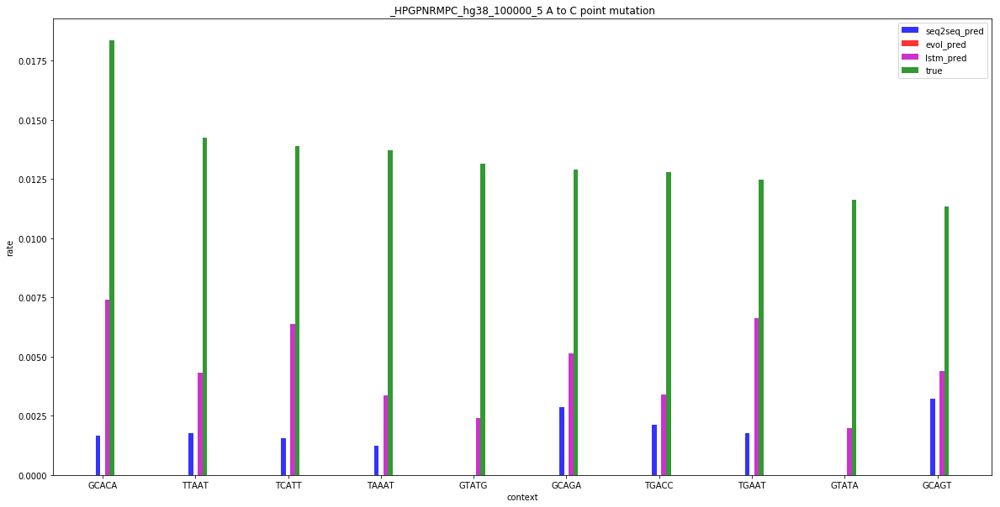

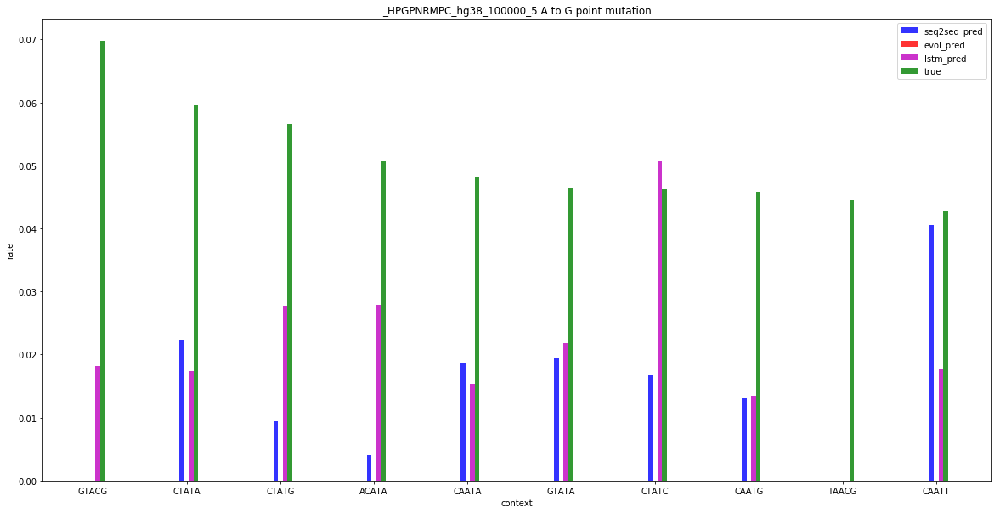

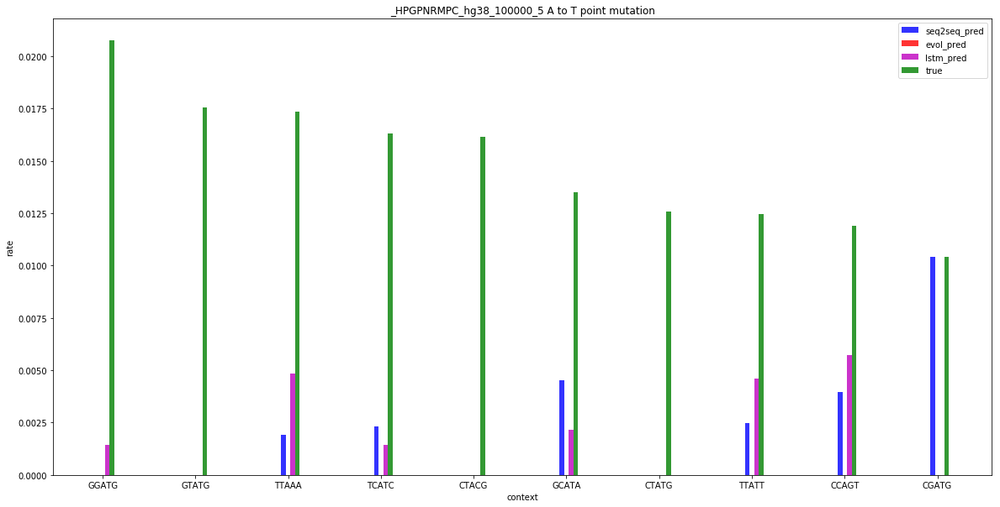

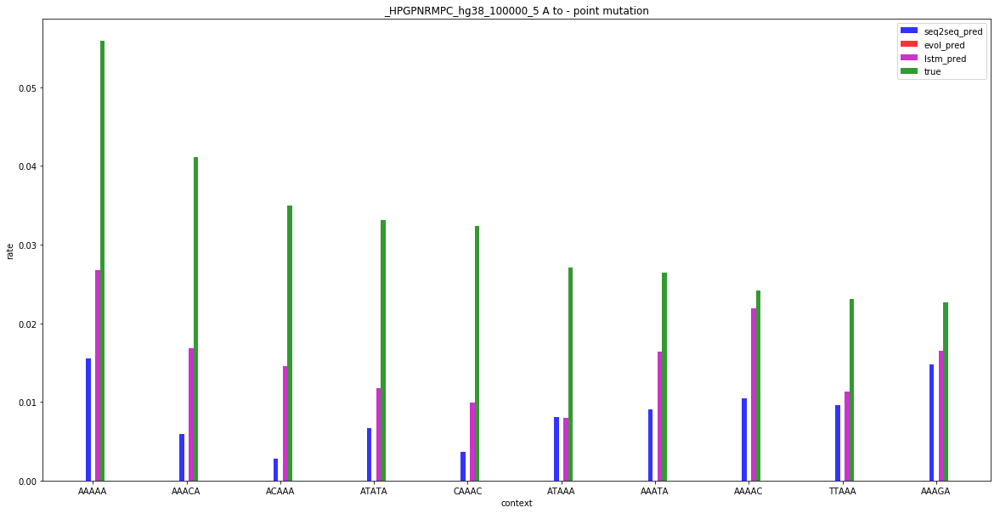

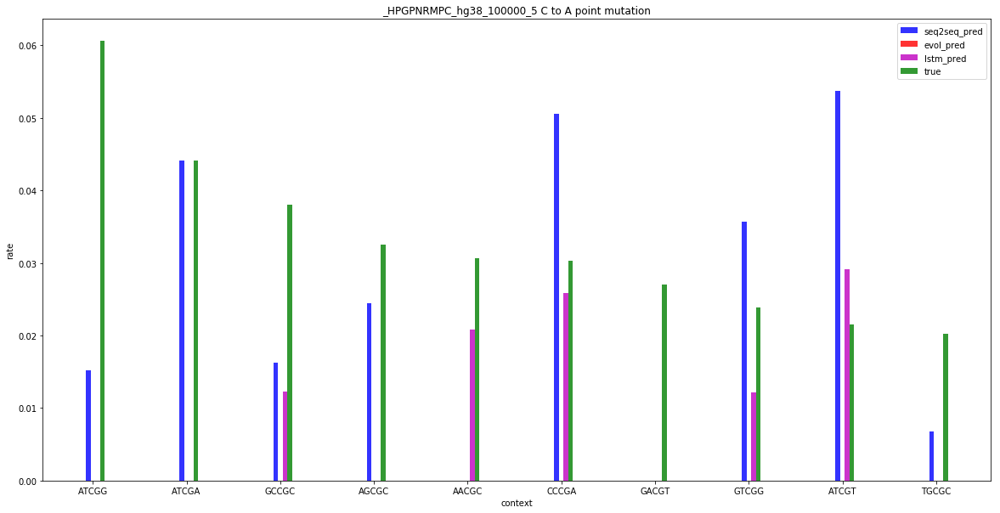

...

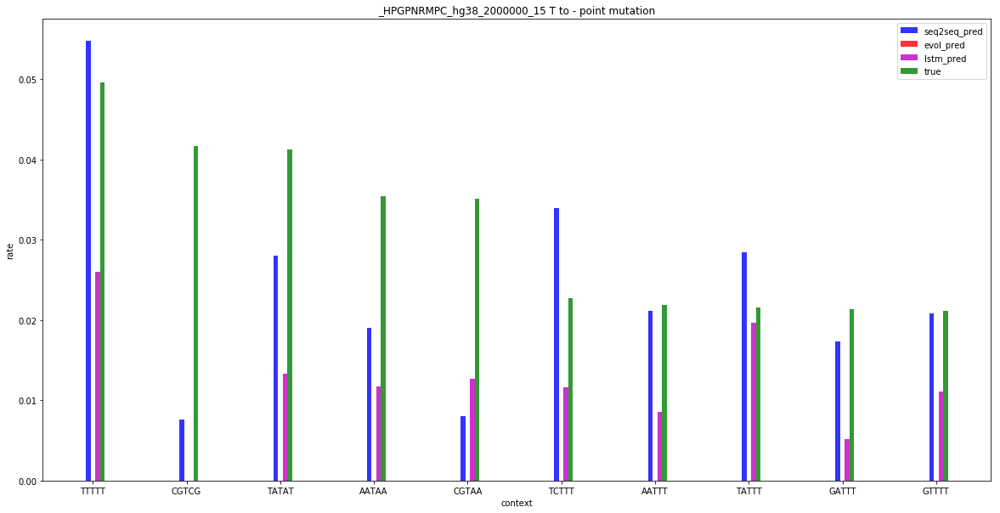

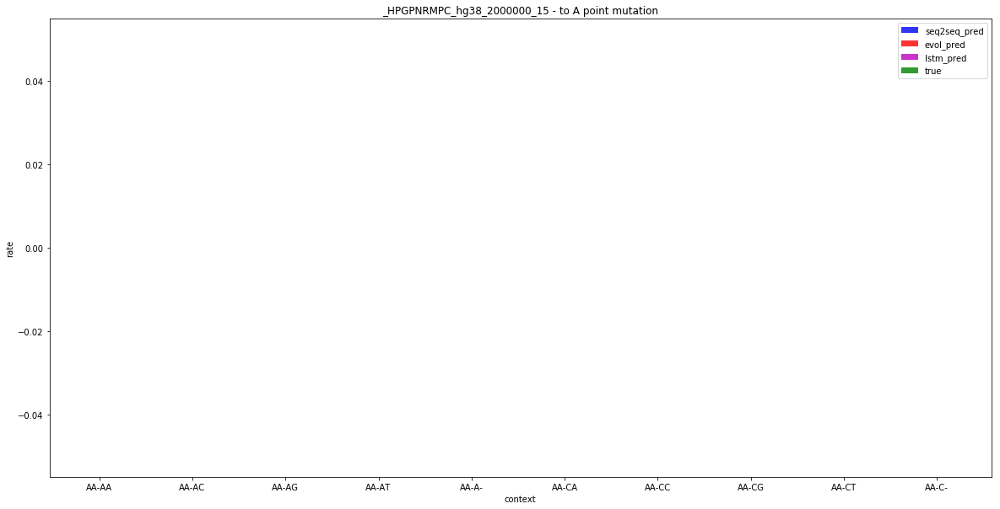

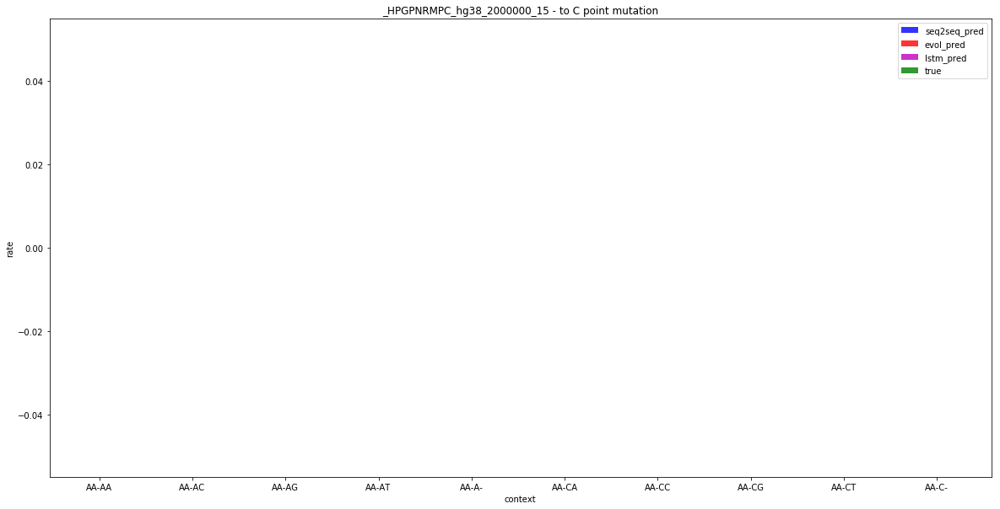

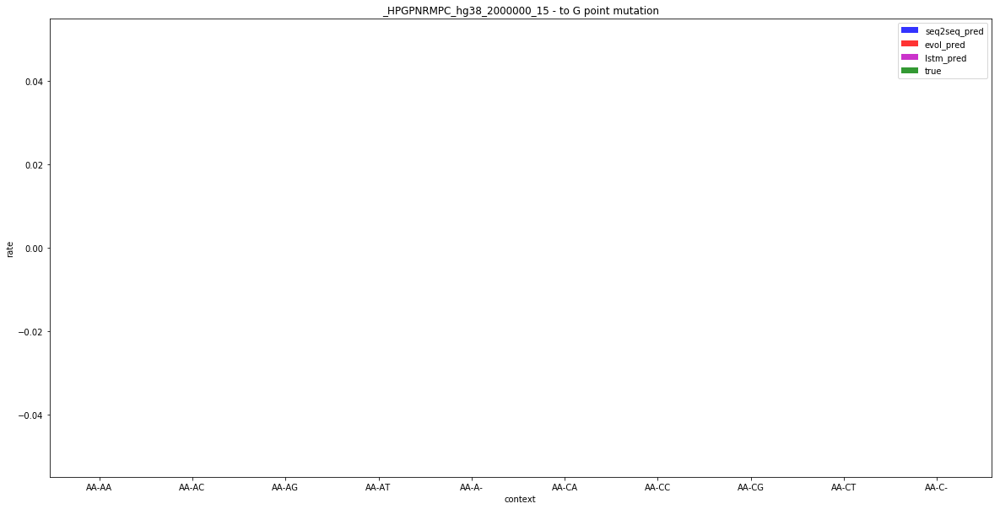

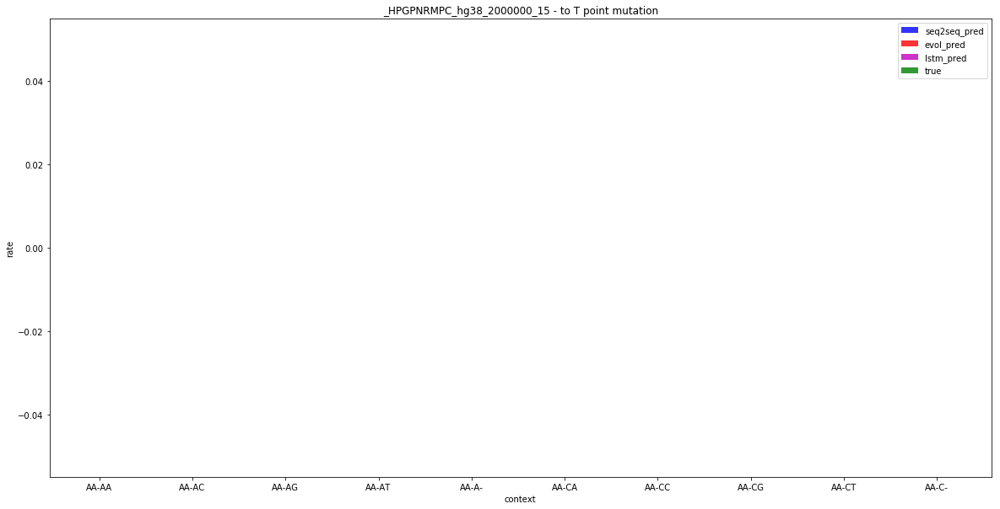

FileNotFoundError: [Errno 2] No such file or directory: 'data/pred_contextAC_HPGPNRMPChg38200000021.npy'

In [10]:
def plotPointMut(n_groups,ancNuc, desNuc, ancName, desName, train_size, seq_length):
    predSeq = np.load('data/pred_context{}{}{}{}{}{}.npy'.format(ancNuc,desNuc, ancName, desName, train_size, seq_length), allow_pickle = True).item()

    trueSeq = np.load('data/true_context{}{}{}{}{}{}.npy'.format(ancNuc,desNuc, ancName, desName, train_size, seq_length), allow_pickle = True).item()

    evolSeq = np.load('data/true_evol_context{}{}{}{}{}{}.npy'.format(ancNuc,desNuc, ancName, desName, train_size, seq_length), allow_pickle = True).item()
    
    lstmSeq = np.load('data/pred_lstm_context{}{}.npy'.format(ancNuc,desNuc), allow_pickle = True).item()
    true = list(trueSeq.values())[:n_groups]
    true_context = list(trueSeq.keys())[:n_groups]

    pred = []
    evol = []
    lstm = []
    for i in true_context:
        pred.append(predSeq[i])
        evol.append(evolSeq[i])
        lstm.append(lstmSeq[i])

    # create plot
    fig, ax = plt.subplots(figsize=(20, 10))
    index = np.arange(n_groups)
    bar_width = 0.05
    opacity = 0.8

    rects1 = plt.bar(index, pred, bar_width,
    alpha=opacity,
    color='b',
    label='seq2seq_pred')
    
    rects2 = plt.bar(index + bar_width, evol, bar_width,
    alpha=opacity,
    color='r',
    label='evol_pred')
    
    rects3 = plt.bar(index + bar_width*2, lstm, bar_width,
    alpha=opacity,
    color='m',
    label='lstm_pred')
    
    rects3 = plt.bar(index + bar_width*3, true, bar_width,
    alpha=opacity,
    color='g',
    label='true')

    plt.xlabel('context')
    plt.ylabel('rate')
    plt.title('{}_{}_{}_{} {} to {} point mutation'.format(ancName, desName, train_size, seq_length, ancNuc, desNuc))
    plt.xticks(index + bar_width, list(trueSeq.keys())[:n_groups])
    plt.legend()

    #plt.tight_layout()
    plt.show()
    plt.close()
    

for a in ancName:
    for b in desName:
        for t in train_size:
            for s in seq_length:
                for i in ancCase:
                    for j in desCase:
                        if i != j:
                            plotPointMut(numBin,i, j,a, b, t, s)

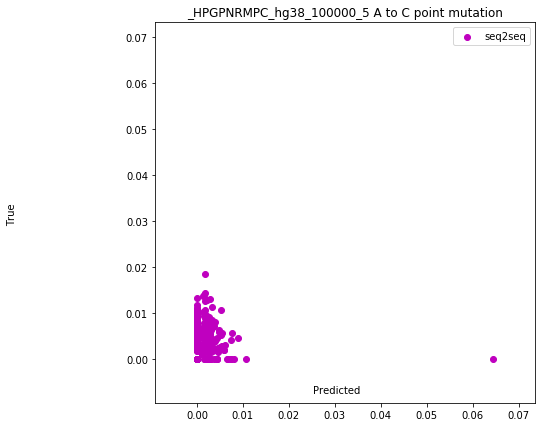

(0.13460709397561488, 0.0007413633590308349)


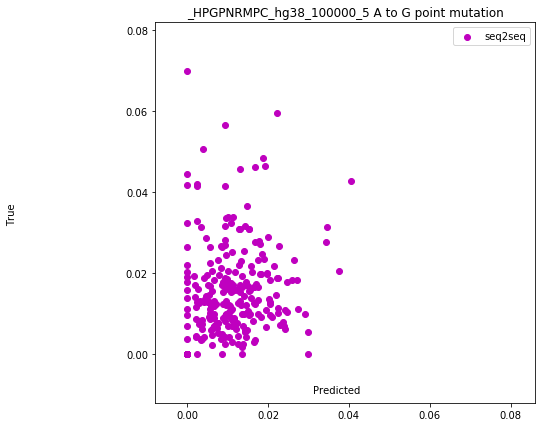

(0.5969726497626291, 1.3067380129269232e-61)


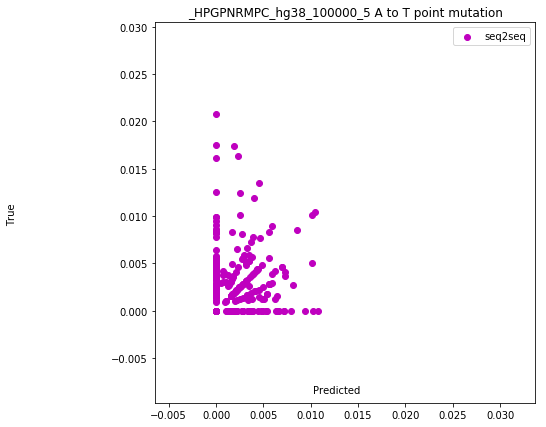

(0.34709991907749593, 3.9077712907058816e-19)


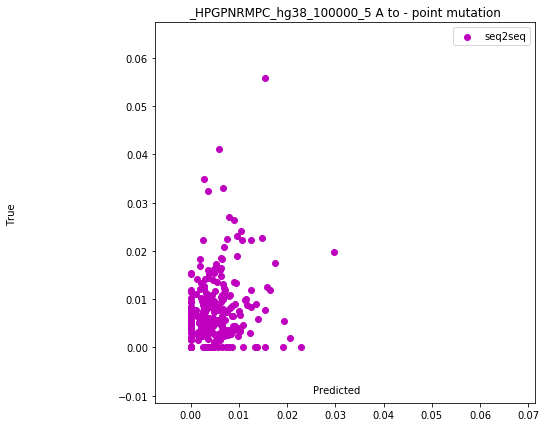

(0.5412497862959362, 7.463155669090833e-49)


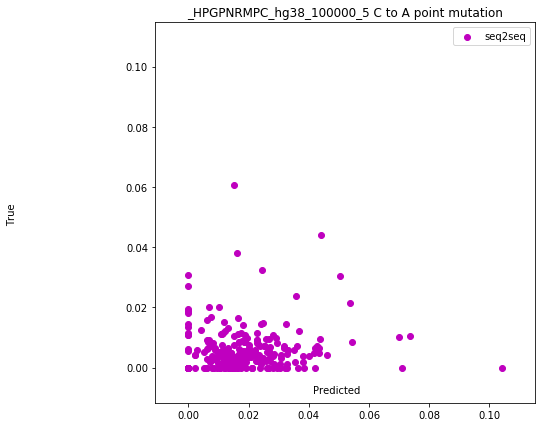

(0.406286098057679, 3.065484541330013e-26)


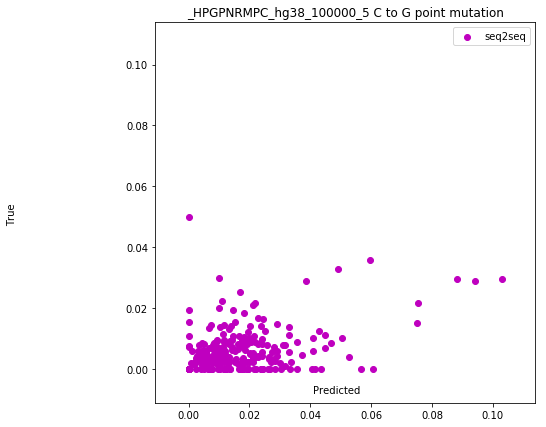

(0.589173287273016, 1.1285086500831657e-59)


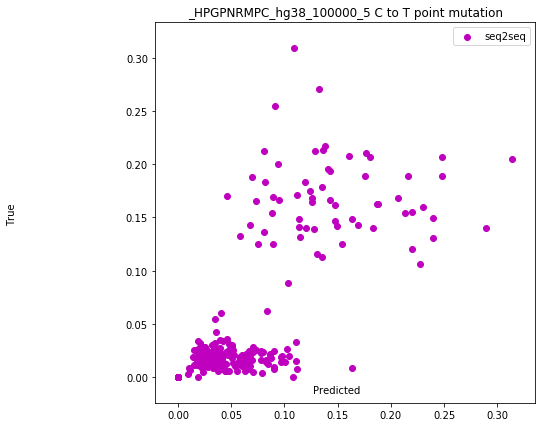

(0.8138948206967518, 4.797662167887462e-149)


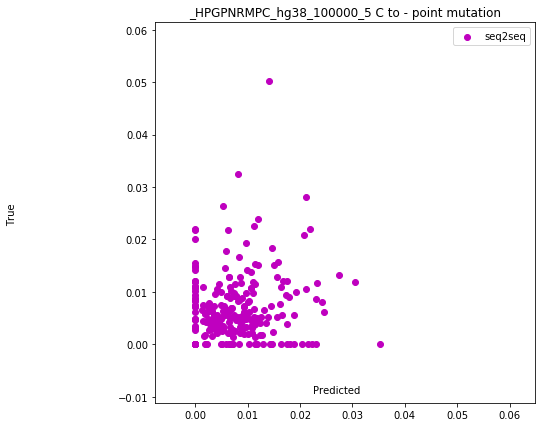

(0.4983358907129761, 1.534054527818721e-40)


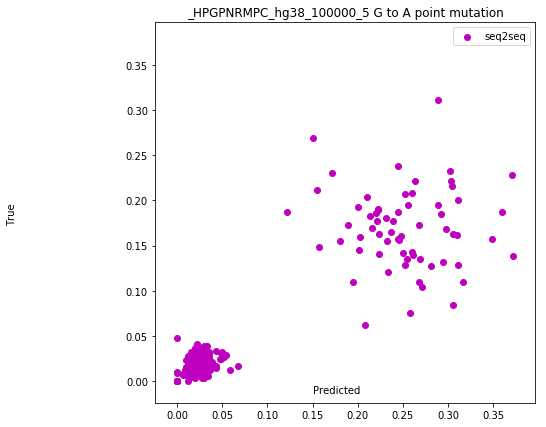

(0.9304504324909417, 7.818220469444276e-274)


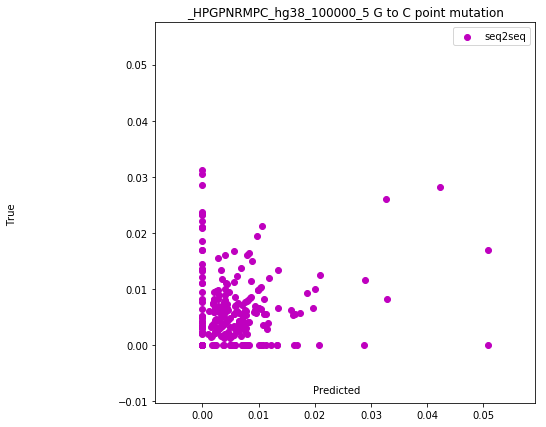

(0.39295899248632815, 1.6430684853132408e-24)


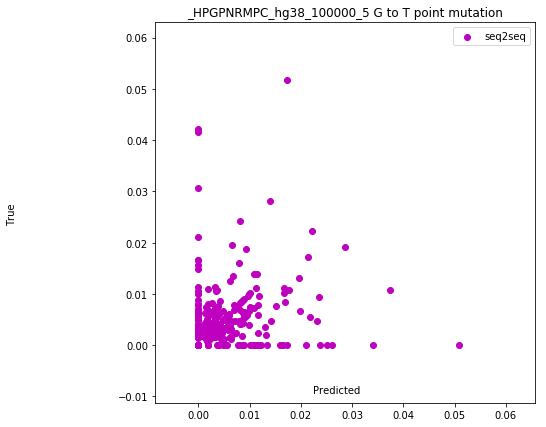

(0.3662942668548318, 2.794786910286941e-21)


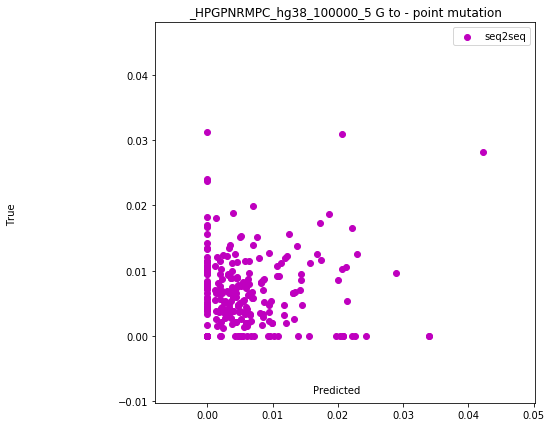

(0.41729933566966837, 9.940296417293067e-28)


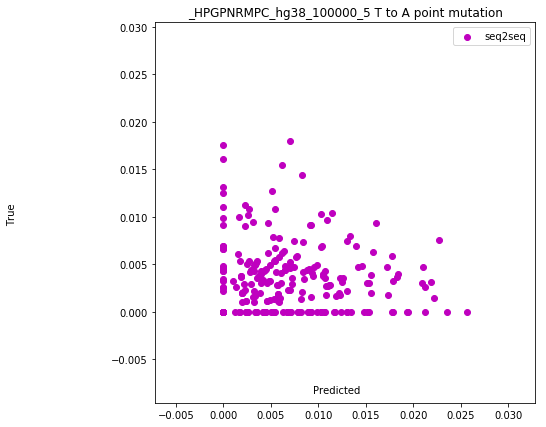

(0.3578320651785709, 2.5723161410182302e-20)


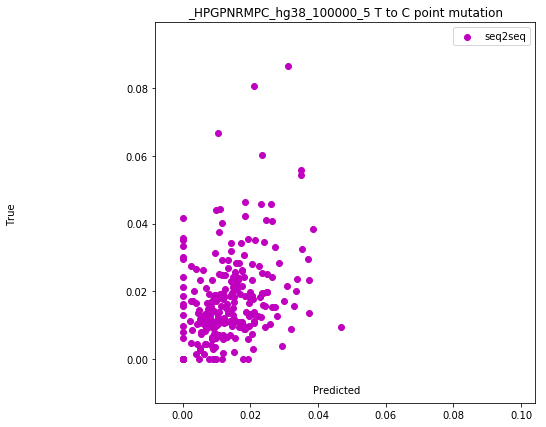

(0.6939387796697497, 6.214120585772165e-91)


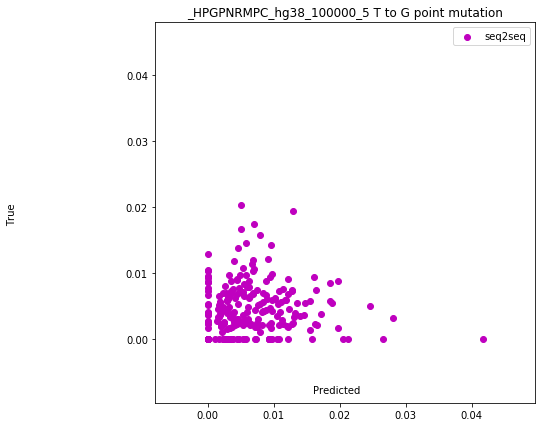

(0.45052808927240967, 1.4339314796943193e-32)


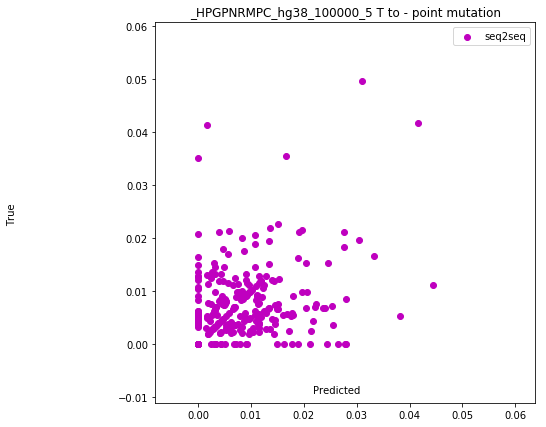

(0.5602934164910198, 6.076034224185489e-53)


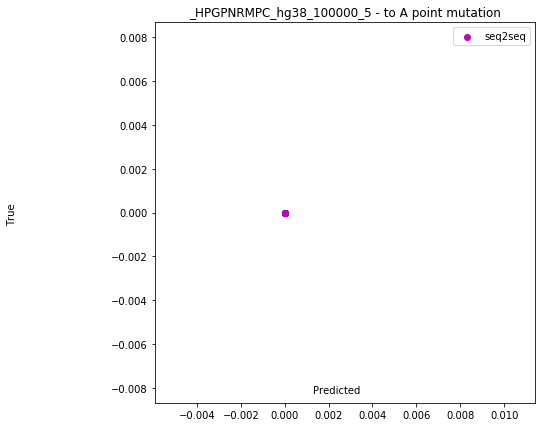

(nan, nan)


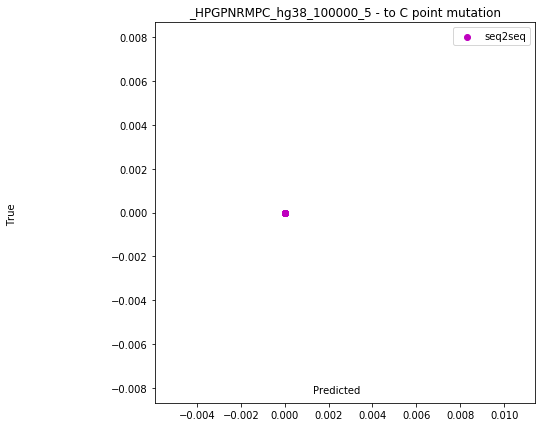

(nan, nan)


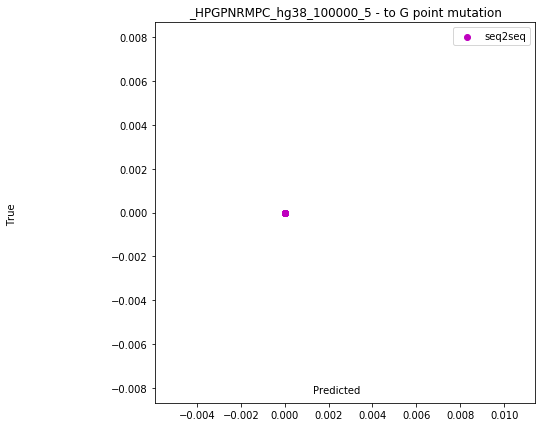

(nan, nan)


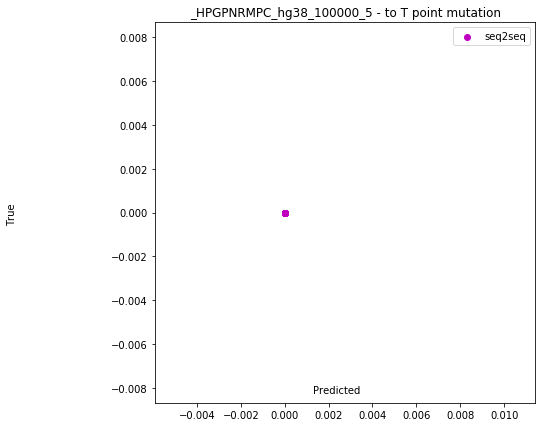

(nan, nan)


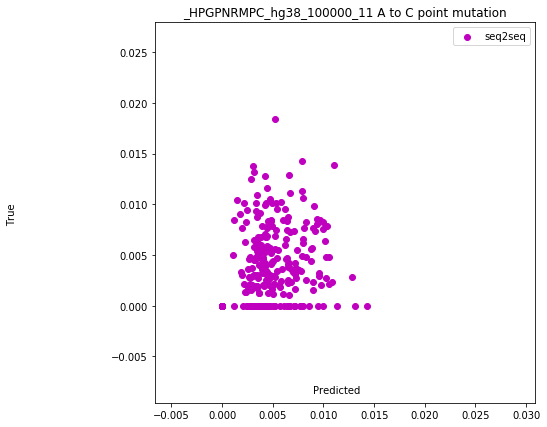

(0.6046231700723805, 1.4606313193552052e-63)


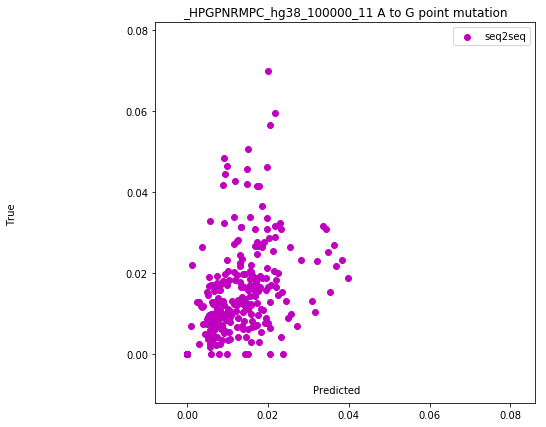

(0.7248451269209799, 6.600998674211431e-103)


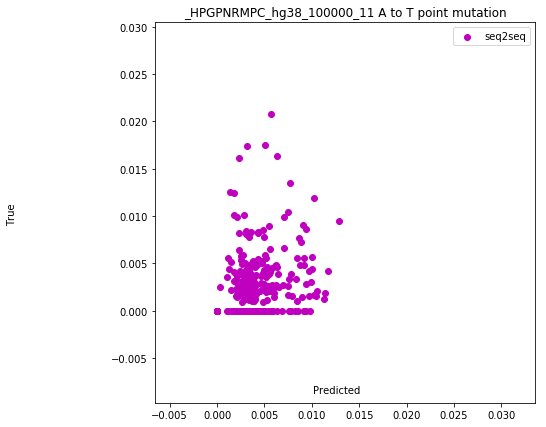

(0.5222388374010768, 5.03950755415362e-45)


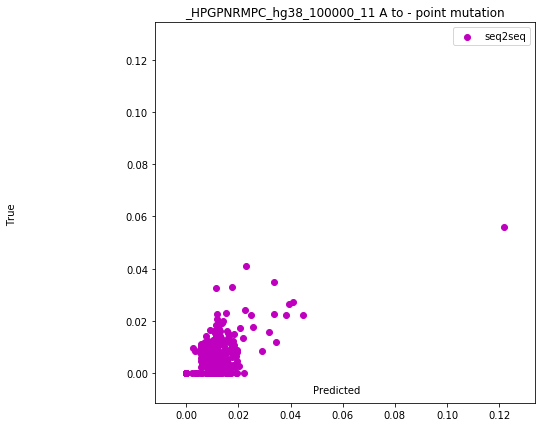

(0.769520010834182, 1.9277716898076994e-123)


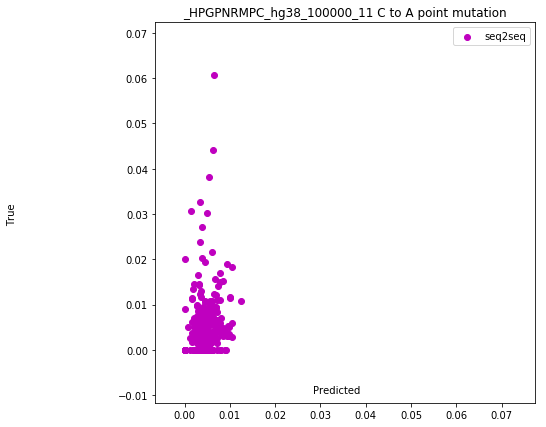

(0.508680105339443, 1.9458982356238473e-42)


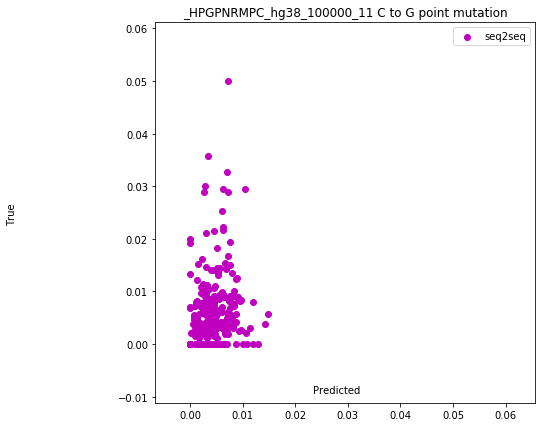

(0.511853940213642, 4.943252568812281e-43)


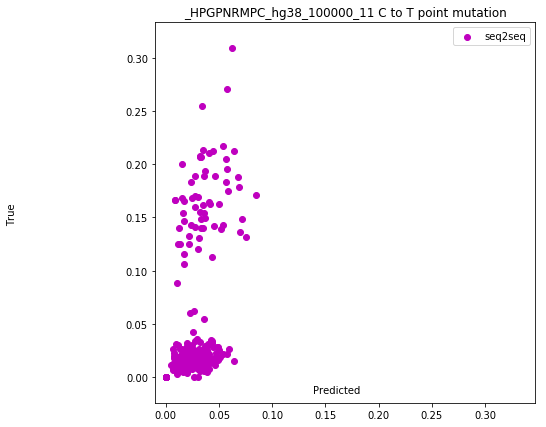

(0.6267914538131685, 1.581721166904527e-69)


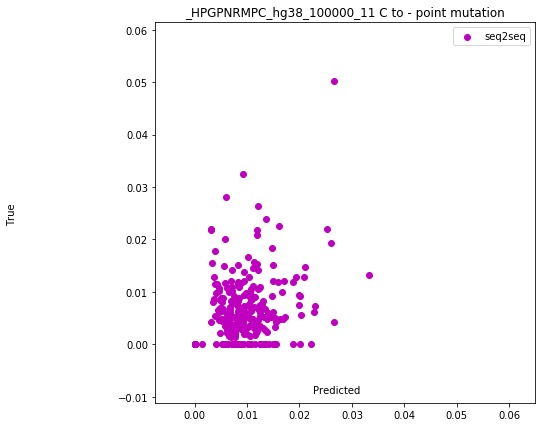

(0.6195264563230627, 1.6099053997935687e-67)


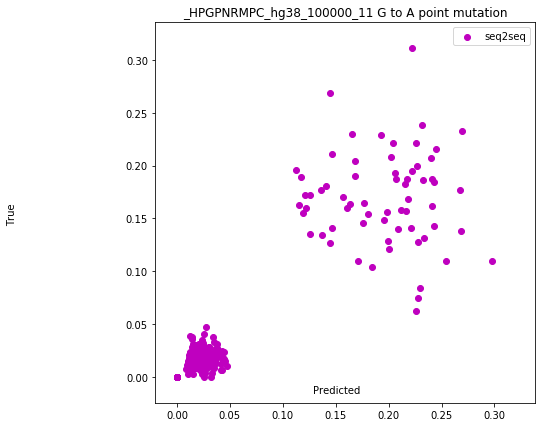

(0.9224326019171677, 1.242133884787159e-259)


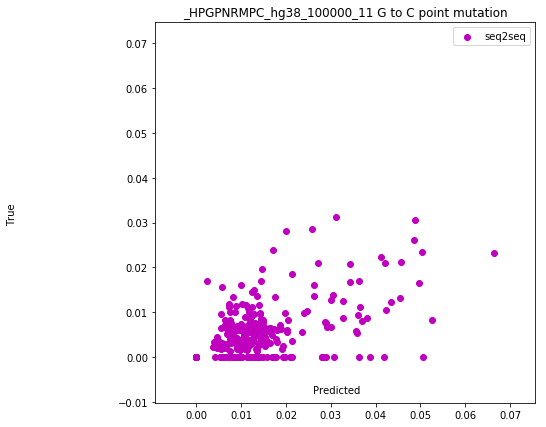

(0.7060643446762465, 1.914841108998092e-95)


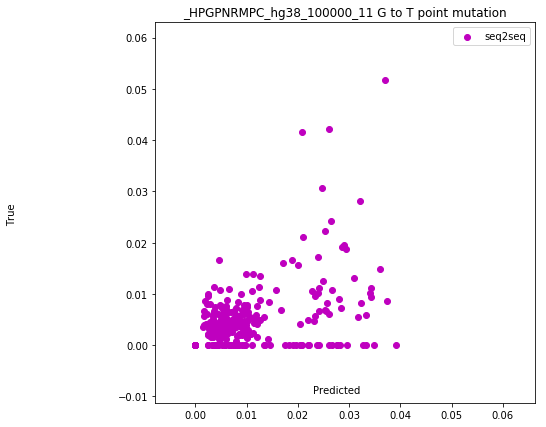

(0.6034472650736031, 2.937354637812614e-63)


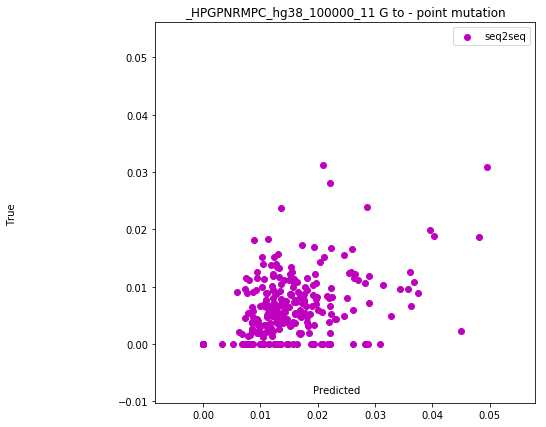

(0.7023331489455971, 4.950958544494263e-94)


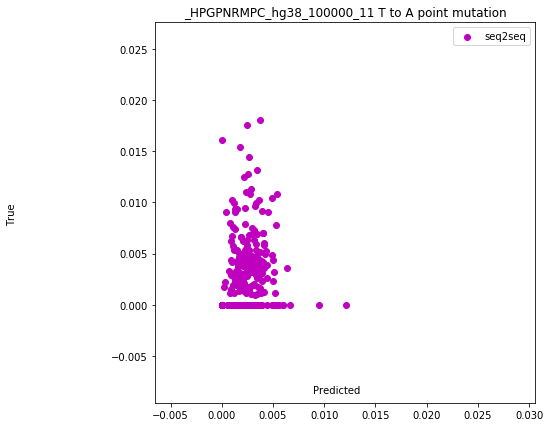

(0.46933199482120674, 1.4818702576009498e-35)


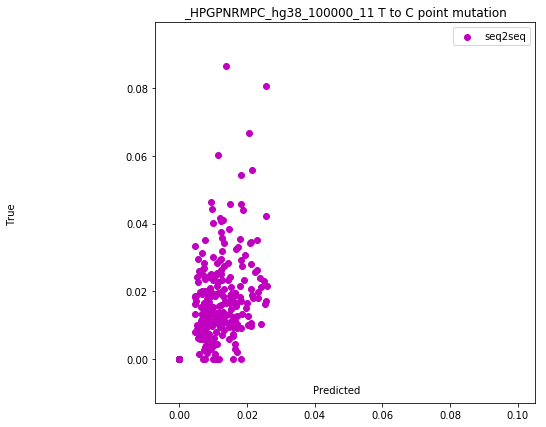

(0.7399106114433001, 2.3421312126842007e-109)


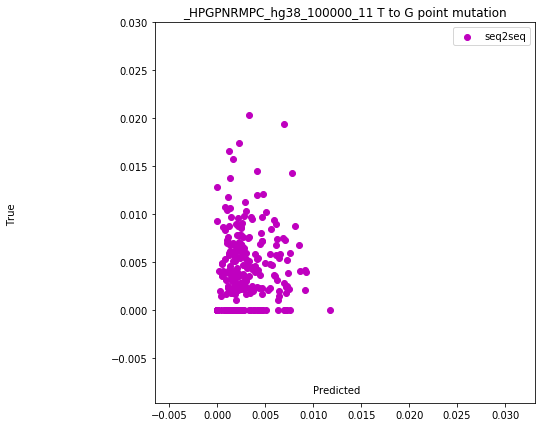

(0.5034920751543037, 1.7722259246392897e-41)


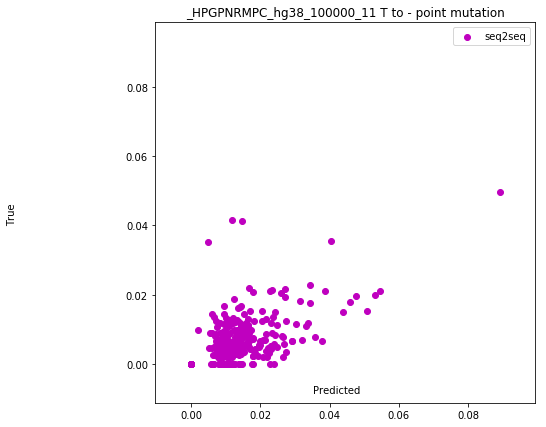

(0.739627814875564, 3.124640201229591e-109)


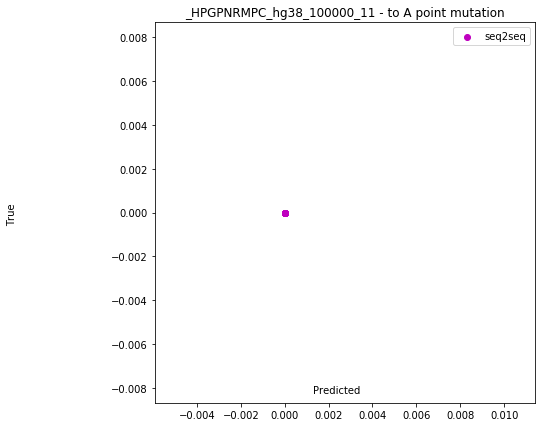

(nan, nan)


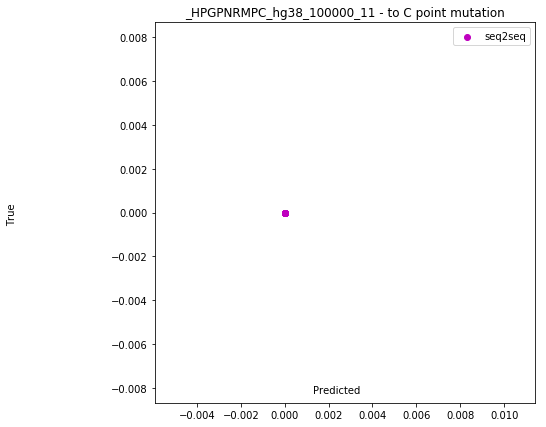

(nan, nan)


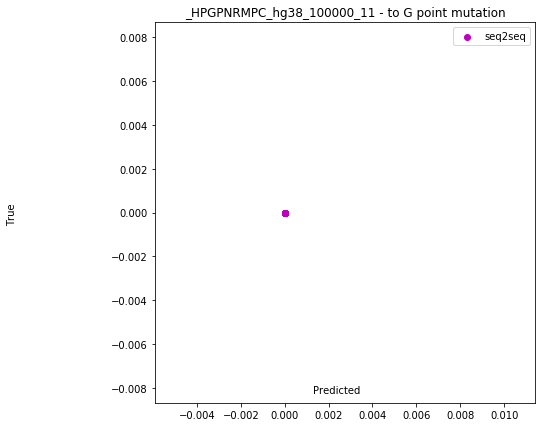

(nan, nan)


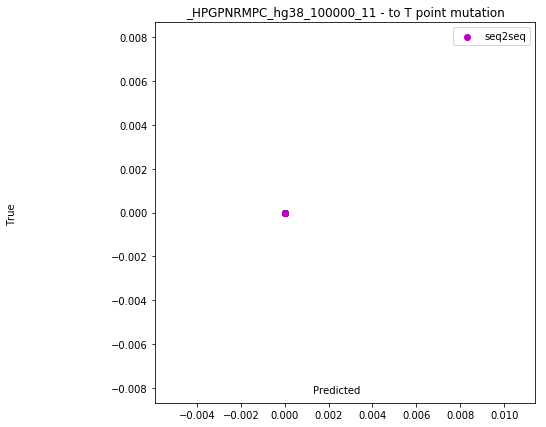

(nan, nan)


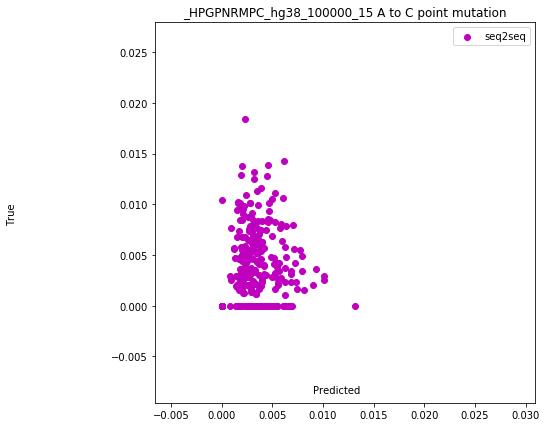

(0.5147119908118922, 1.4214390213332506e-43)


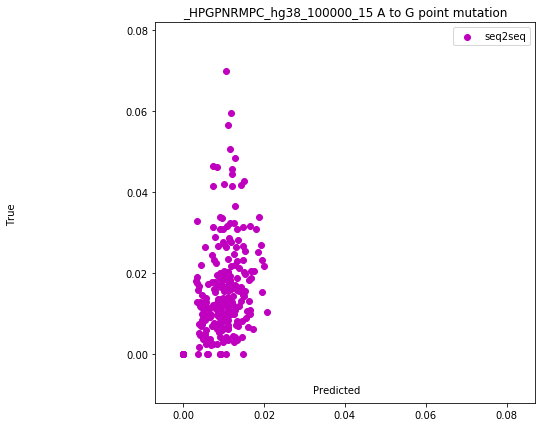

(0.7368838528630202, 5.024393985254832e-108)


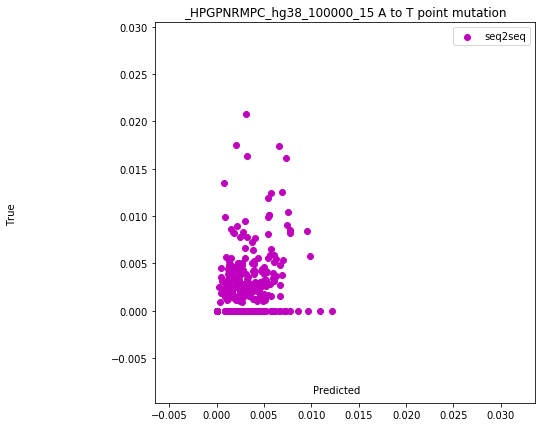

(0.5132487740644122, 2.6945572404743212e-43)


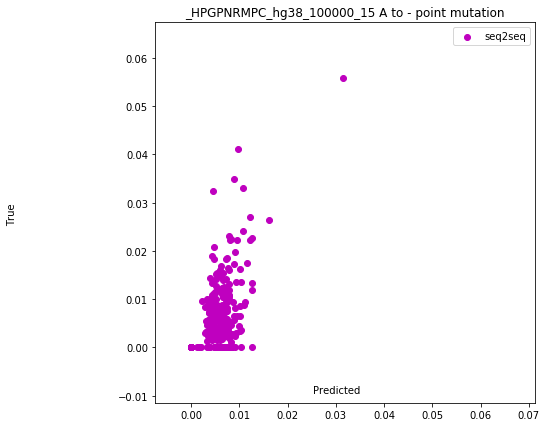

(0.7313520377384801, 1.2232515938210926e-105)


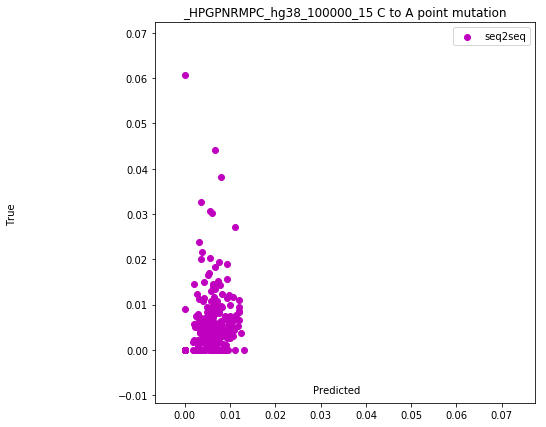

(0.47609807005902066, 1.1226623969057495e-36)


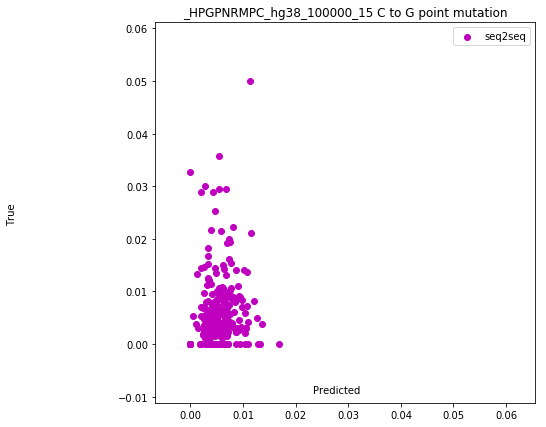

(0.5128158796704545, 3.2539025376250746e-43)


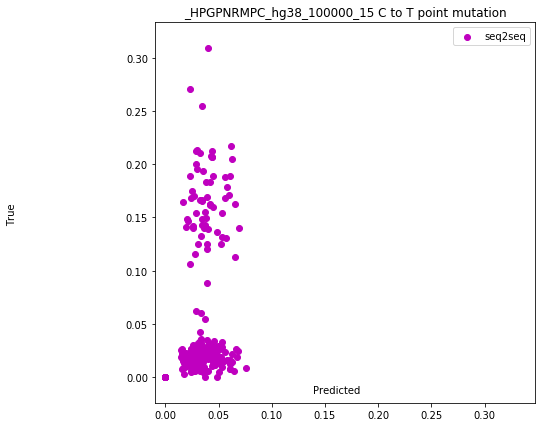

(0.5461191069796041, 7.115322315569069e-50)


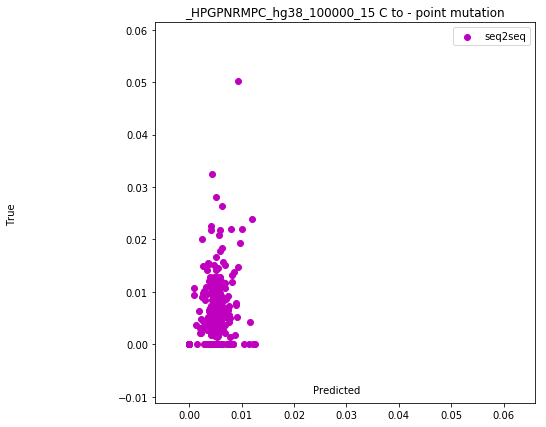

(0.6180458801917188, 4.069270209129038e-67)


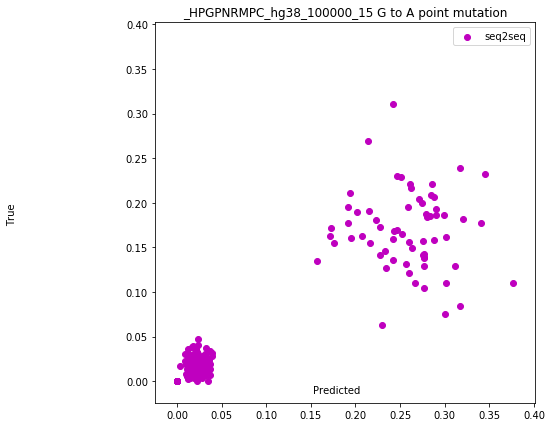

(0.9366850960470714, 4.176543483353747e-286)


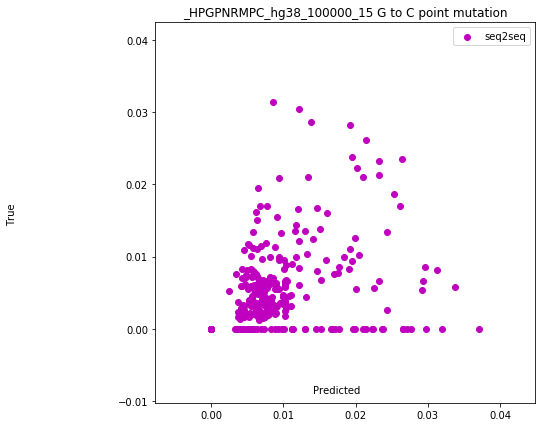

(0.5624694757532852, 1.992197769033982e-53)


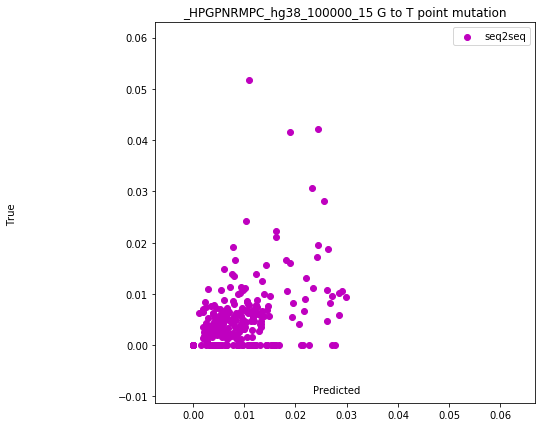

(0.6124423923391068, 1.301319839460242e-65)


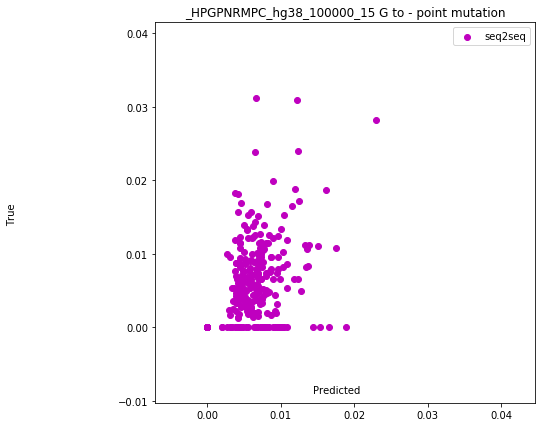

(0.6825640061637088, 6.693199441273106e-87)


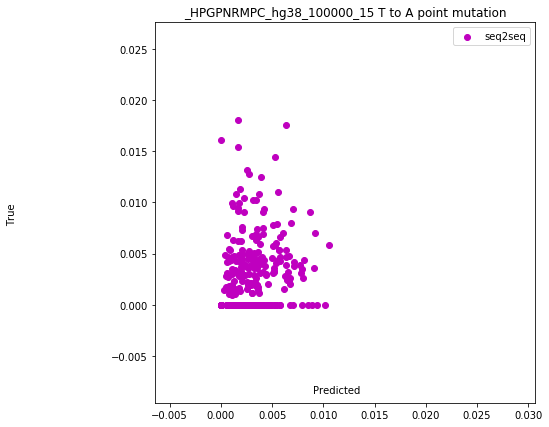

(0.4888366581845867, 7.436632681260245e-39)


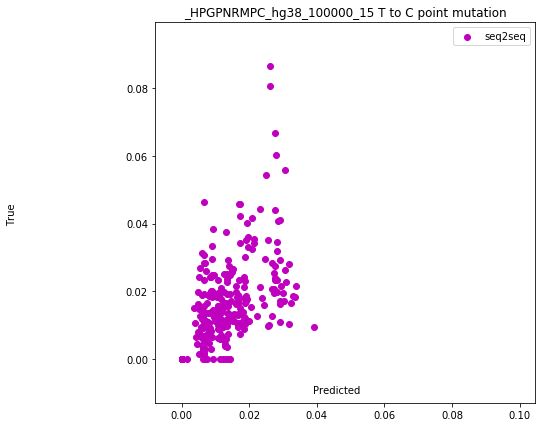

(0.7717766286287235, 1.3339198354734716e-124)


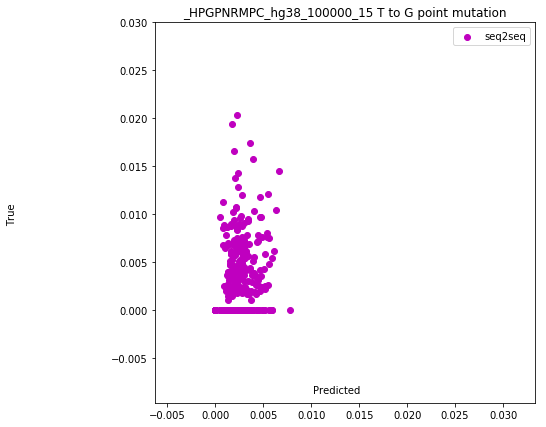

(0.5669913635228057, 1.9116818981645895e-54)


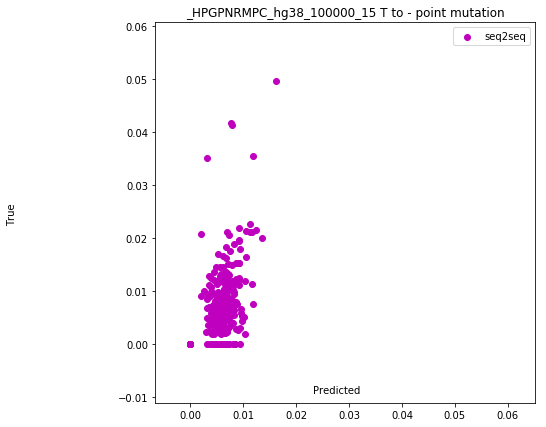

(0.7238380292204536, 1.7196666630408606e-102)


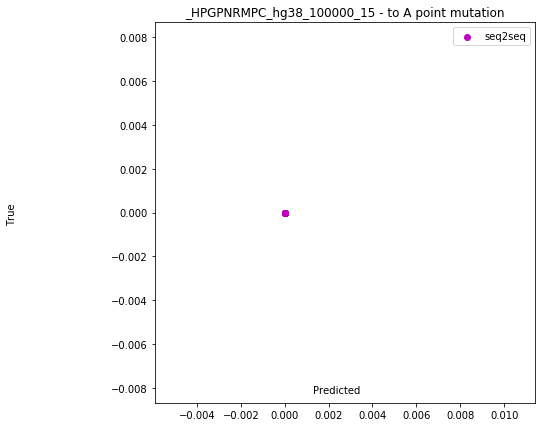

(nan, nan)


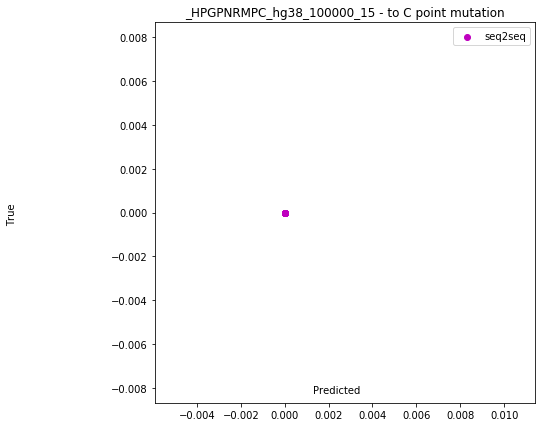

(nan, nan)


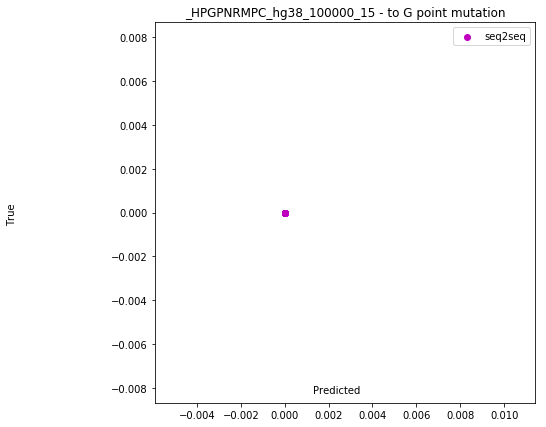

(nan, nan)


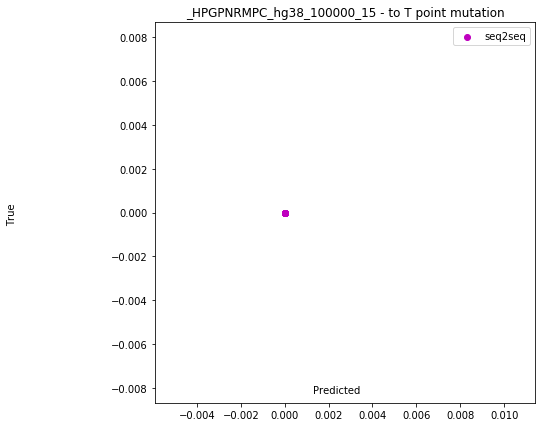

(nan, nan)


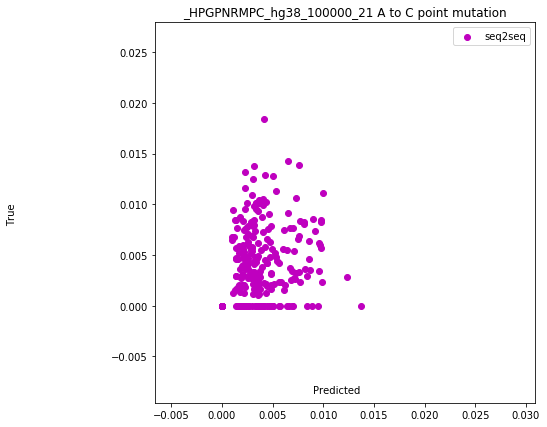

(0.5814121418715628, 8.4676051879796e-58)


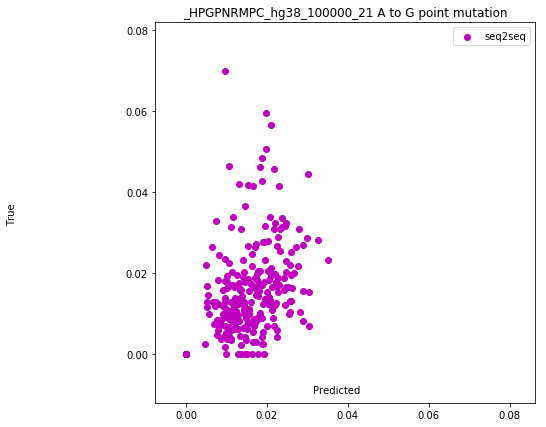

(0.7460559507607608, 4.057081752197995e-112)


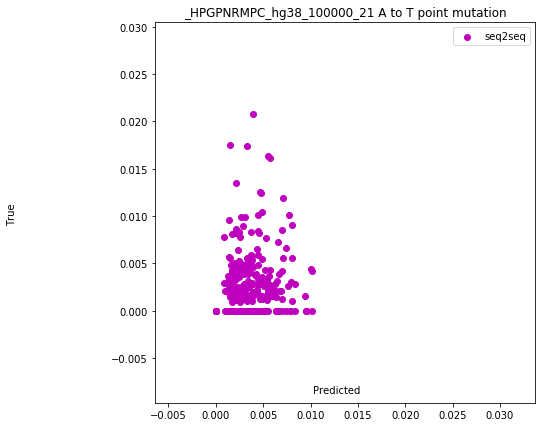

(0.46066403718155696, 3.7172495052772703e-34)


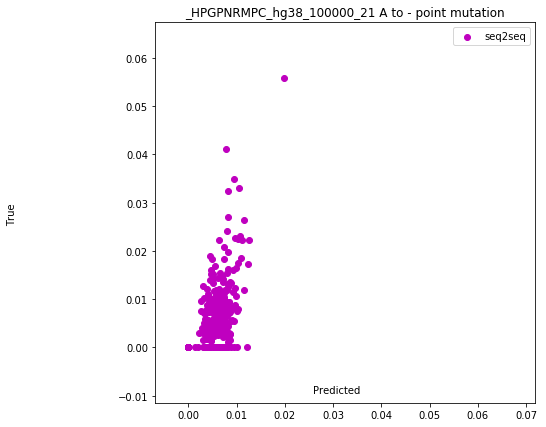

(0.7132795658135231, 3.065187004558031e-98)


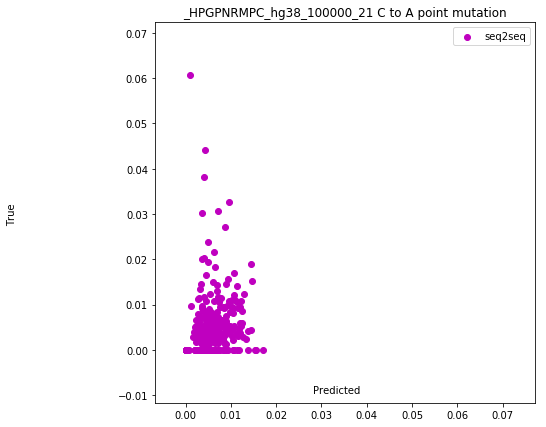

(0.46270934136443176, 1.752349829630247e-34)


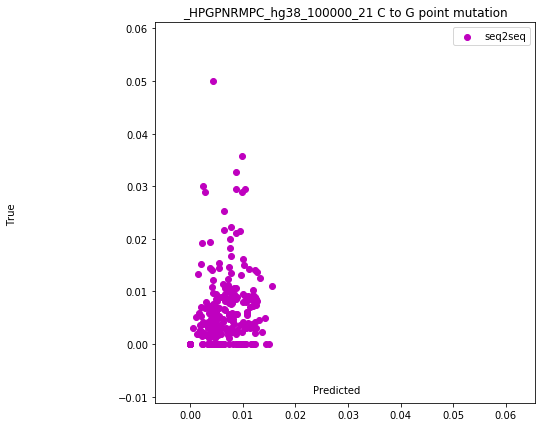

(0.5266887473133203, 6.725052741428015e-46)


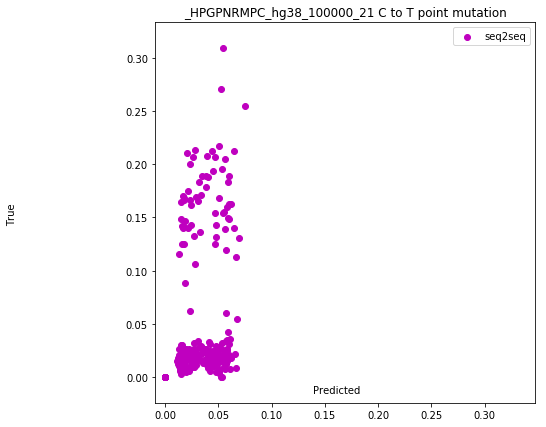

(0.5230787795909789, 3.4536384219804066e-45)


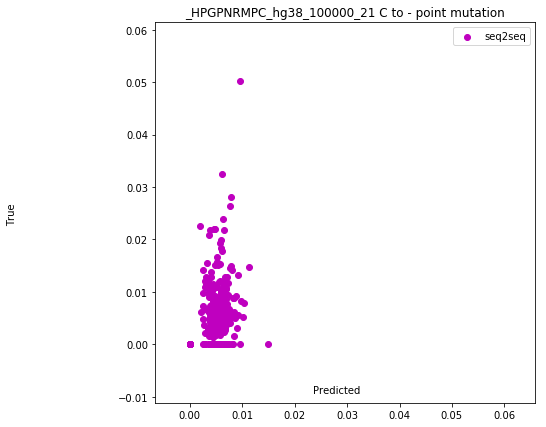

(0.6133096766671852, 7.646133915863439e-66)


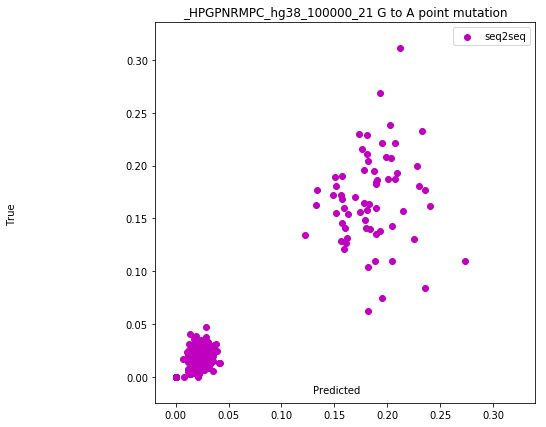

(0.948022569026363, 5.157797852403e-312)


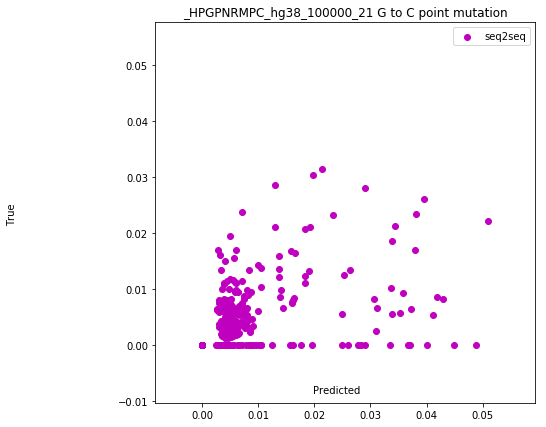

(0.5464036321748711, 6.194872641467839e-50)


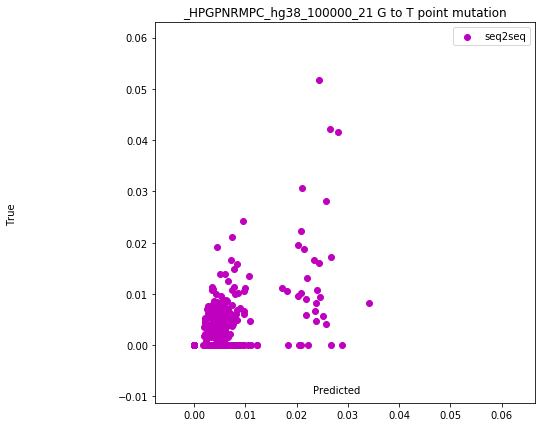

(0.6563635426167646, 2.807787003798407e-78)


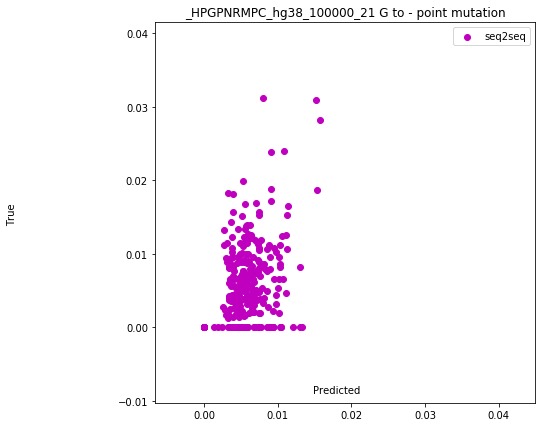

(0.684356613177098, 1.593785075219316e-87)


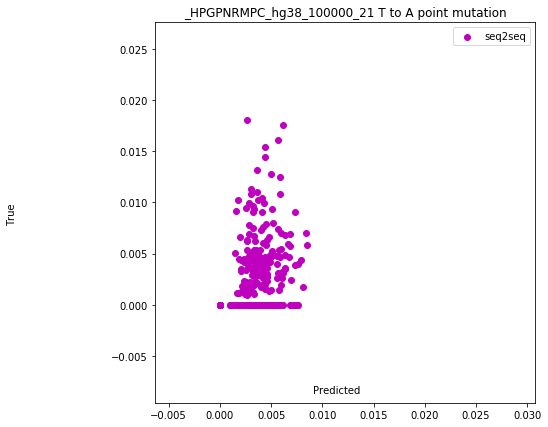

(0.579522999865478, 2.3802999321696594e-57)


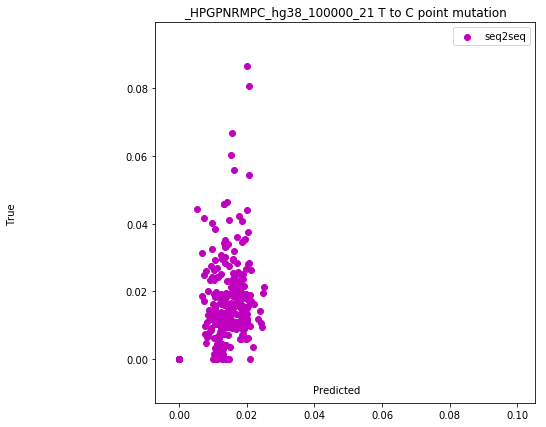

(0.7137783168079954, 1.9498534997340488e-98)


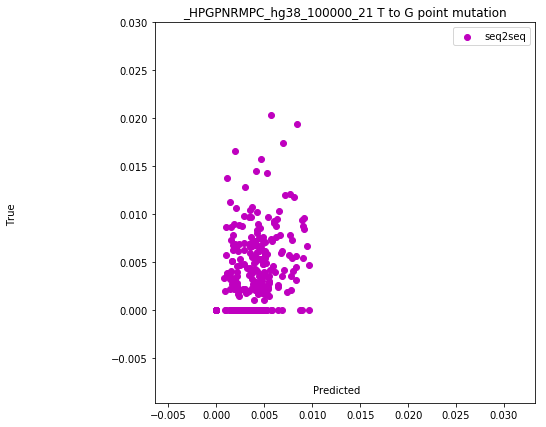

(0.6352416581732403, 6.251247845868603e-72)


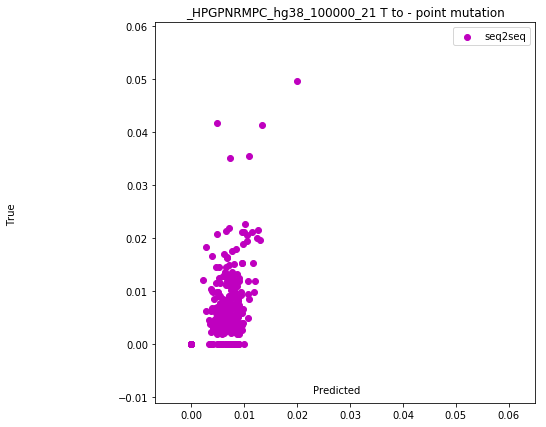

(0.7278834174489925, 3.579130245979924e-104)


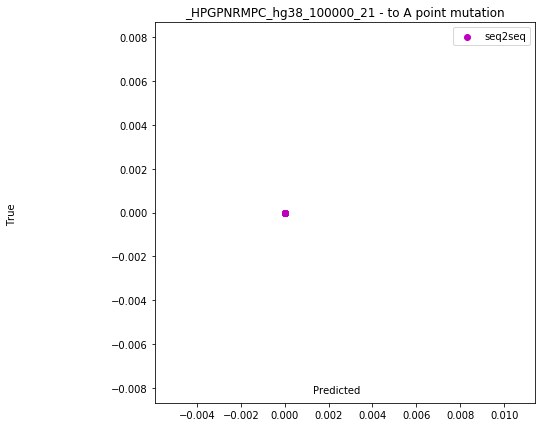

(nan, nan)


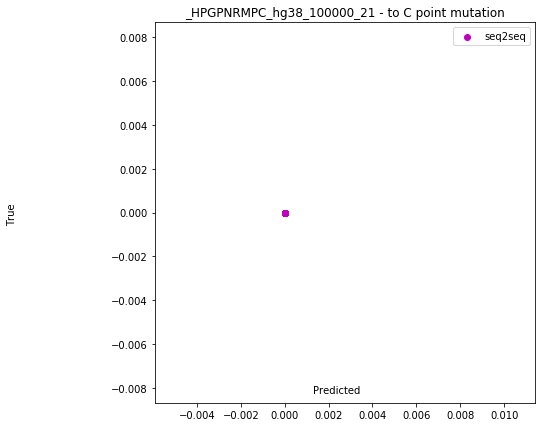

(nan, nan)


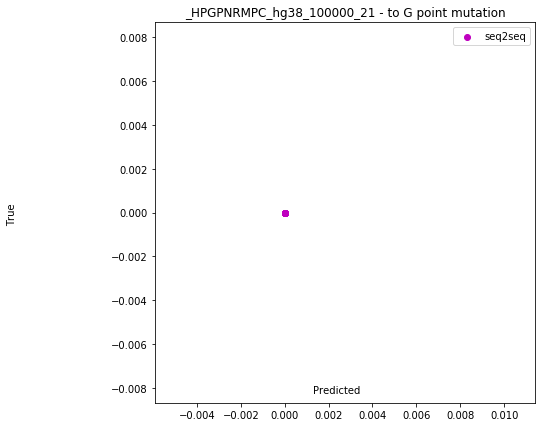

(nan, nan)


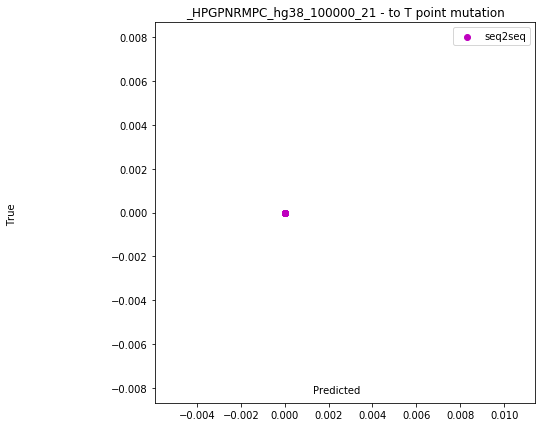

(nan, nan)


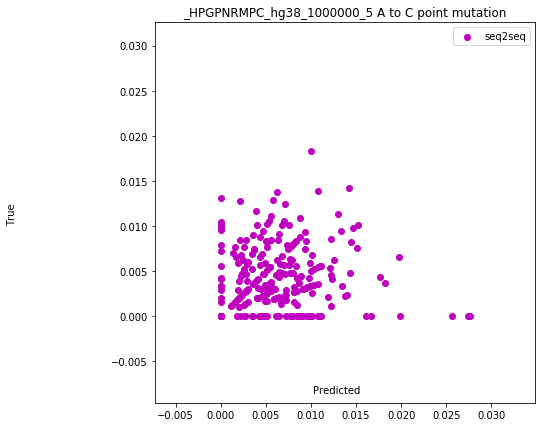

(0.5103276965170369, 9.571316759382391e-43)


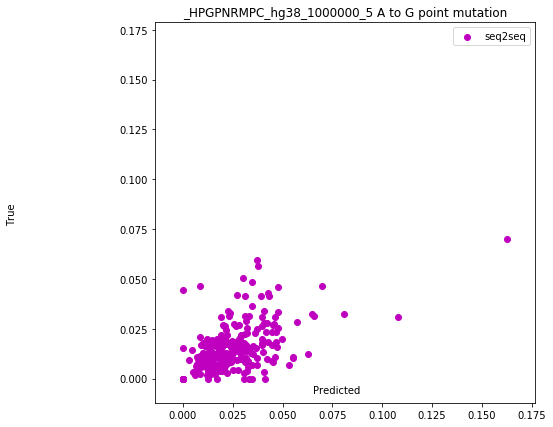

(0.777081257649205, 2.213509526703708e-127)


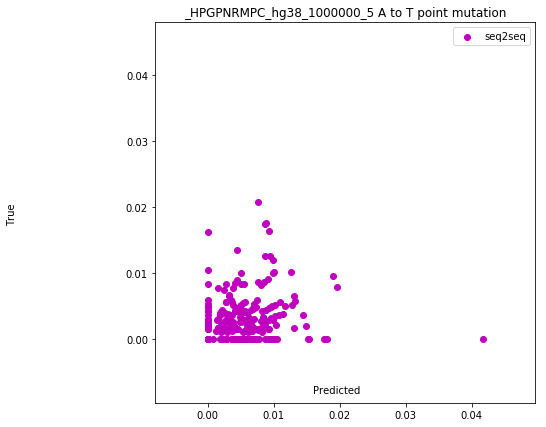

(0.47386621167256165, 2.6463619369028613e-36)


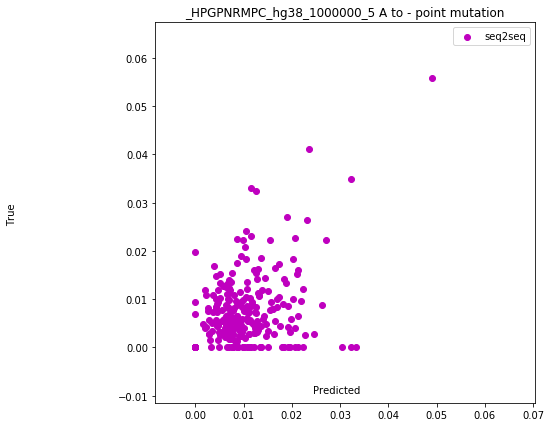

(0.6424016446958709, 5.0148515860091796e-74)


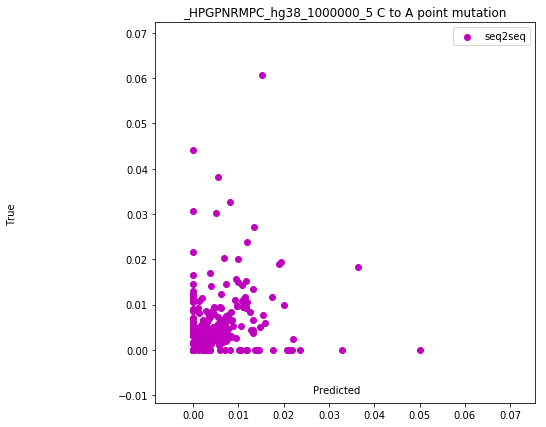

(0.3933946069494705, 1.4466707887834631e-24)


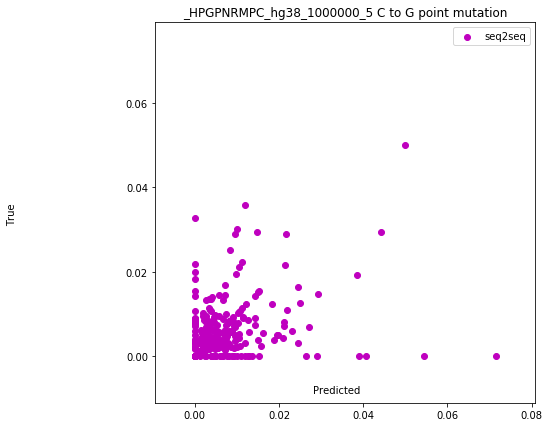

(0.4784950591722527, 4.438403904506857e-37)


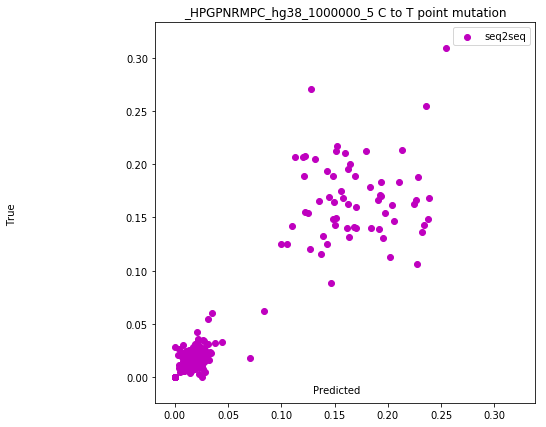

(0.9431231342662518, 3.6322385306181546e-300)


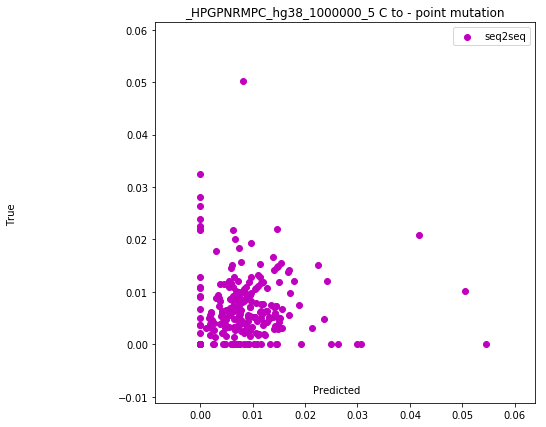

(0.43689144393803414, 1.615330037040804e-30)


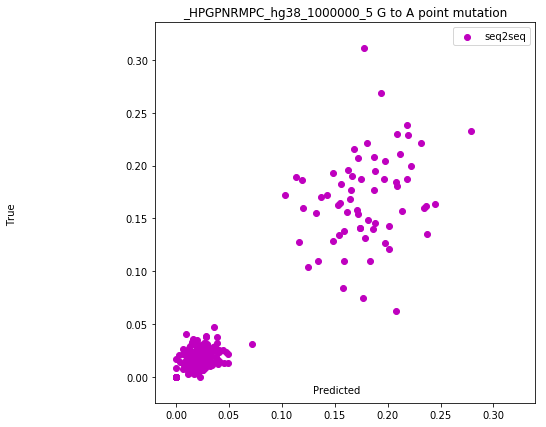

(0.9476553987002103, 4.359264481953e-311)


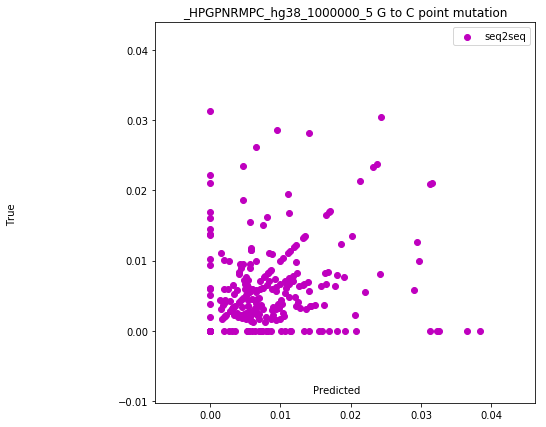

(0.5127690077329448, 3.3209865372371356e-43)


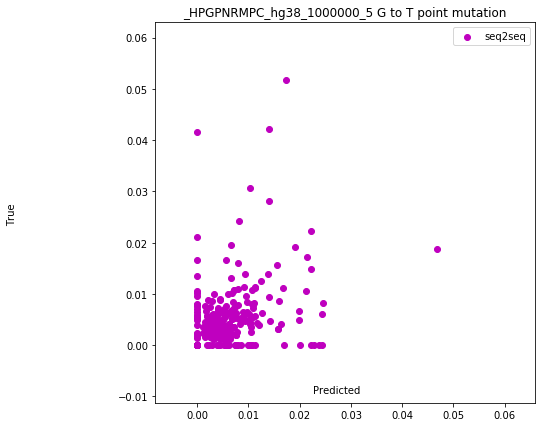

(0.5292592147566357, 2.0724748476058136e-46)


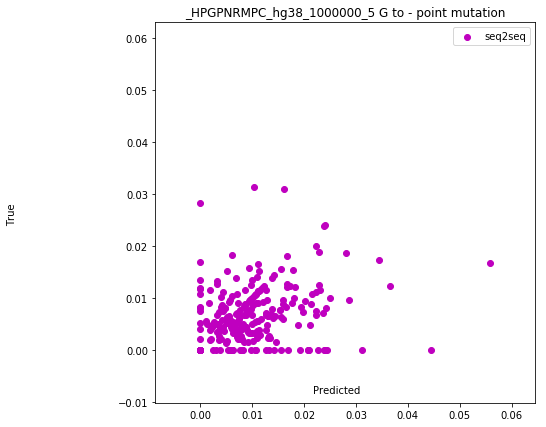

(0.6088506570186867, 1.1566748934626731e-64)


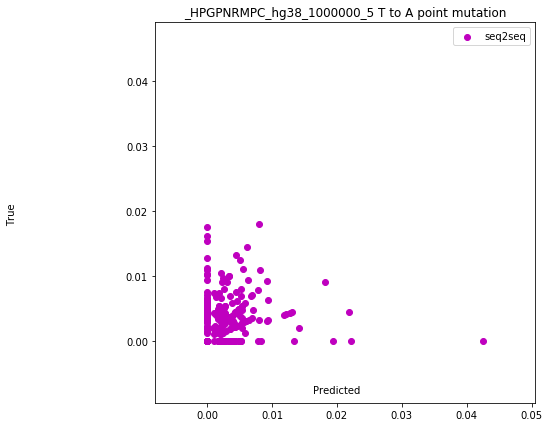

(0.32673798818725336, 5.1477739202613493e-17)


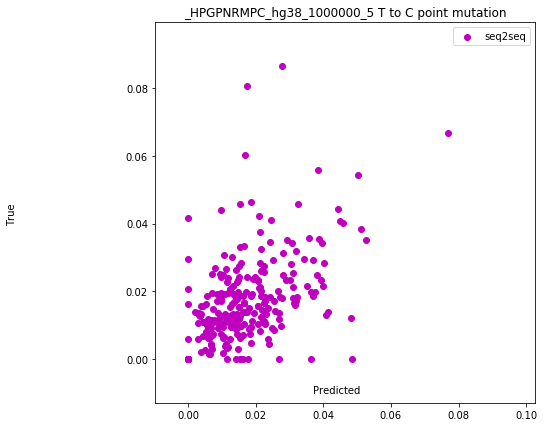

(0.7527146920919989, 3.3472144302270104e-115)


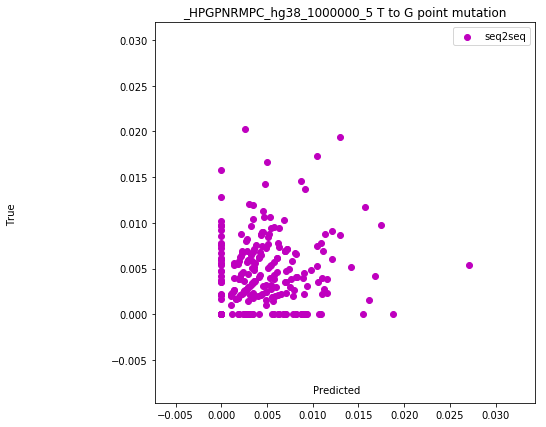

(0.508831589287913, 1.8233008703395993e-42)


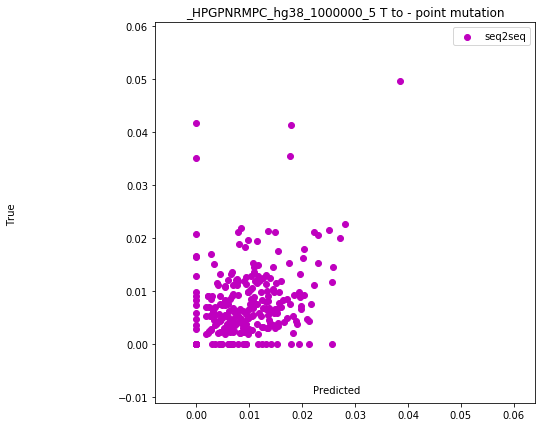

(0.6333681392621255, 2.1638814448102732e-71)


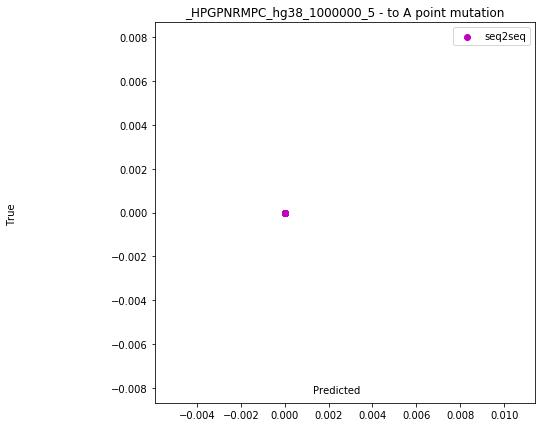

(nan, nan)


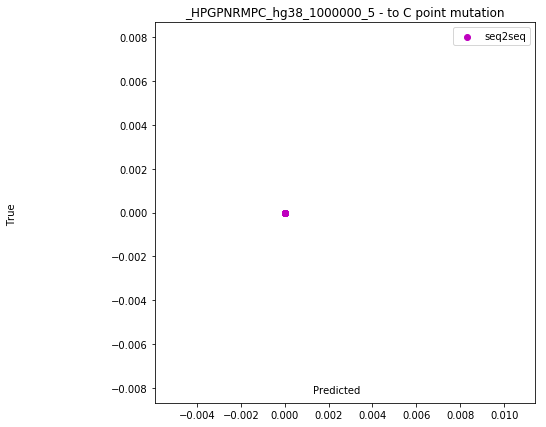

(nan, nan)


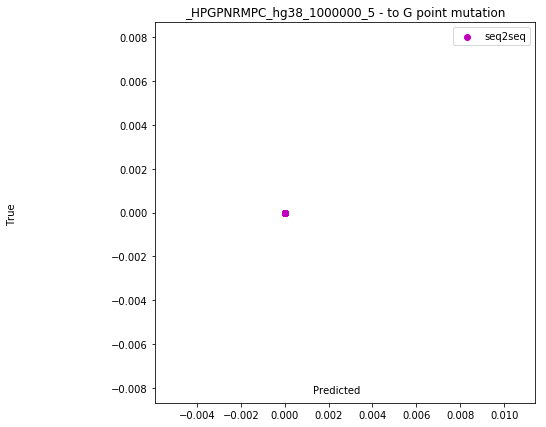

(nan, nan)


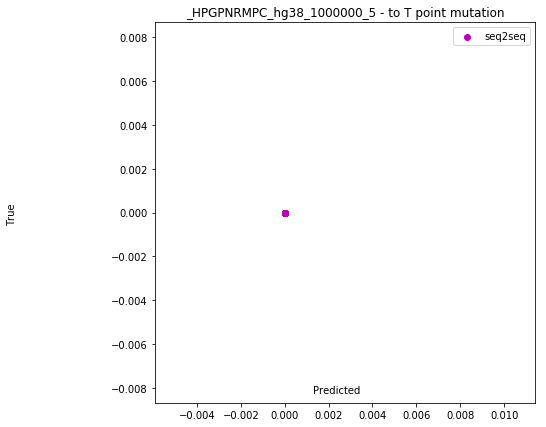

(nan, nan)


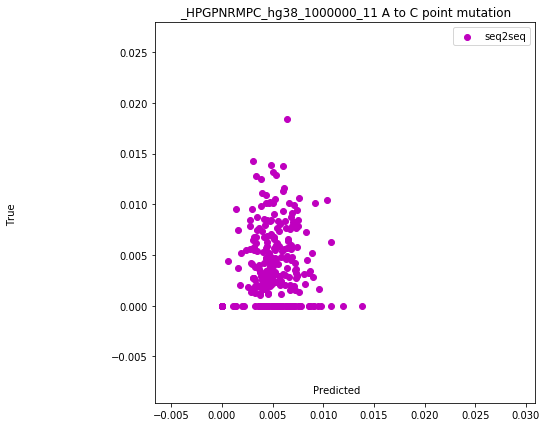

(0.5932029883734629, 1.144642089842774e-60)


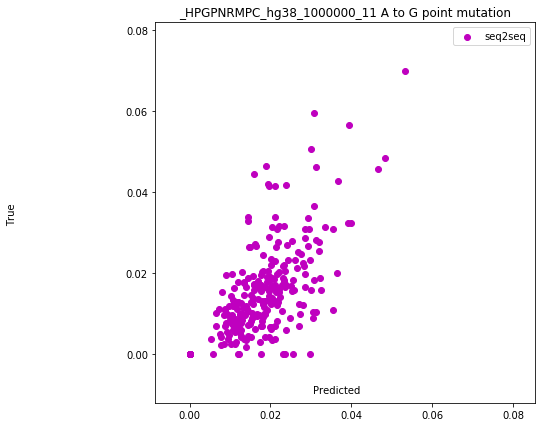

(0.8411066529016866, 1.9765404628619118e-168)


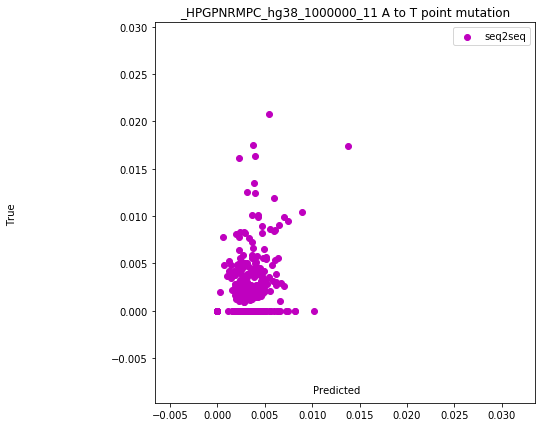

(0.5652204077375609, 4.807789078521122e-54)


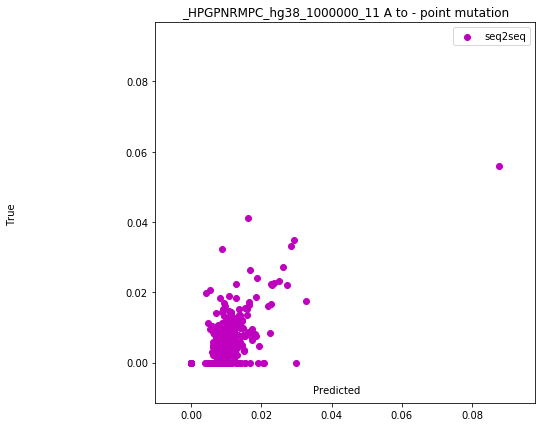

(0.7761436534214217, 6.950538552688819e-127)


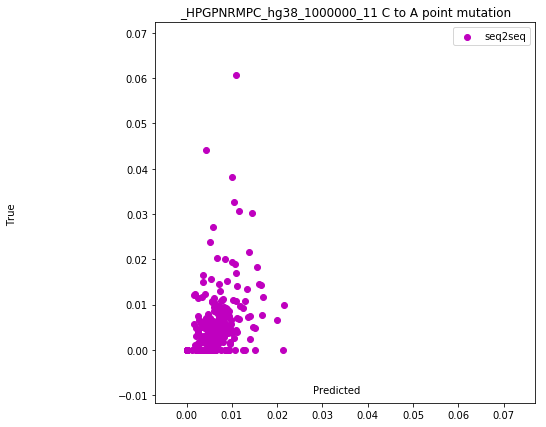

(0.5813351372247963, 8.833132445837788e-58)


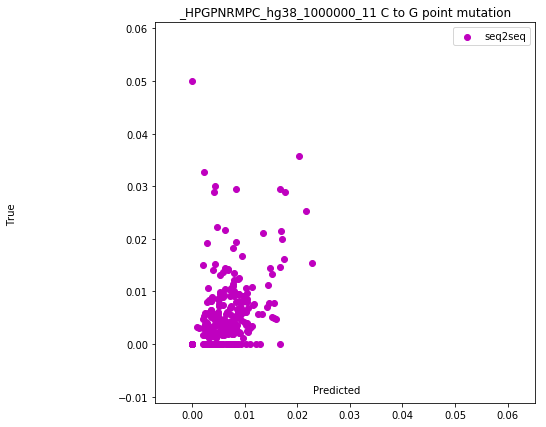

(0.6049334055656607, 1.2141721740151909e-63)


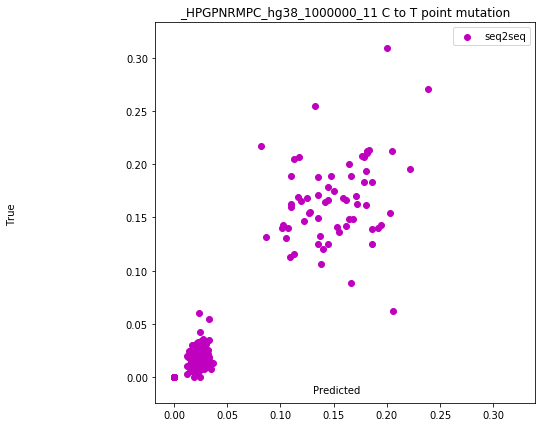

(0.9483889195651023, 6.0374300636e-313)


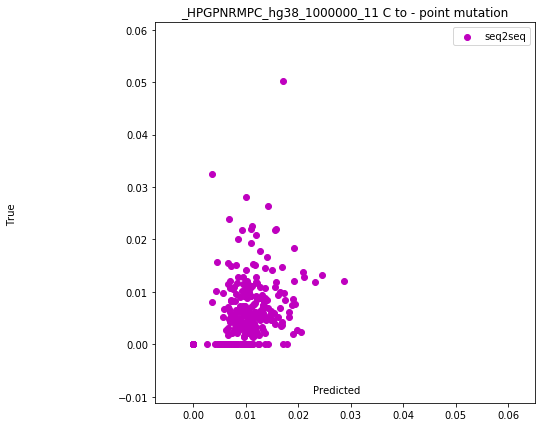

(0.6440325656532024, 1.640711232816452e-74)


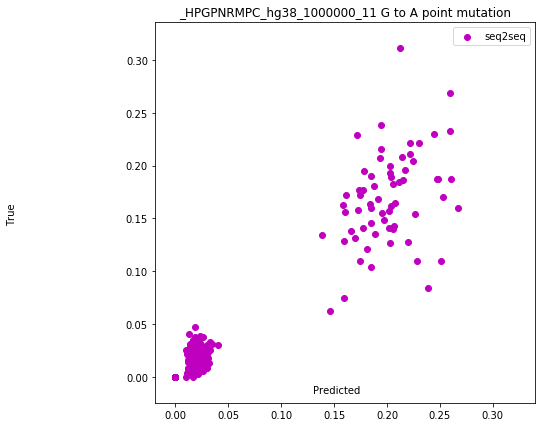

(0.9614290290071684, 0.0)


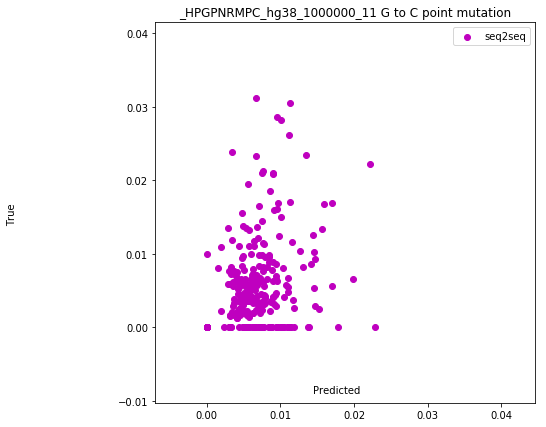

(0.5971321113048995, 1.1913646770591848e-61)


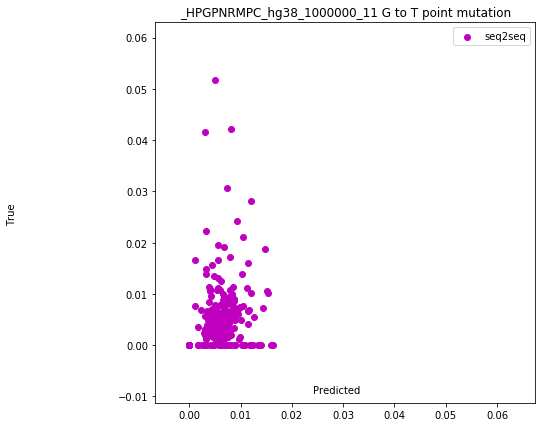

(0.4956513504203115, 4.651150956239448e-40)


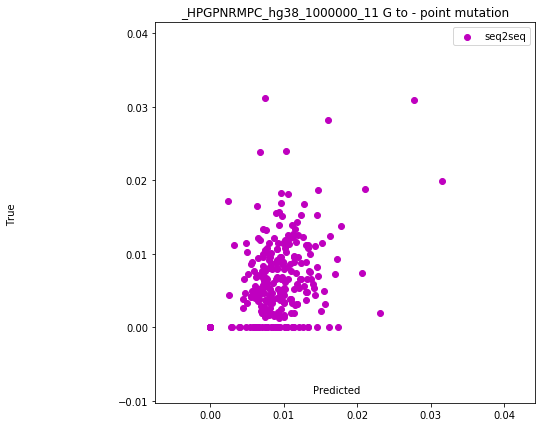

(0.7049547902395088, 5.064156018445255e-95)


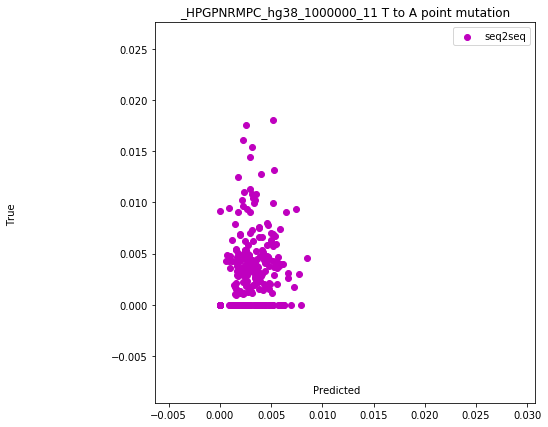

(0.5416860174624488, 6.0556086583603226e-49)


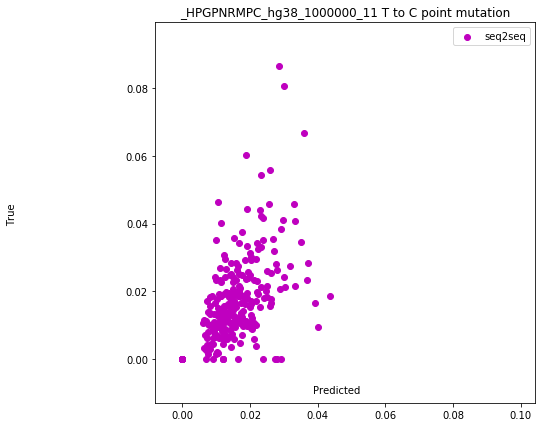

(0.7937520379156342, 1.2128322414350903e-136)


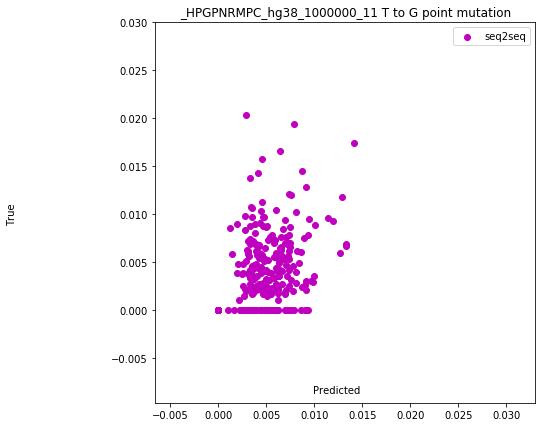

(0.6486513996886805, 6.67804282662959e-76)


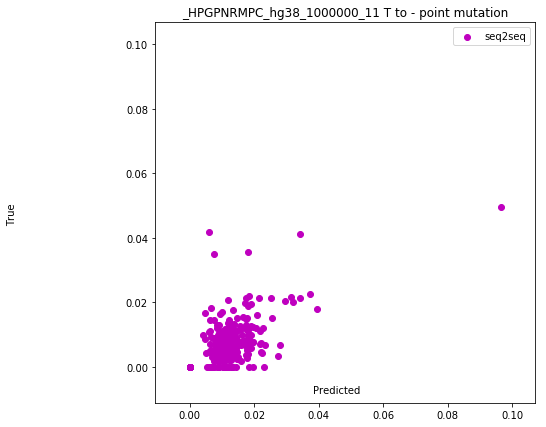

(0.7562208462100105, 7.264117128445096e-117)


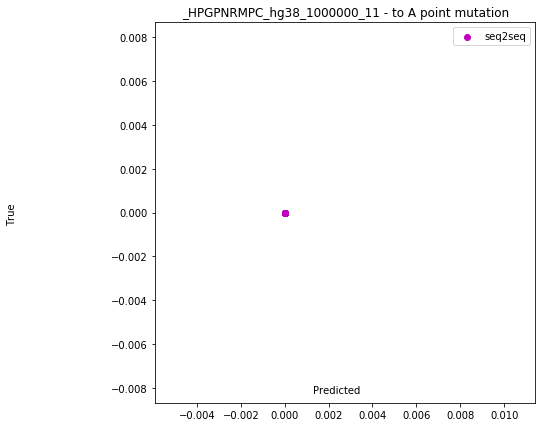

(nan, nan)


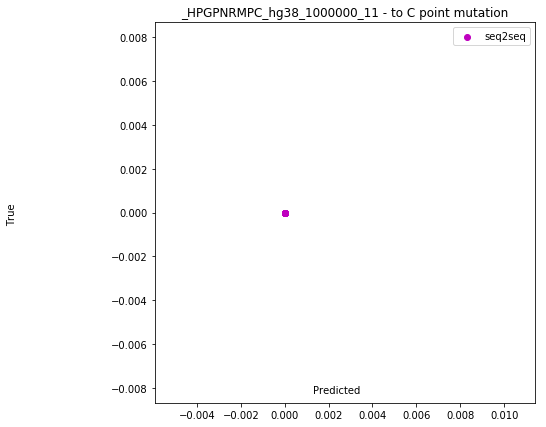

(nan, nan)


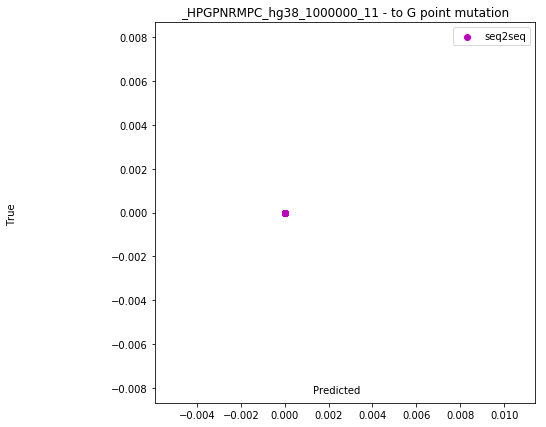

(nan, nan)


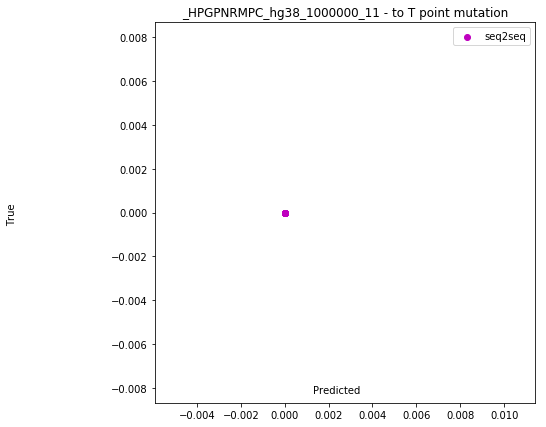

(nan, nan)


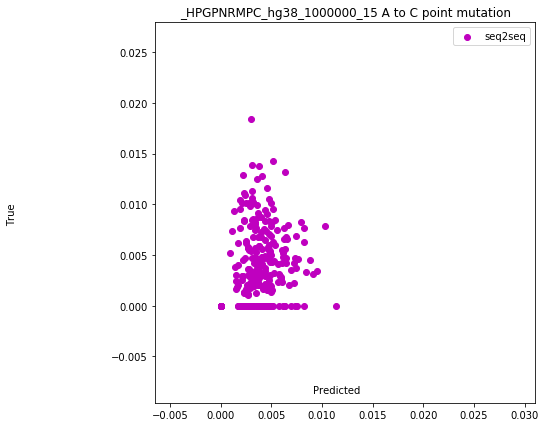

(0.5903707210711775, 5.73646255220128e-60)


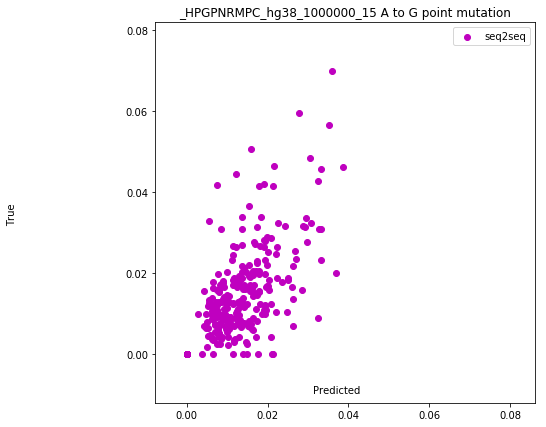

(0.8242924774618974, 4.690676268829719e-156)


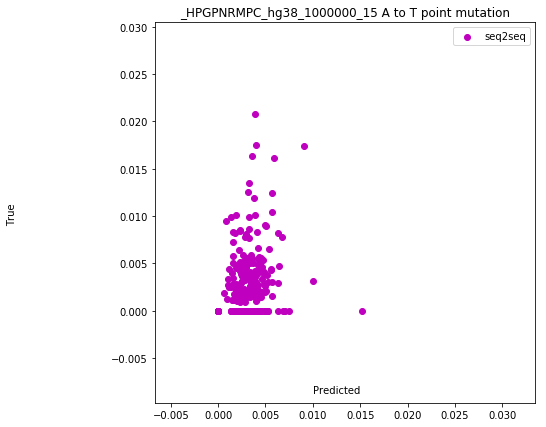

(0.5446254244418781, 1.4692186113396969e-49)


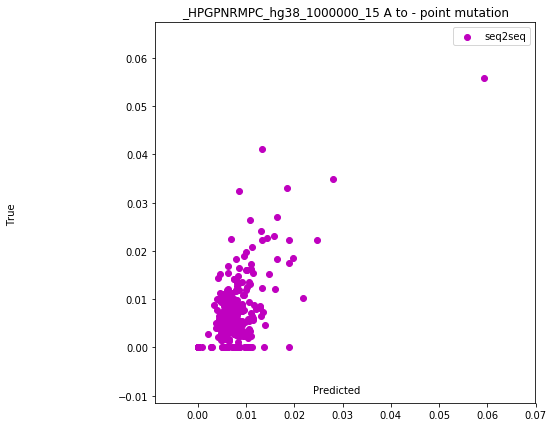

(0.7843300847180372, 2.6276275300235573e-131)


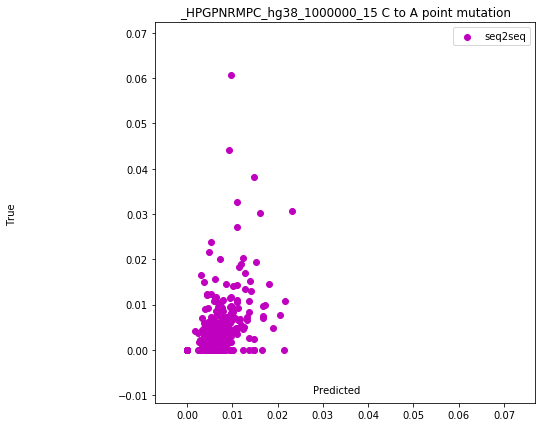

(0.5963730027861325, 1.849038810964657e-61)


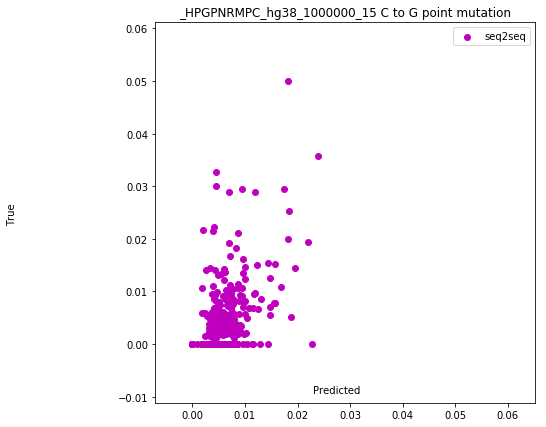

(0.652938541469535, 3.2529179484116805e-77)


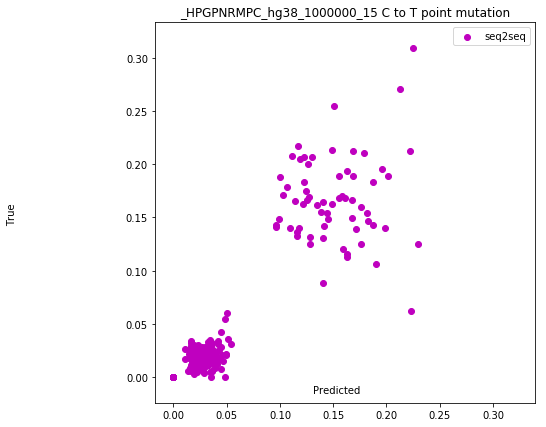

(0.9300601217195767, 4.197743980859191e-273)


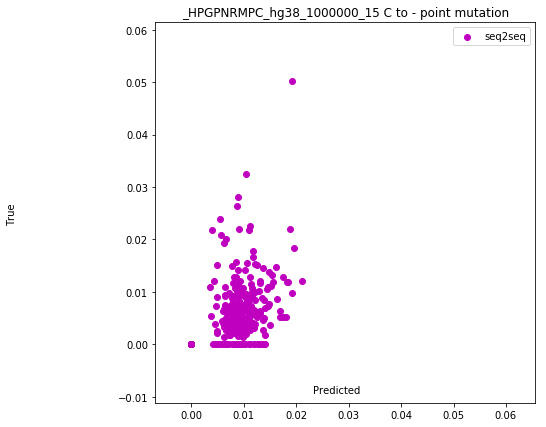

(0.6636248036438013, 1.400033707384014e-80)


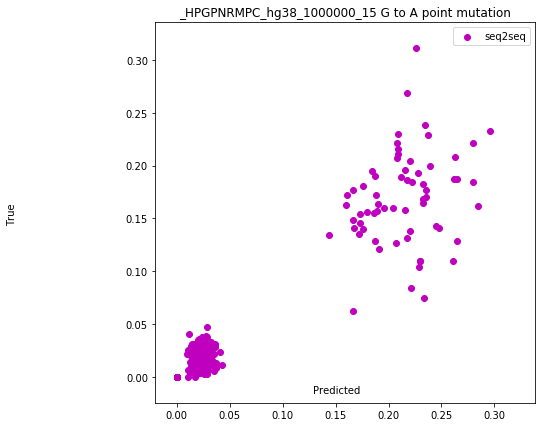

(0.9544249049020854, 0.0)


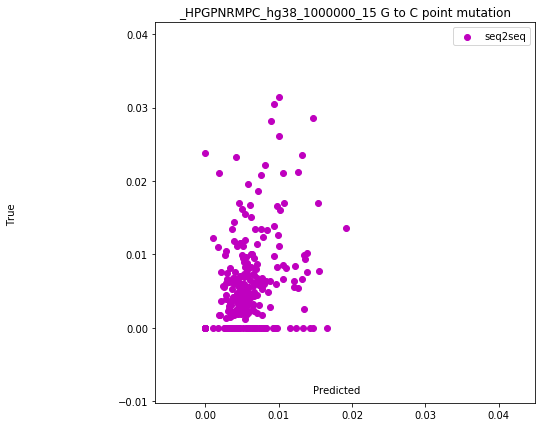

(0.6243296392539859, 7.680502168935348e-69)


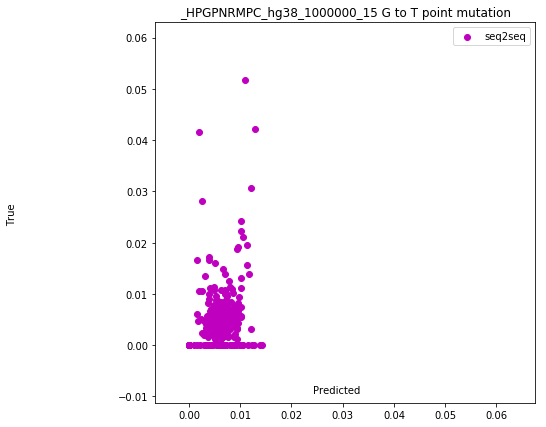

(0.5462924557782785, 6.539540571098236e-50)


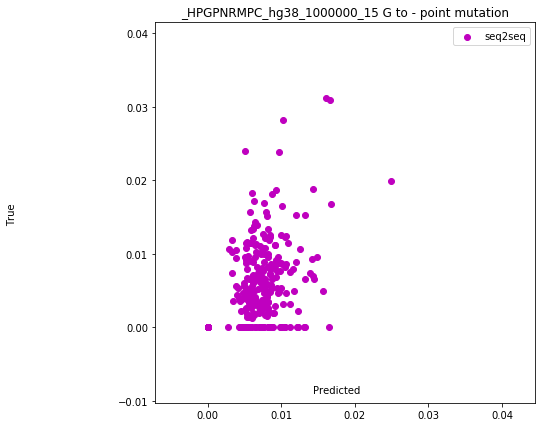

(0.6943573650780352, 4.379236360070078e-91)


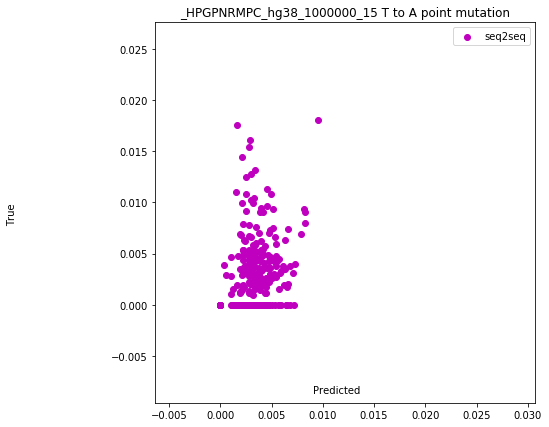

(0.5728025091921007, 8.911574637883641e-56)


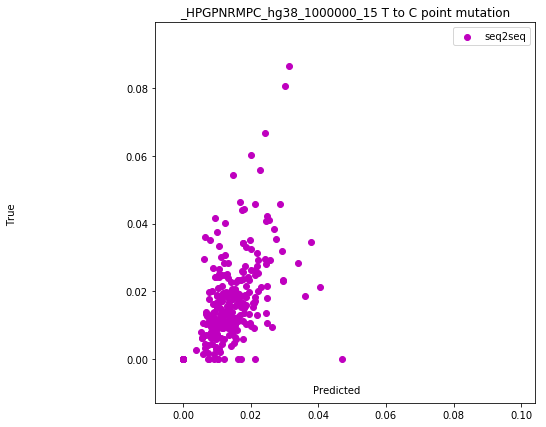

(0.7827758239222913, 1.8791912167851884e-130)


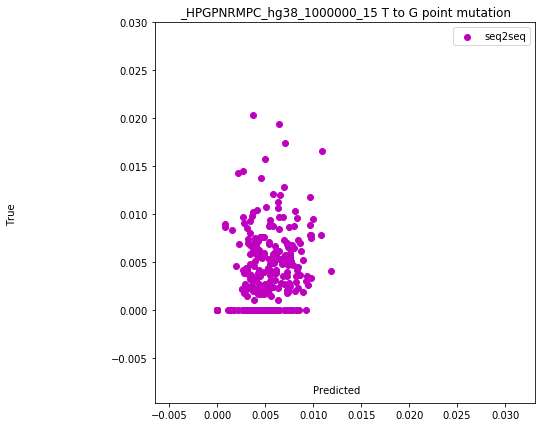

(0.6384374597602525, 7.369559179267967e-73)


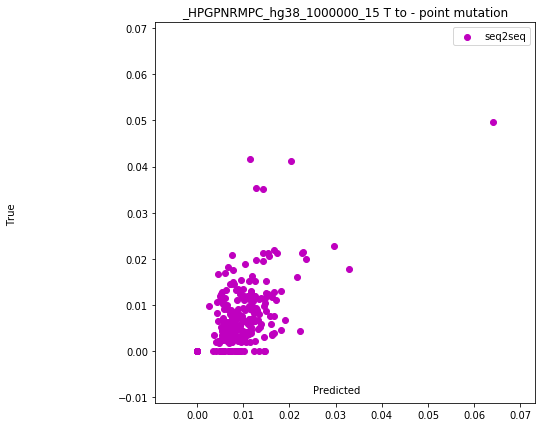

(0.7720752606524464, 9.34605050909039e-125)


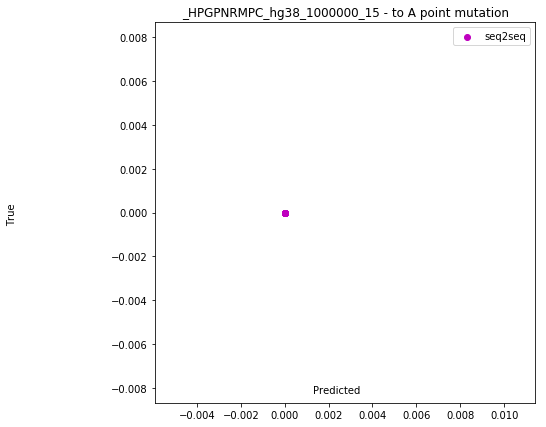

(nan, nan)


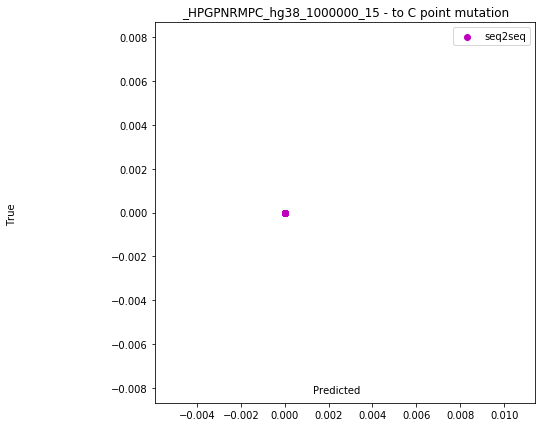

(nan, nan)


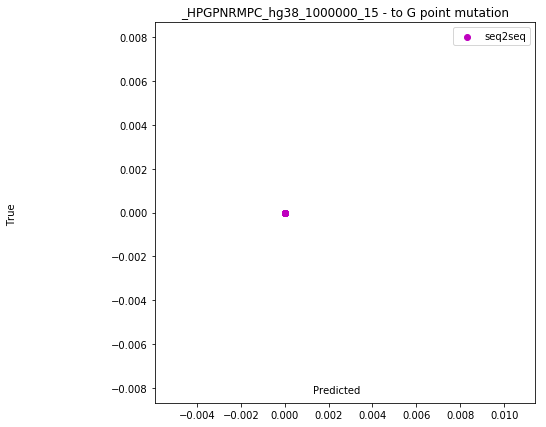

(nan, nan)


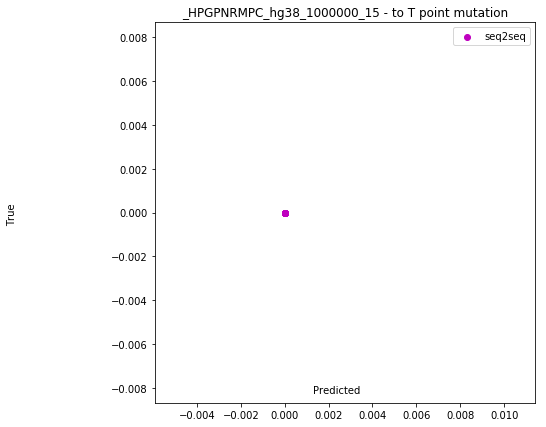

(nan, nan)


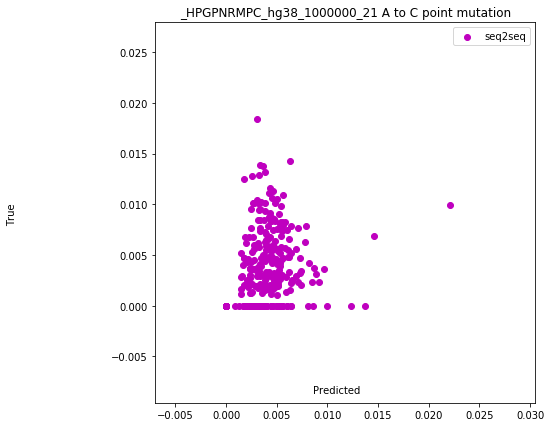

(0.5878384689478087, 2.391322569772722e-59)


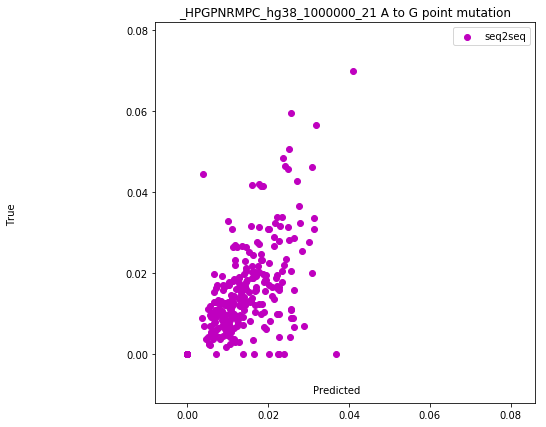

(0.8080186464646129, 2.822477796505767e-145)


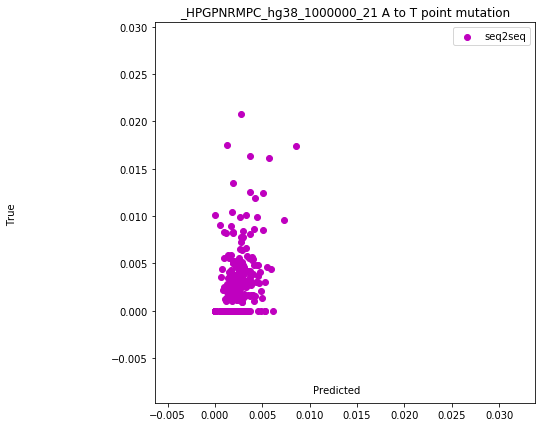

(0.5928523021153025, 1.398671935054124e-60)


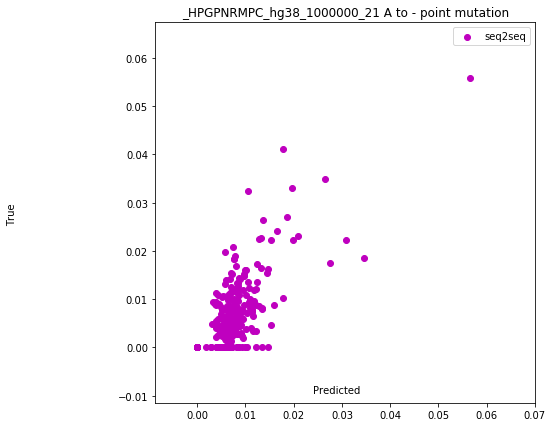

(0.8119496041319216, 8.781696663372164e-148)


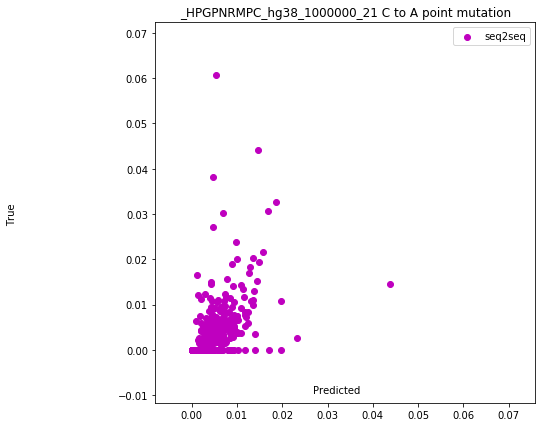

(0.5896501591157923, 8.622306250373321e-60)


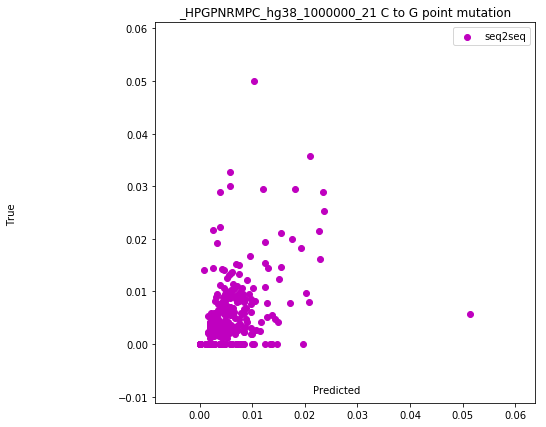

(0.6099356937027316, 5.995965538060347e-65)


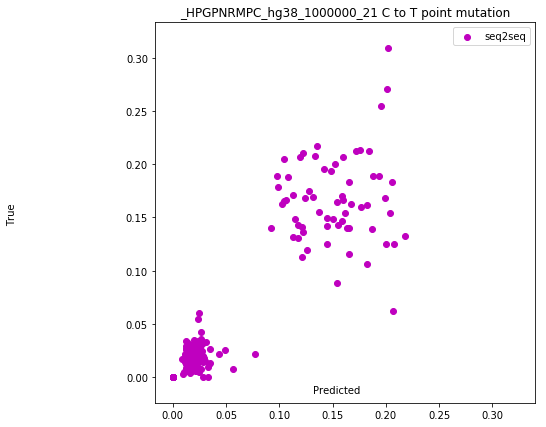

(0.936410980990992, 1.5354031625918394e-285)


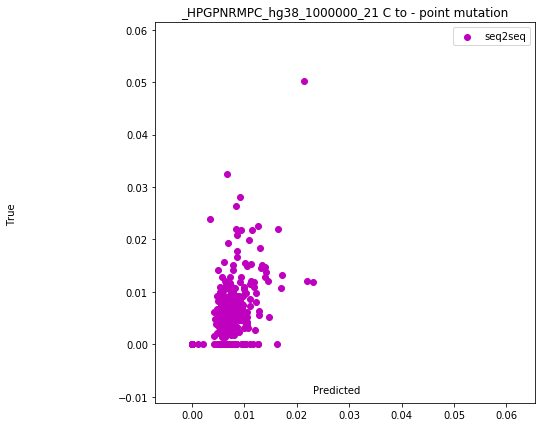

(0.7006304375714303, 2.1478028355601665e-93)


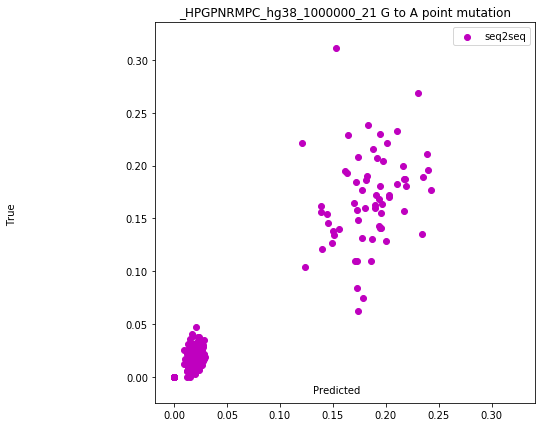

(0.9565511305656387, 0.0)


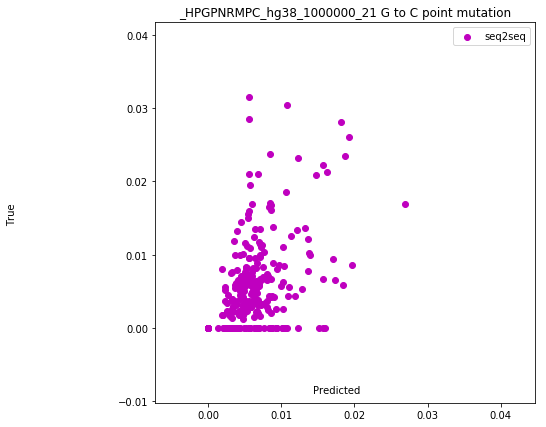

(0.675715186087414, 1.4653400211511103e-84)


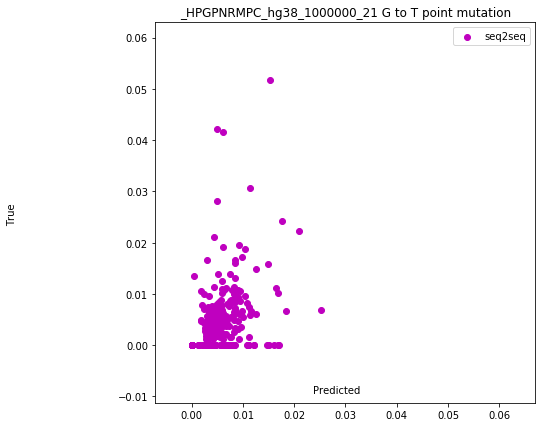

(0.5581663036788496, 1.7929329062645094e-52)


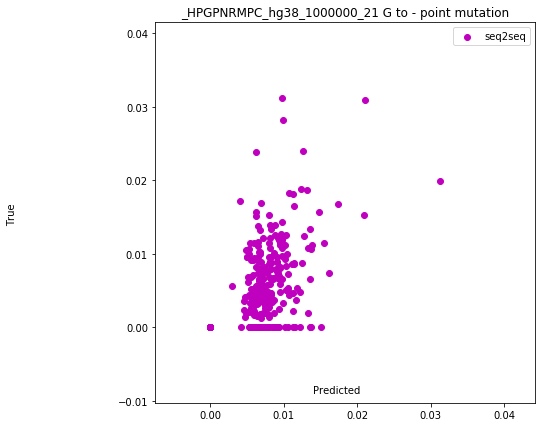

(0.7329995046644947, 2.415706720936668e-106)


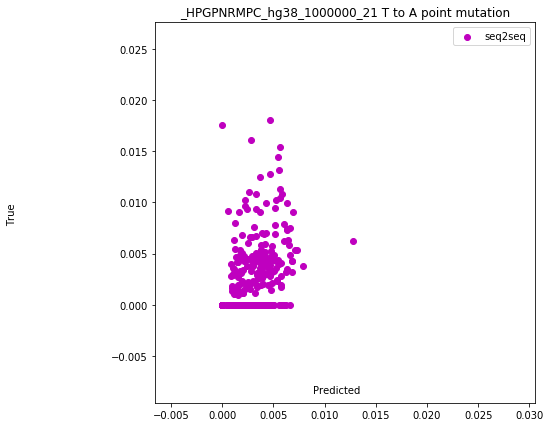

(0.6178334638219982, 4.6464097917114e-67)


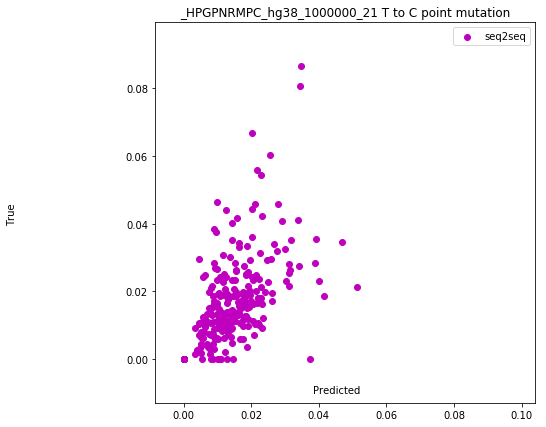

(0.7913752183409745, 2.8563802949618136e-135)


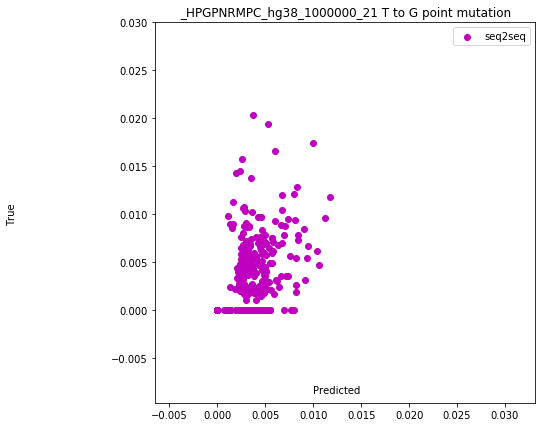

(0.6617343814538601, 5.645644751304111e-80)


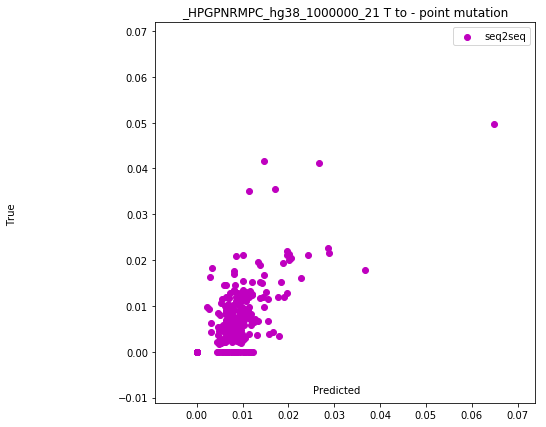

(0.8095477722424103, 3.0362877259676787e-146)


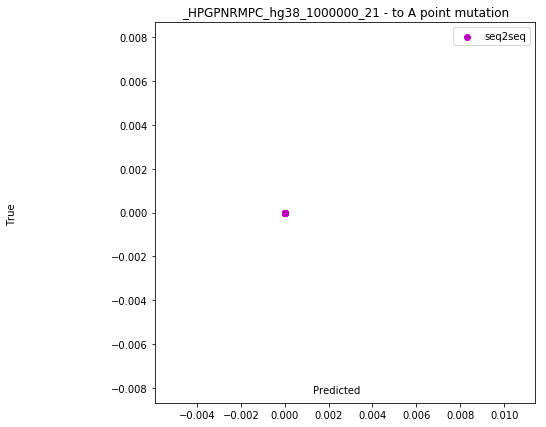

(nan, nan)


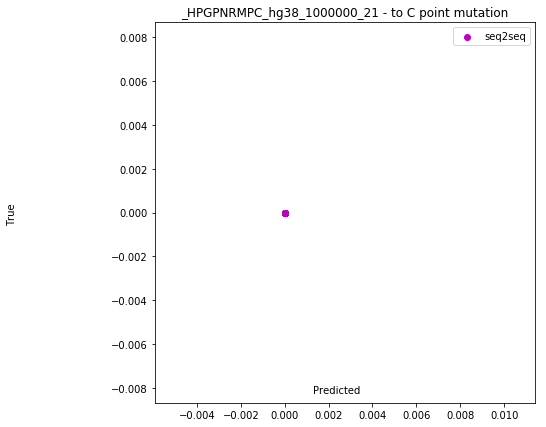

(nan, nan)


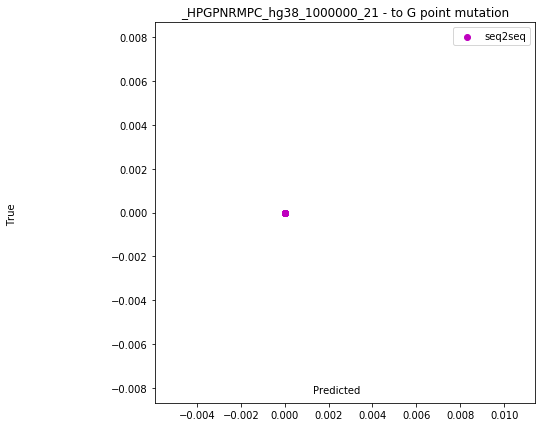

(nan, nan)


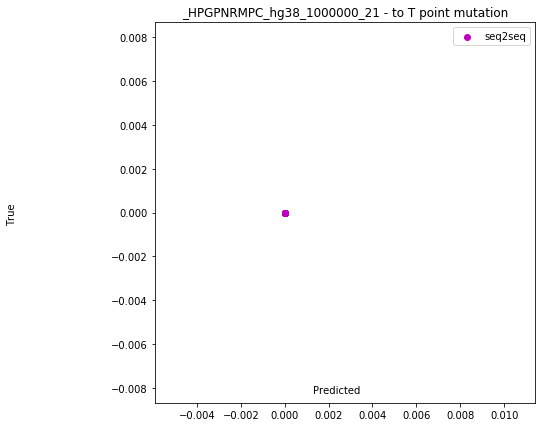

(nan, nan)


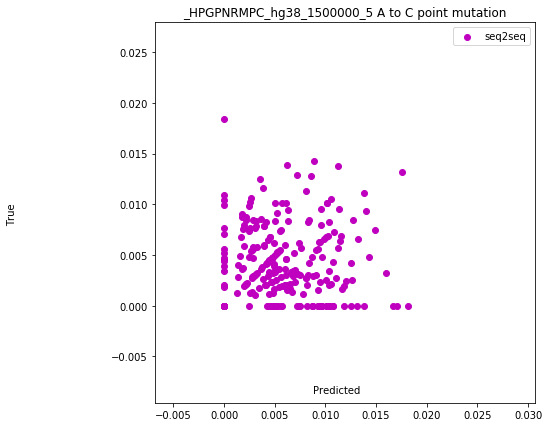

(0.5154252613569981, 1.039536375500282e-43)


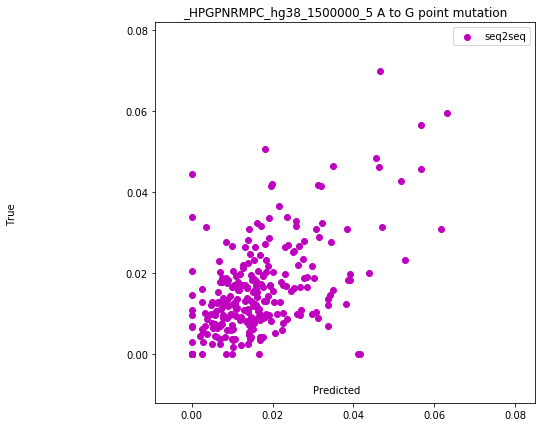

(0.7878130145096726, 3.0122828516099558e-133)


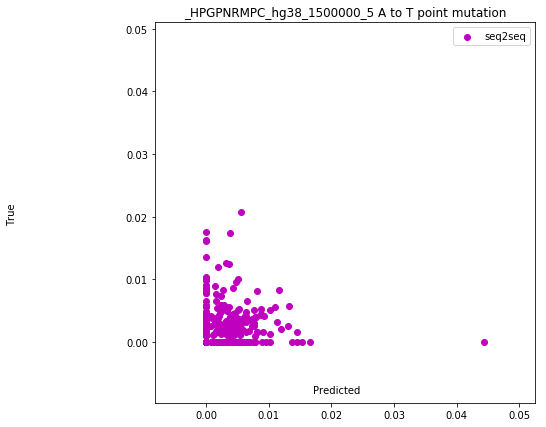

(0.23543988806355007, 2.5507829193702185e-09)


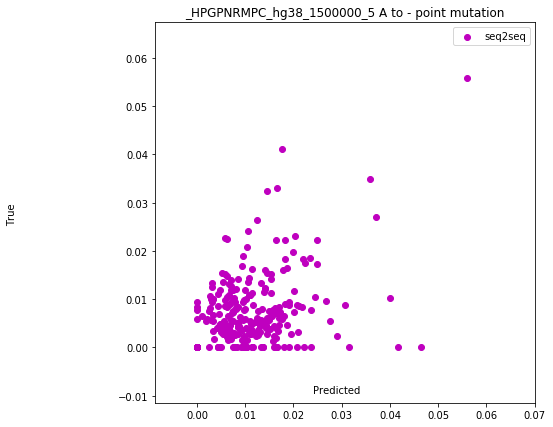

(0.6294195277369011, 2.881977694334887e-70)


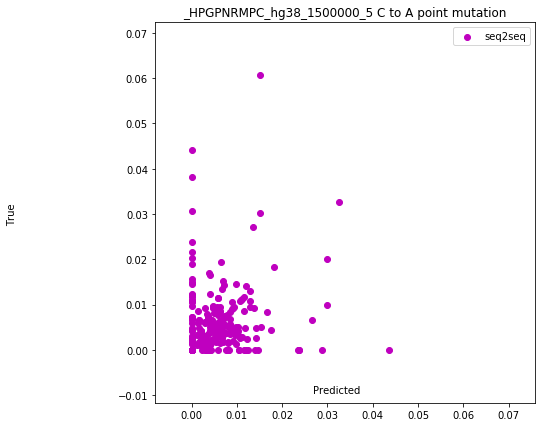

(0.40378550606547814, 6.560652340176339e-26)


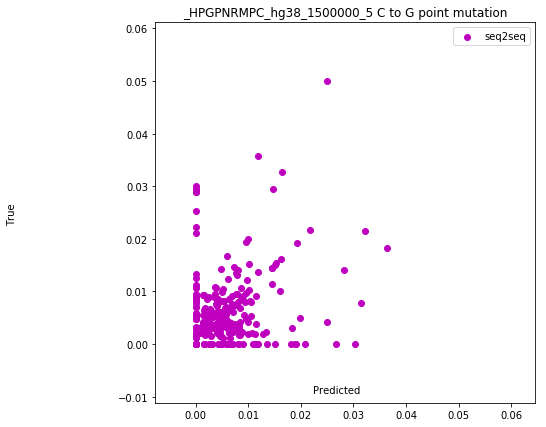

(0.4947473924357754, 6.7423095025200974e-40)


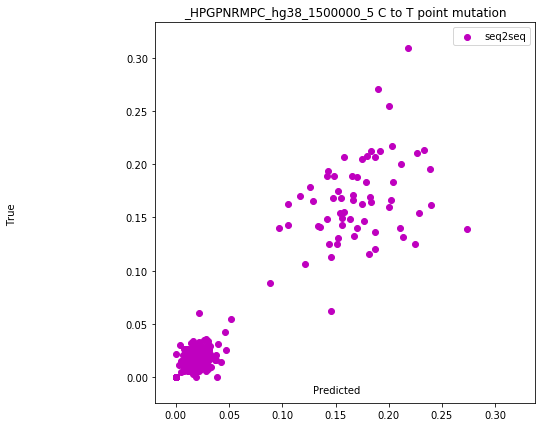

(0.9561753714200198, 0.0)


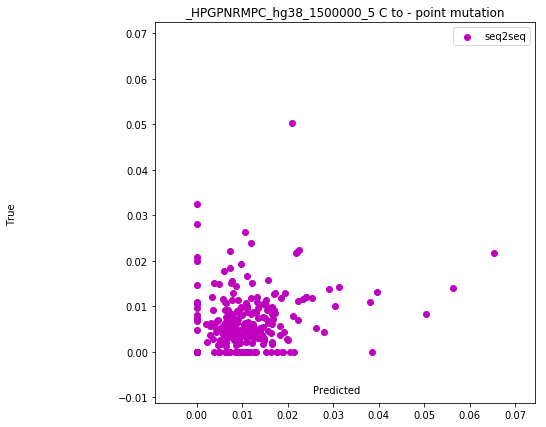

(0.5501017684338302, 1.0111087273882243e-50)


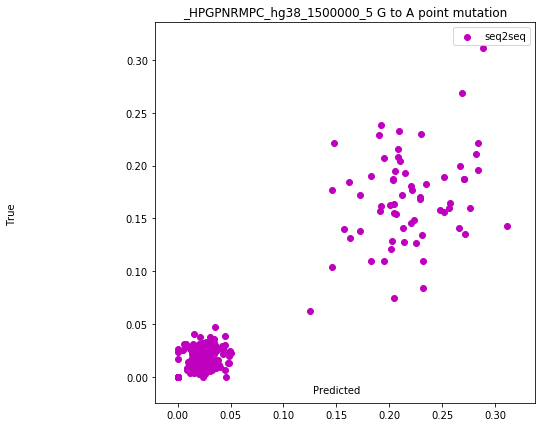

(0.9534384178196863, 0.0)


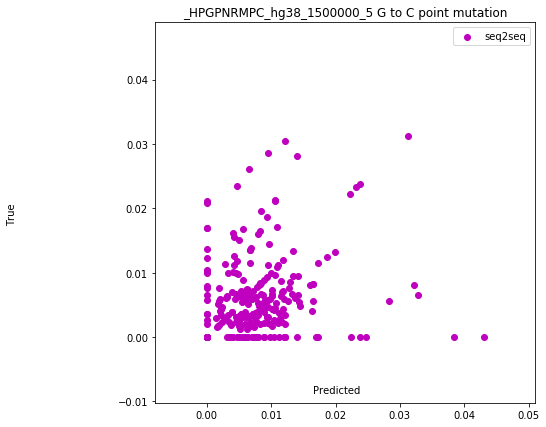

(0.5091799932149145, 1.5696544763340017e-42)


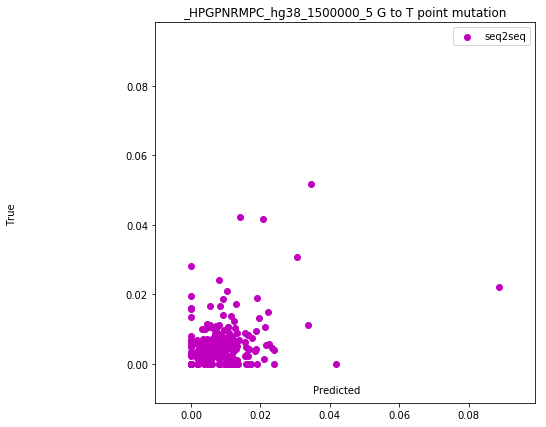

(0.5510904548605997, 6.203877002798685e-51)


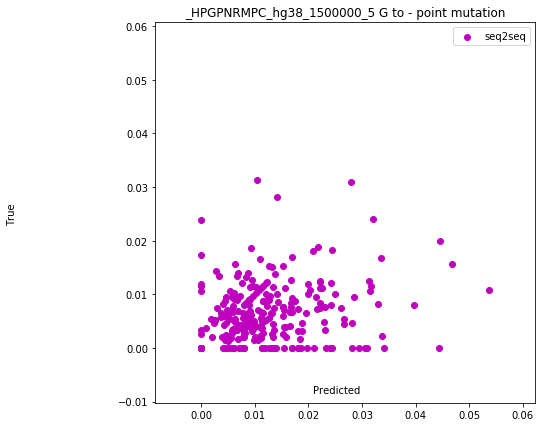

(0.5854274065165628, 9.20239744812651e-59)


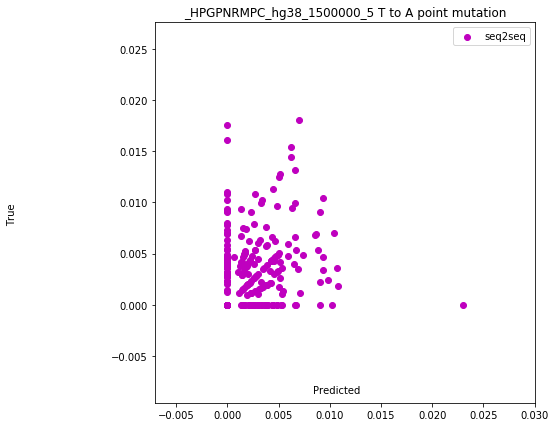

(0.4363667334257252, 1.929139279087728e-30)


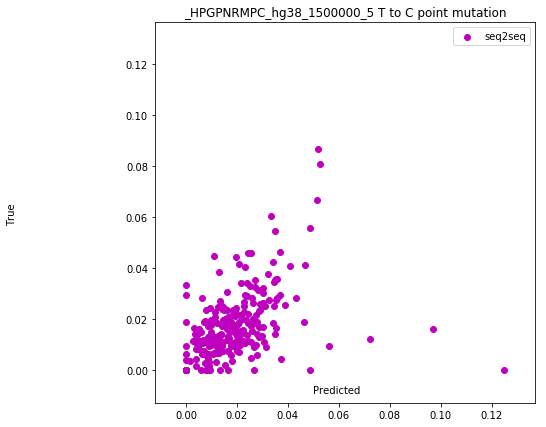

(0.7081290702879498, 3.0964306606724775e-96)


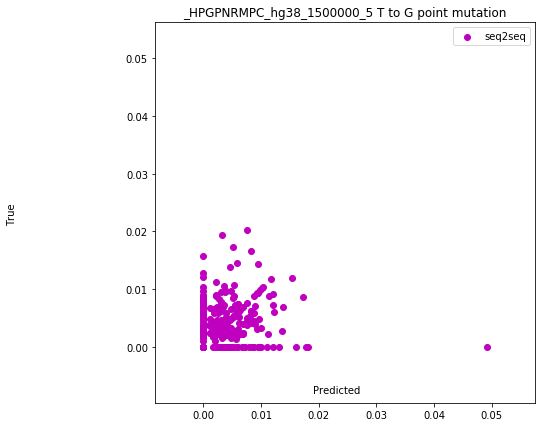

(0.4115162372021294, 6.1127072695700066e-27)


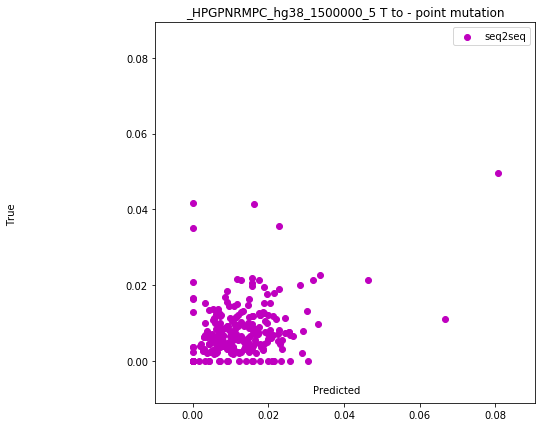

(0.6338099477283707, 1.61584719092254e-71)


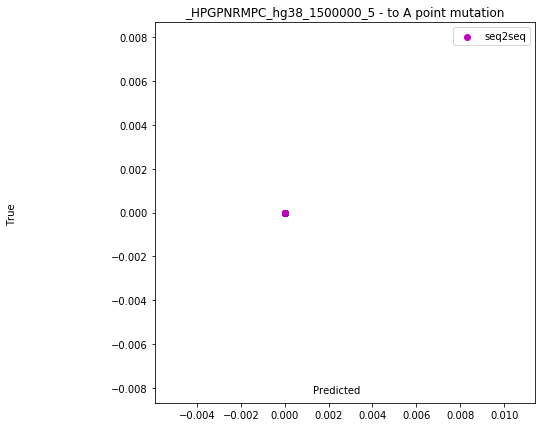

(nan, nan)


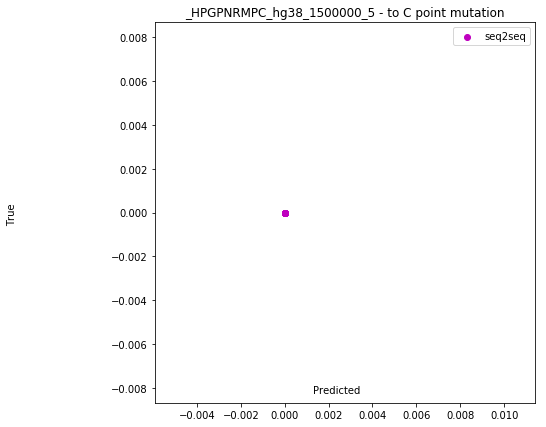

(nan, nan)


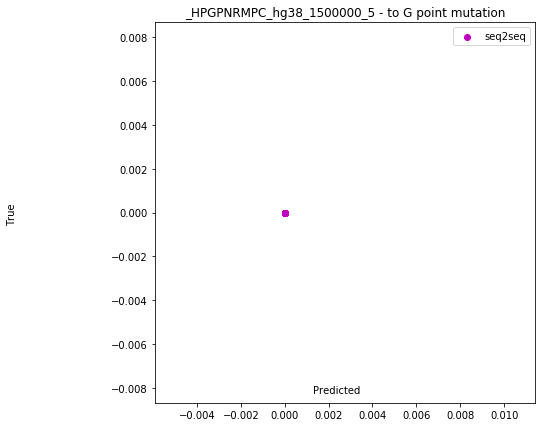

(nan, nan)


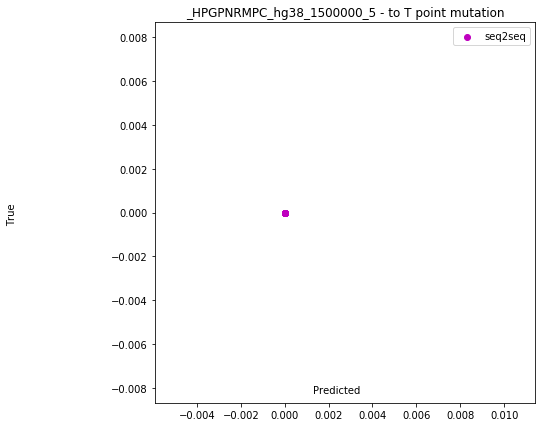

(nan, nan)


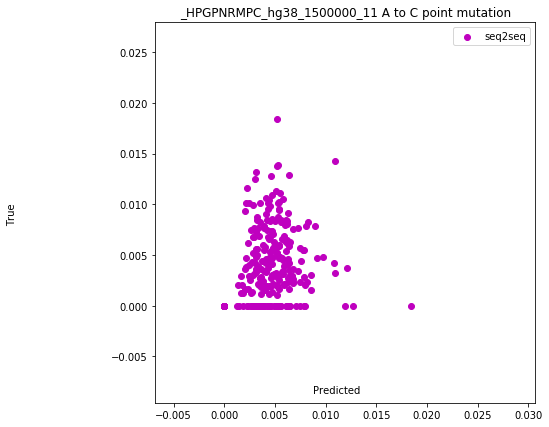

(0.5996671395316003, 2.721614557649993e-62)


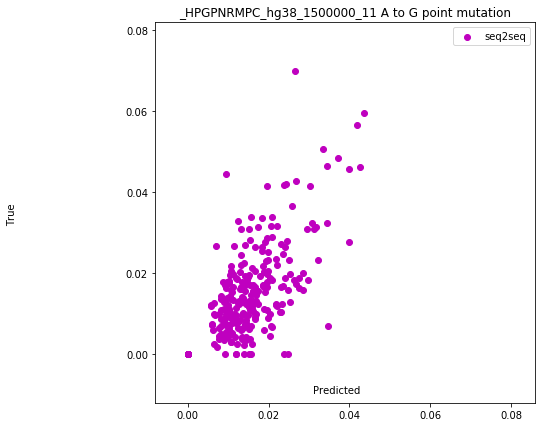

(0.8467788624260715, 6.187103215803959e-173)


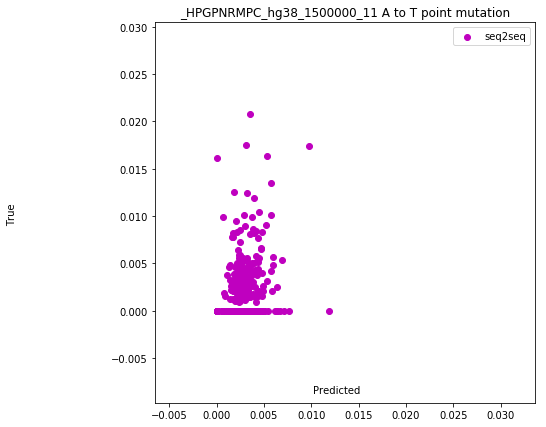

(0.5384460869286358, 2.838663244339596e-48)


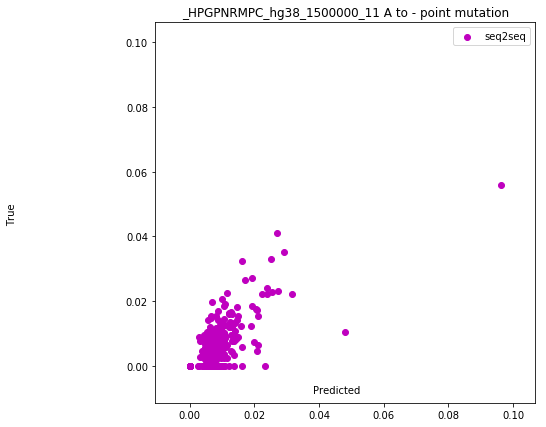

(0.8059654209208447, 5.459700294575935e-144)


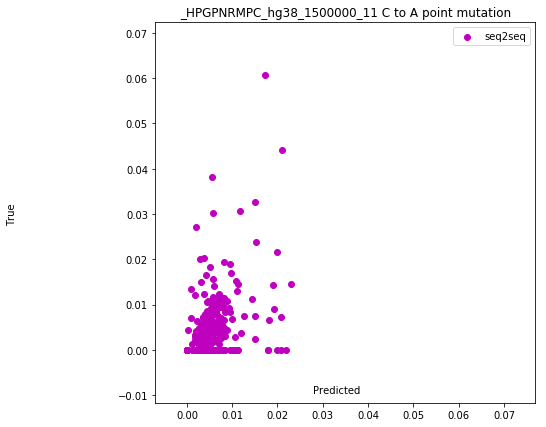

(0.5938726678801256, 7.800939241006991e-61)


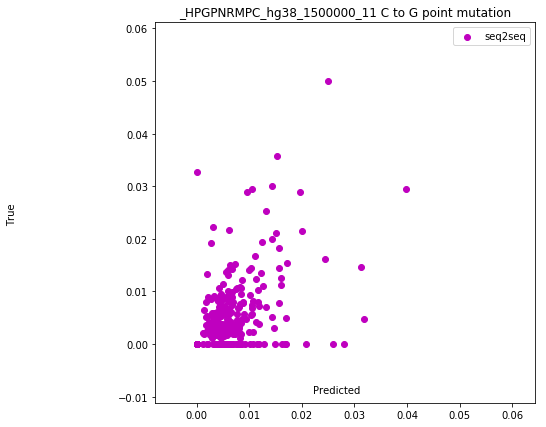

(0.6288725349525304, 4.113195518282045e-70)


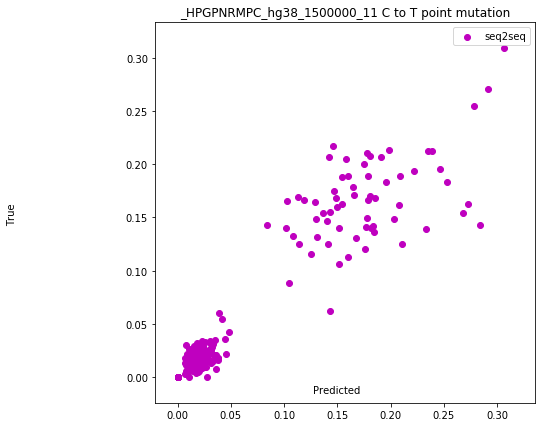

(0.9592457662188536, 0.0)


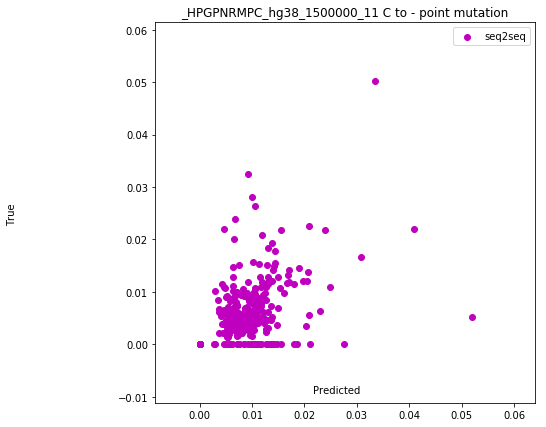

(0.665181325579955, 4.407483250111426e-81)


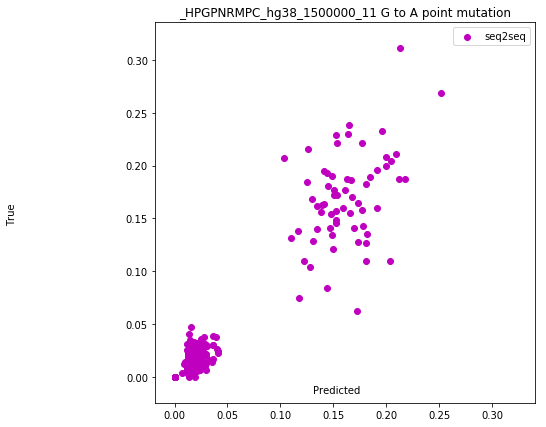

(0.9605138408604342, 0.0)


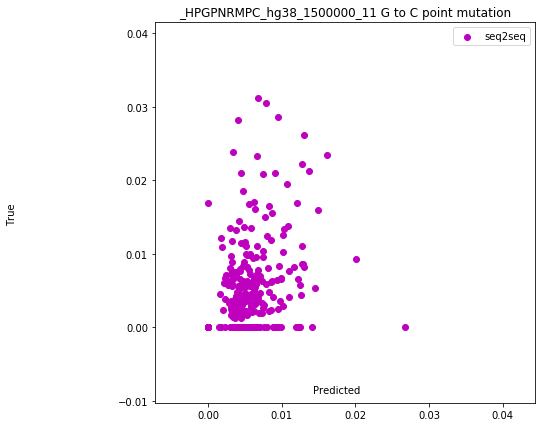

(0.5876612489818861, 2.6413382092740373e-59)


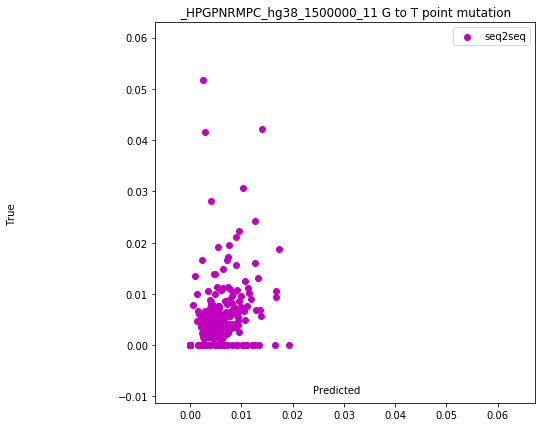

(0.5238066265290849, 2.4871131987585903e-45)


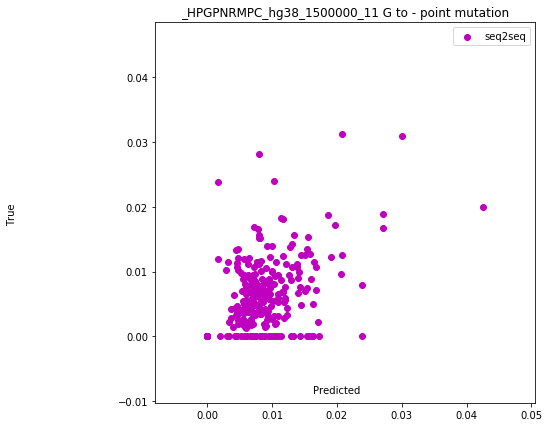

(0.7072906053022818, 6.501647288584483e-96)


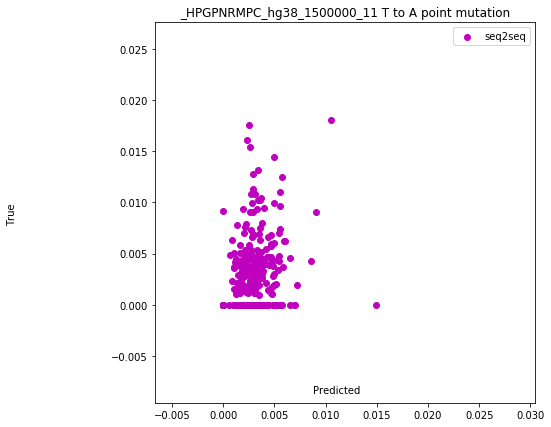

(0.5642311515622989, 8.028410905773303e-54)


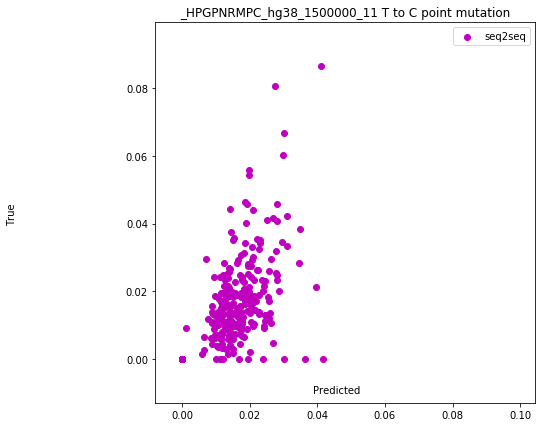

(0.7903341867860367, 1.1249223693663354e-134)


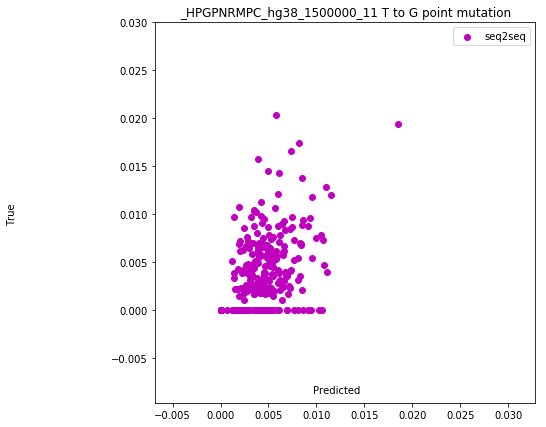

(0.6881539341286195, 7.367380782072337e-89)


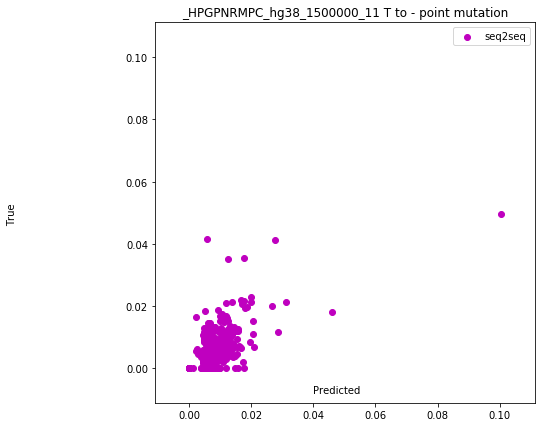

(0.757205198426026, 2.4494188922944866e-117)


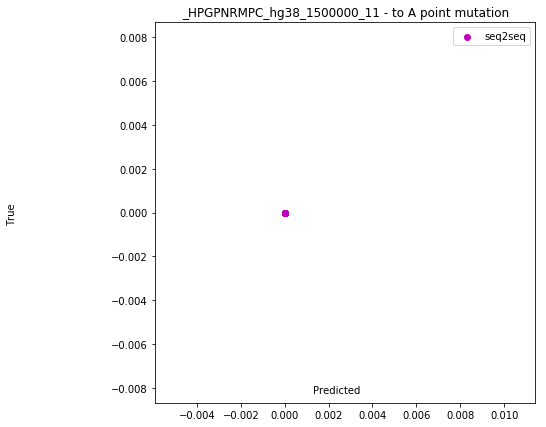

(nan, nan)


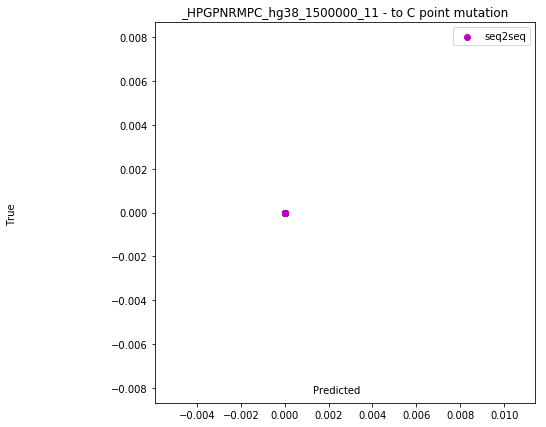

(nan, nan)


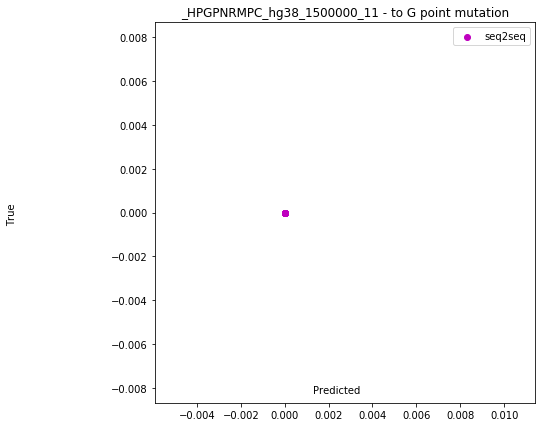

(nan, nan)


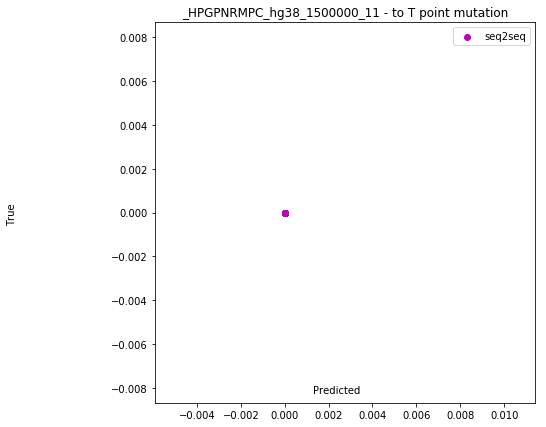

(nan, nan)


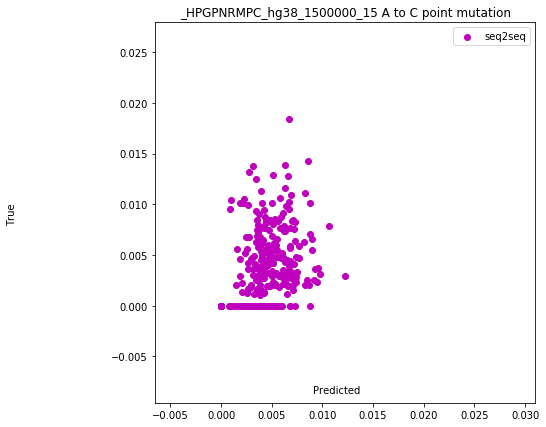

(0.6571950536697871, 1.5415897335735309e-78)


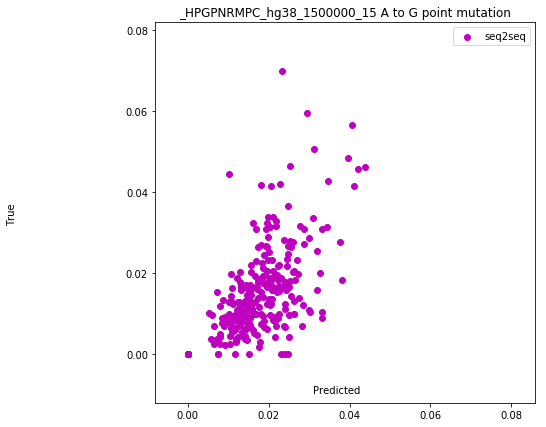

(0.8241665326679267, 5.739786012437659e-156)


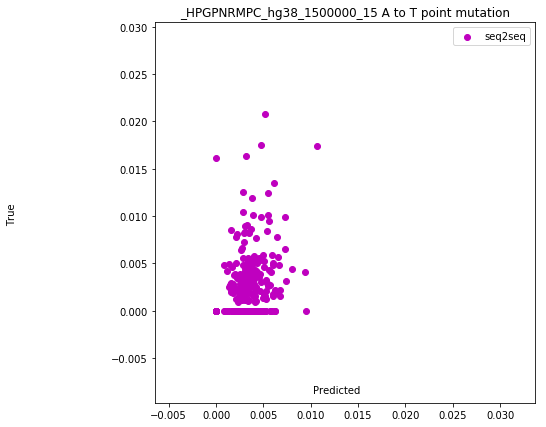

(0.5779150286096456, 5.706813920710953e-57)


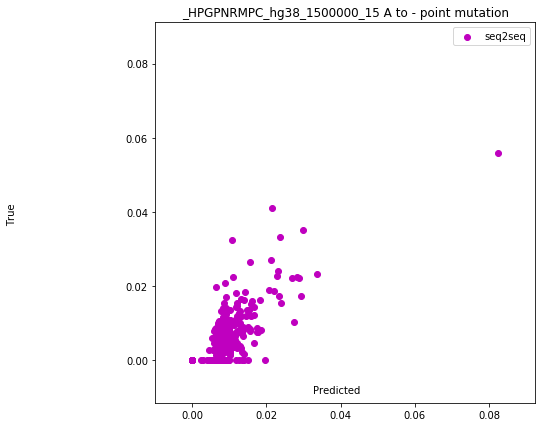

(0.829335734578236, 1.265595280832759e-159)


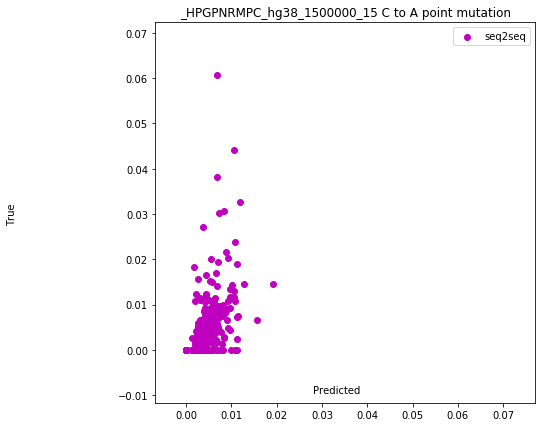

(0.6251960703236832, 4.4112623065795974e-69)


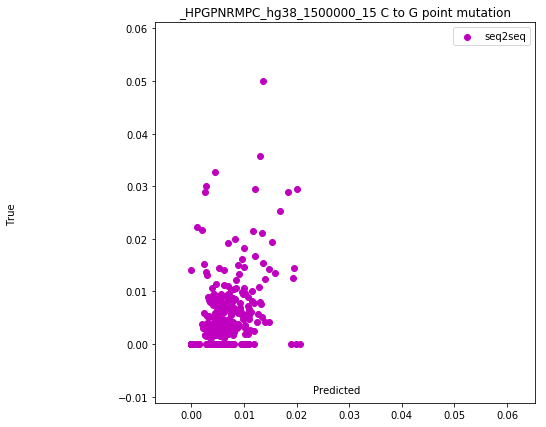

(0.6106301300507772, 3.932328520367531e-65)


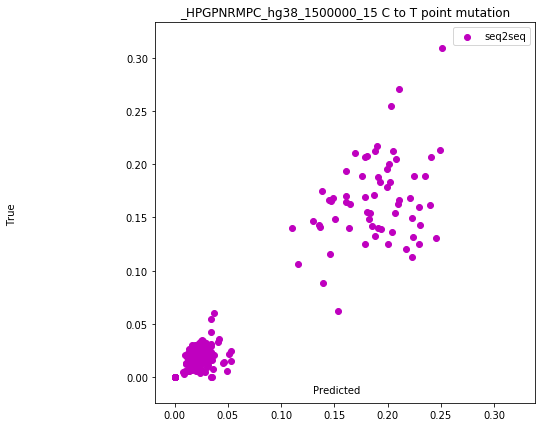

(0.9597792077160737, 0.0)


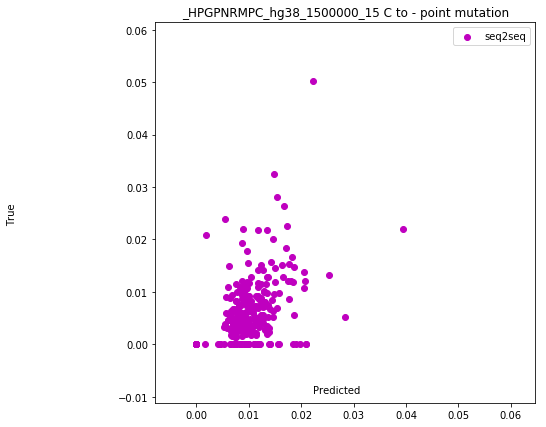

(0.6910776784639792, 6.68713235506089e-90)


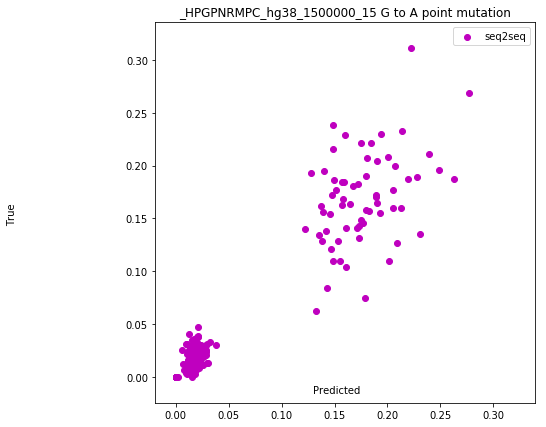

(0.9616907076355754, 0.0)


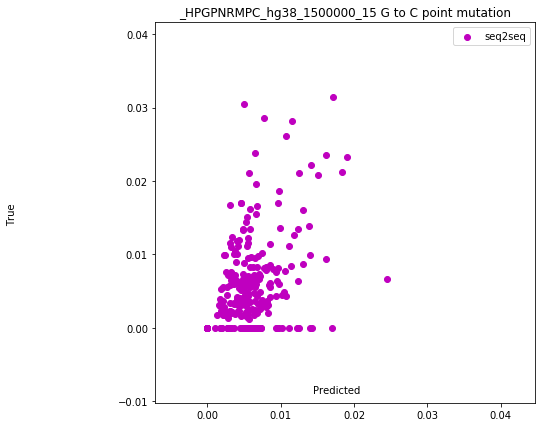

(0.6639253861743611, 1.1205779427622833e-80)


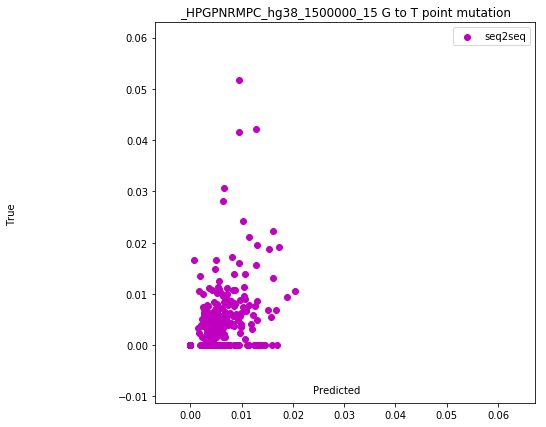

(0.5608290016589488, 4.621221250387343e-53)


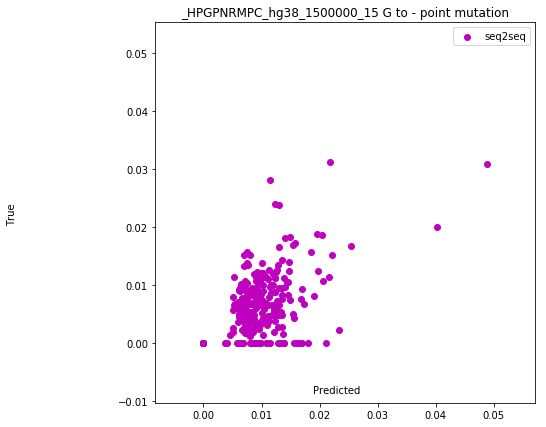

(0.7509700386615683, 2.1981481327511095e-114)


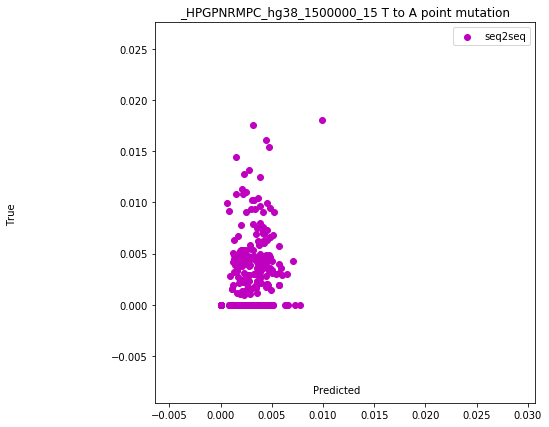

(0.5684120522435117, 9.08547041085363e-55)


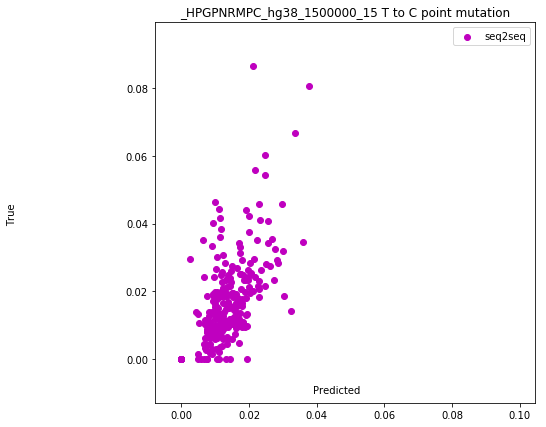

(0.8241778574171011, 5.636588158214994e-156)


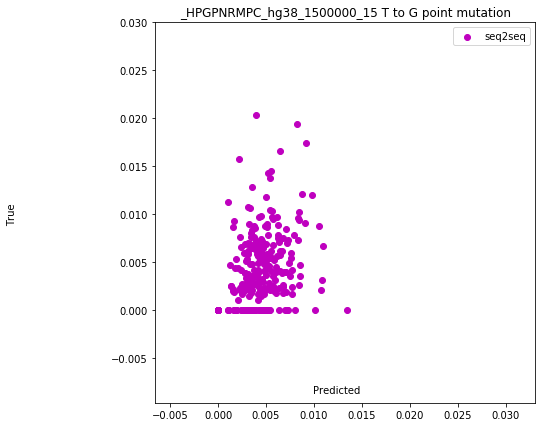

(0.6575606155879457, 1.1836614531067597e-78)


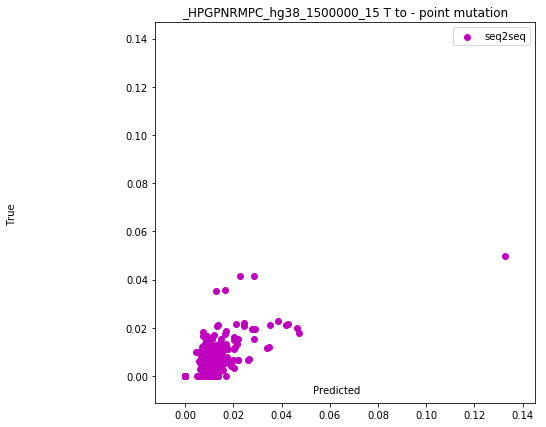

(0.7816737296290206, 7.508439261773107e-130)


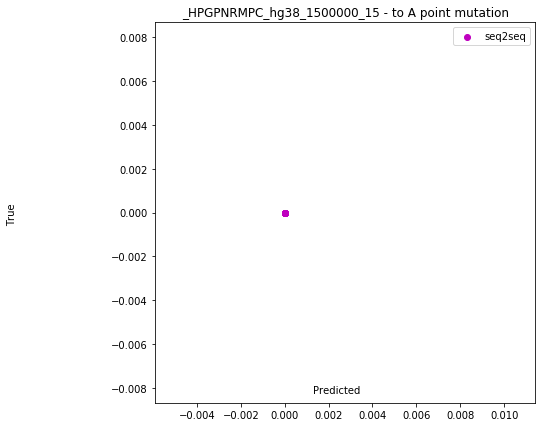

(nan, nan)


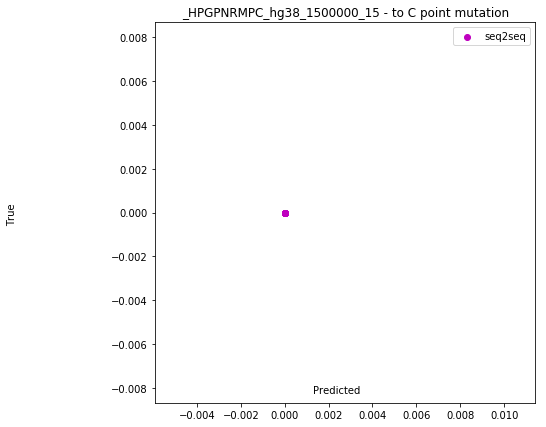

(nan, nan)


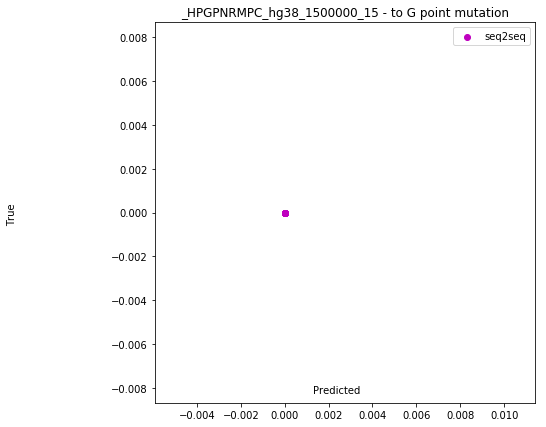

(nan, nan)


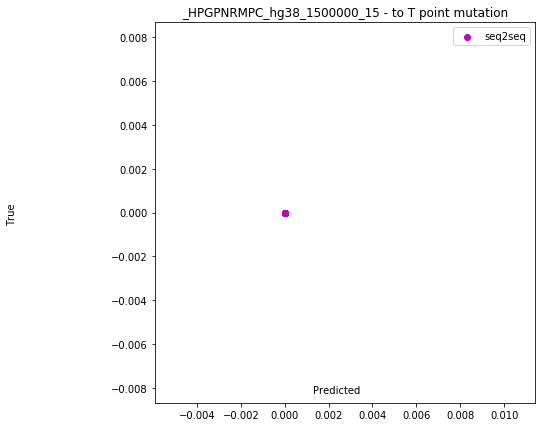

(nan, nan)


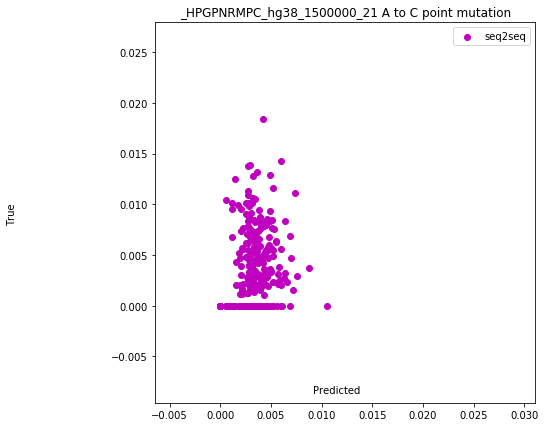

(0.6048727317687068, 1.2588790479876762e-63)


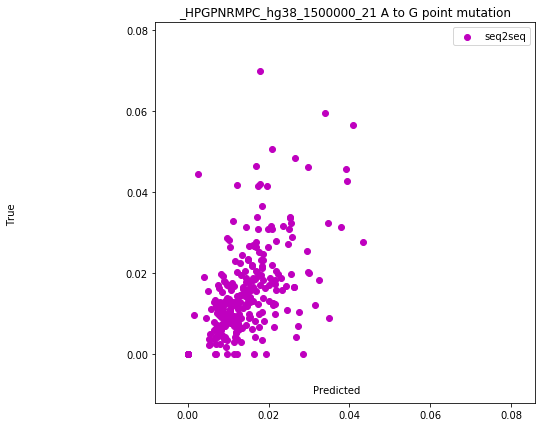

(0.8043813154736479, 5.239293044198727e-143)


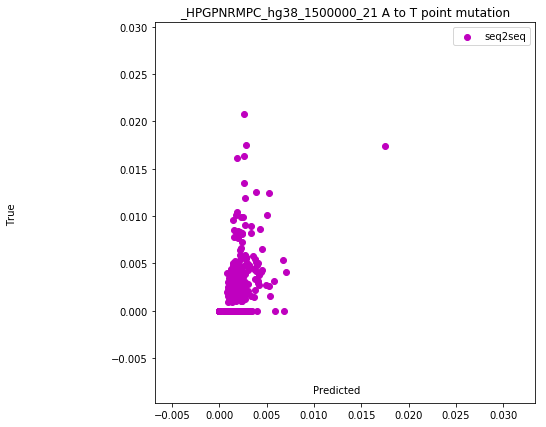

(0.6128877642124287, 9.905562890153807e-66)


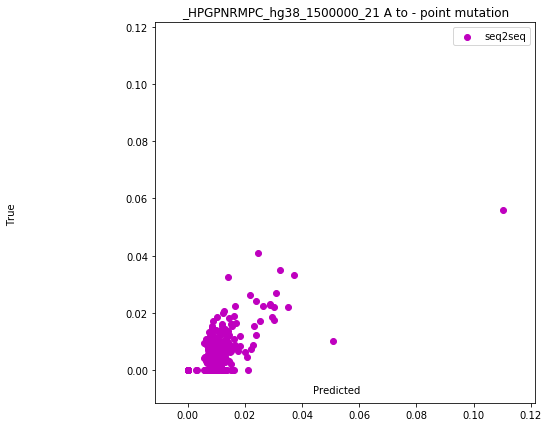

(0.8125668336482612, 3.503987450404875e-148)


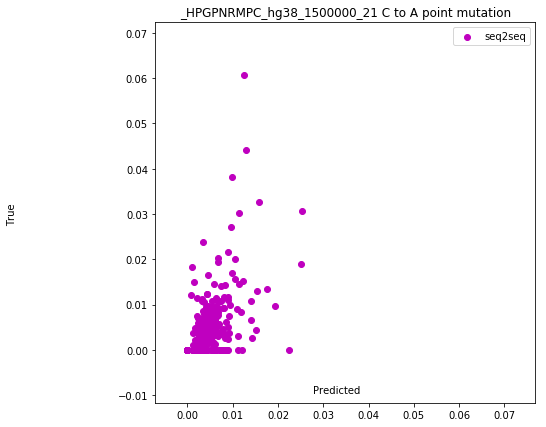

(0.6579691833343513, 8.806383463317357e-79)


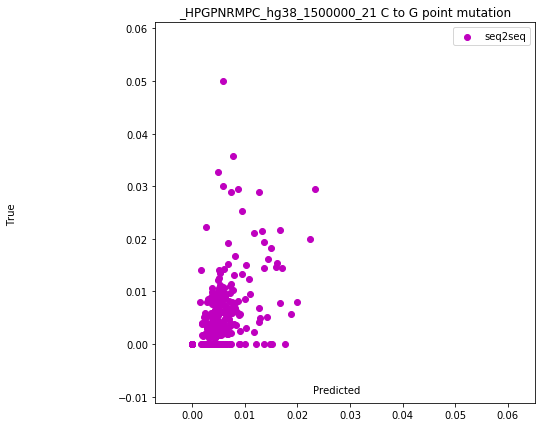

(0.6326242007804824, 3.5345631782975067e-71)


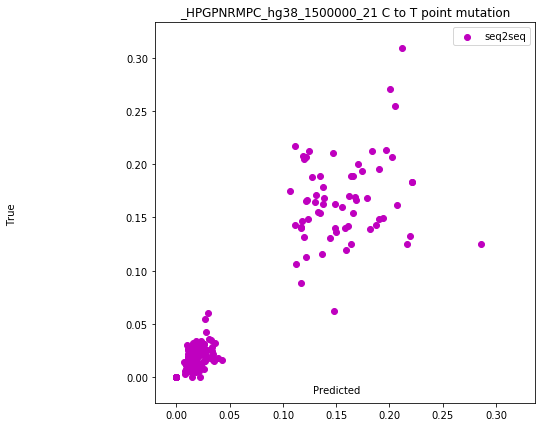

(0.9459725599529275, 6.368394039900378e-307)


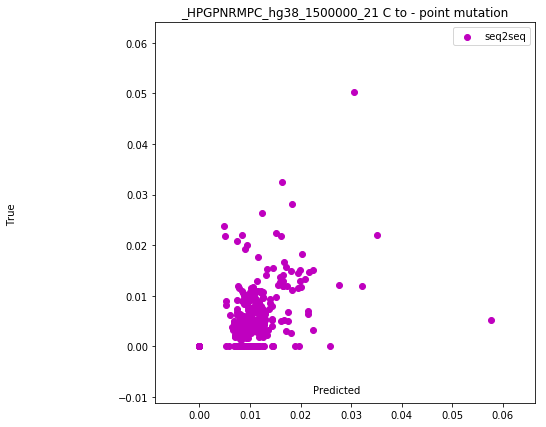

(0.6804003397378162, 3.731599452151733e-86)


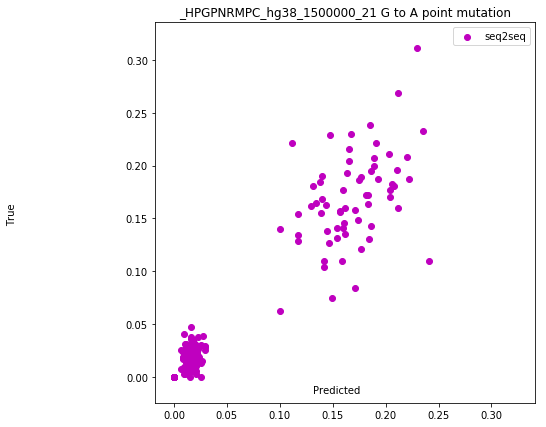

(0.9620551933618773, 0.0)


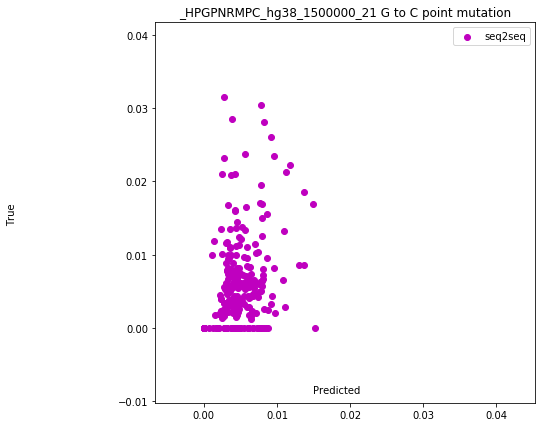

(0.61894091455644, 2.324474271249362e-67)


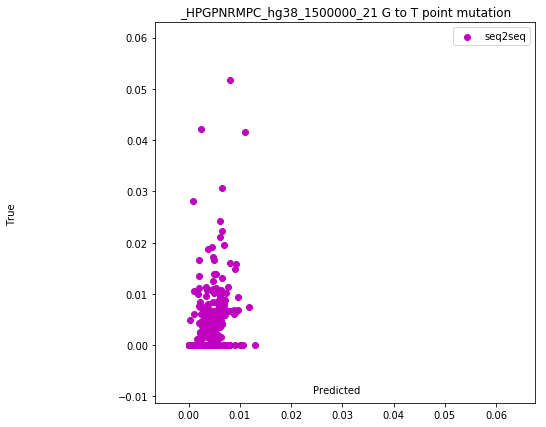

(0.5559669780831124, 5.4438549249338275e-52)


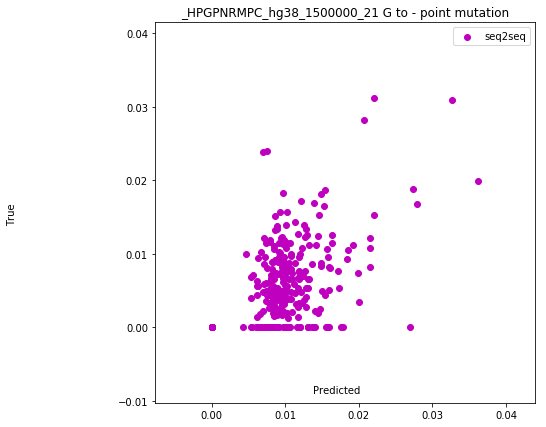

(0.7324835606506455, 4.020039852770215e-106)


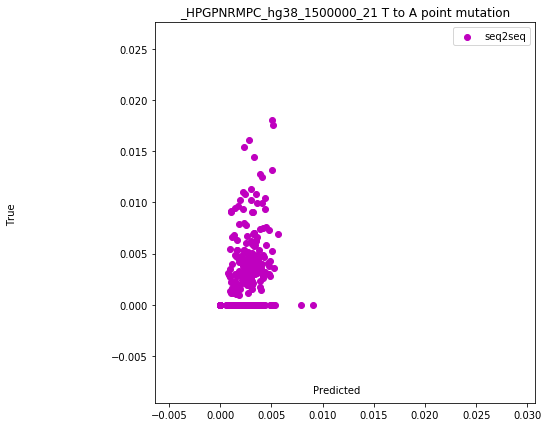

(0.6006349524995168, 1.5435125319137517e-62)


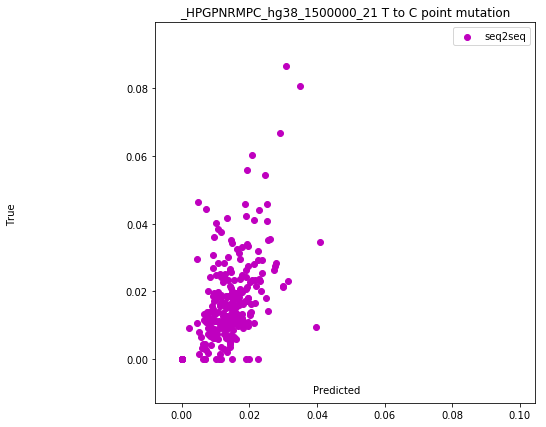

(0.7937373143601436, 1.2369595012336678e-136)


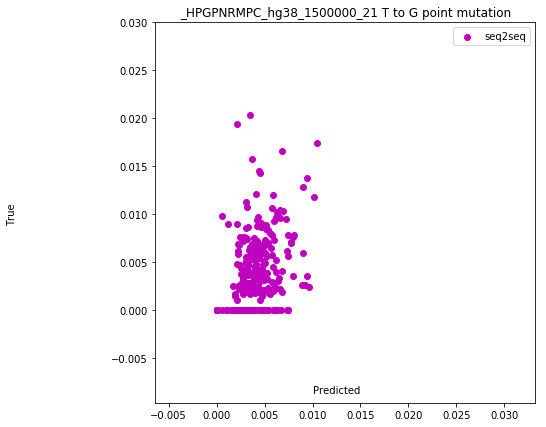

(0.661730010955778, 5.663807359755543e-80)


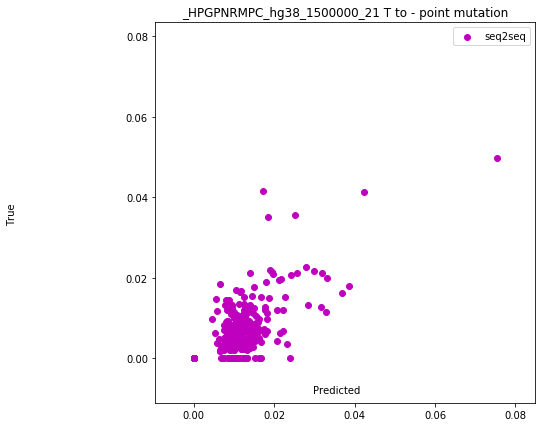

(0.8066403496598937, 2.0699924044983128e-144)


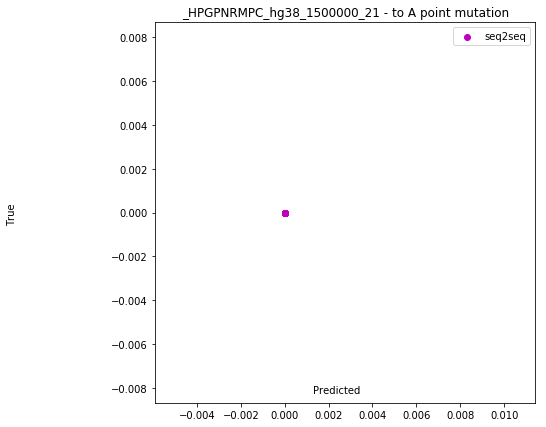

(nan, nan)


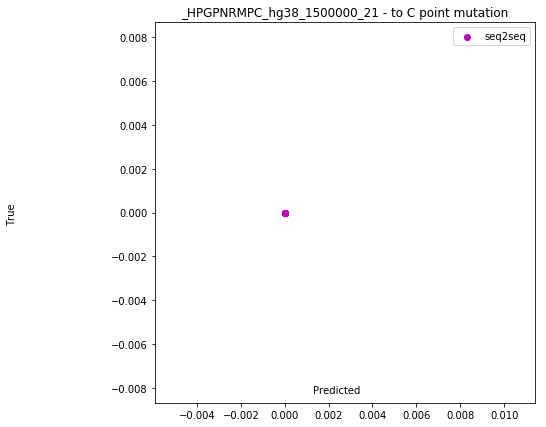

(nan, nan)


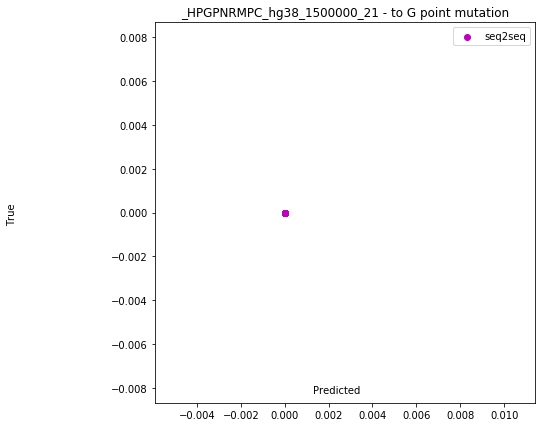

(nan, nan)


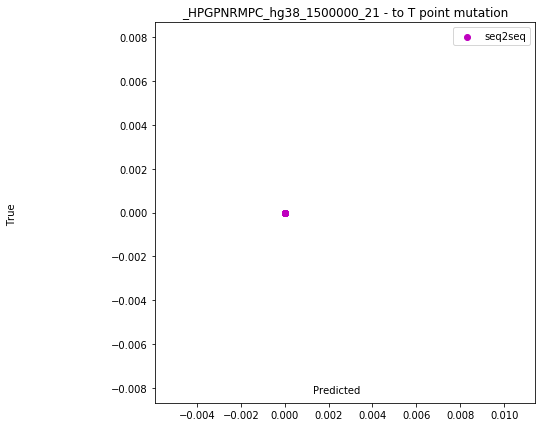

(nan, nan)


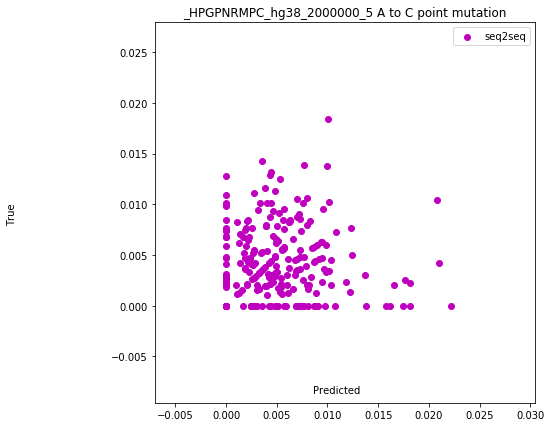

(0.4536949771440629, 4.6409774905083565e-33)


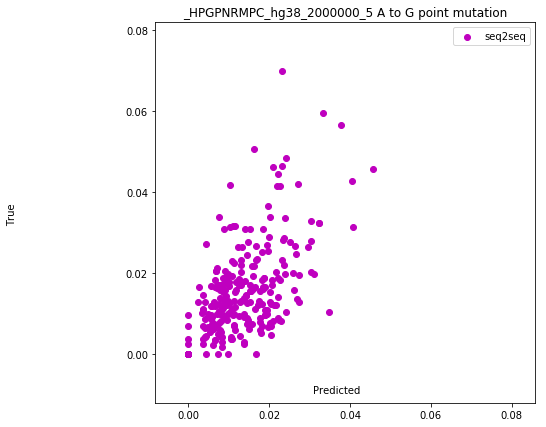

(0.8105273145728196, 7.201848400902484e-147)


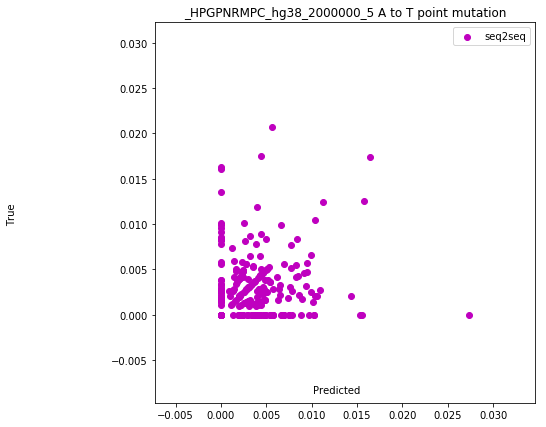

(0.4007372295710272, 1.6443496317489142e-25)


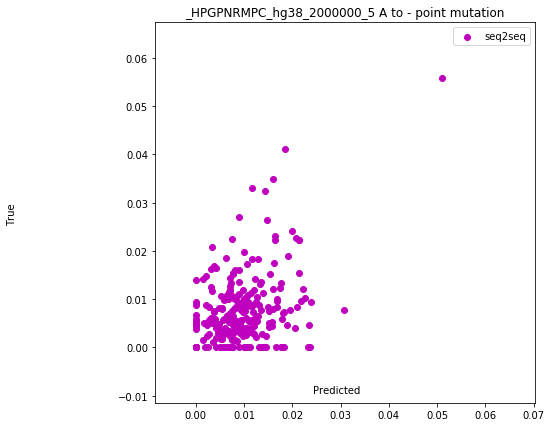

(0.6699557739044131, 1.217435593376722e-82)


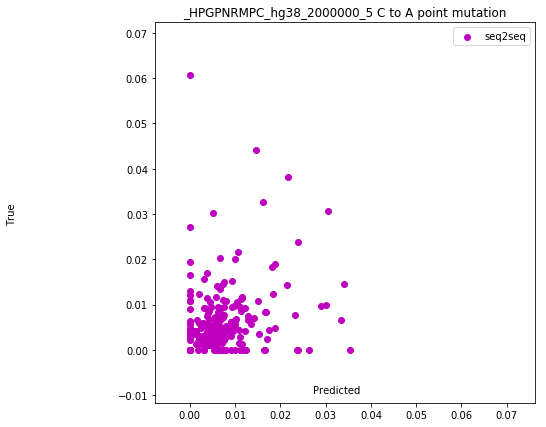

(0.49419439357068795, 8.456983348004611e-40)


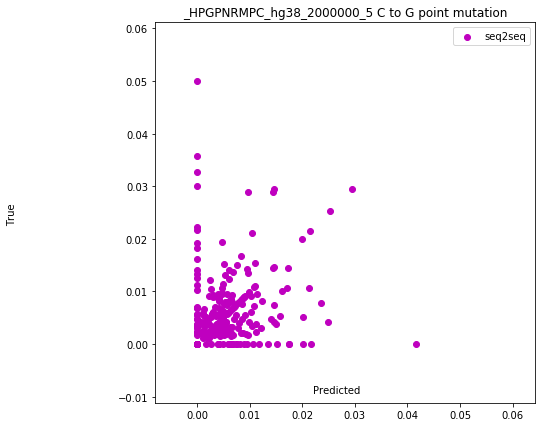

(0.4491491865845048, 2.334763581556229e-32)


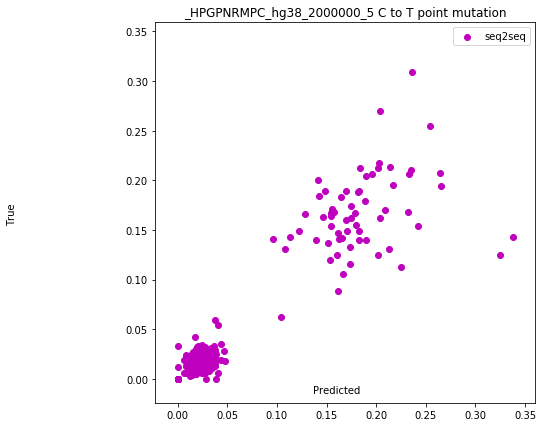

(0.9492210817746611, 4.35716171e-315)


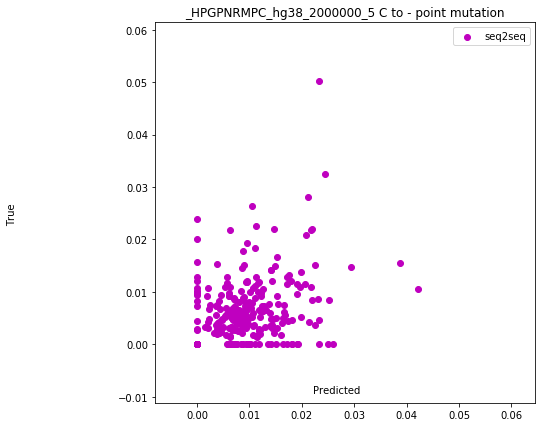

(0.6067377791175037, 4.127804379317685e-64)


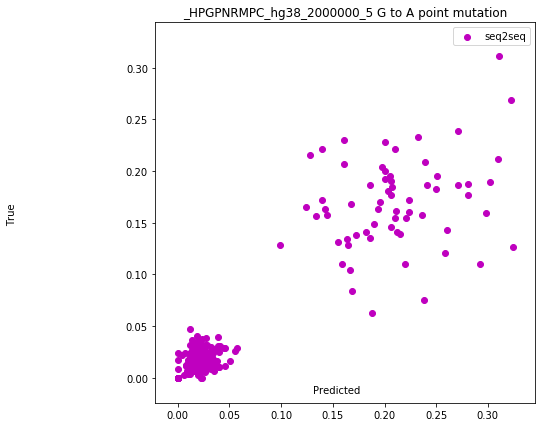

(0.9419534891007414, 1.710248222406656e-297)


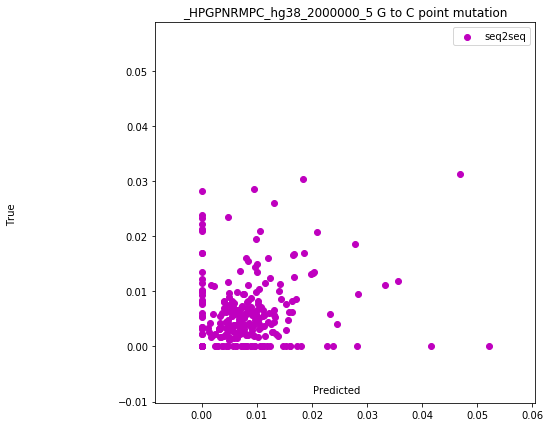

(0.48068372616878074, 1.889879465696787e-37)


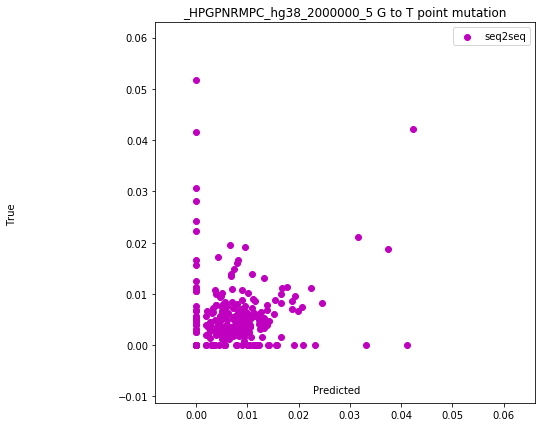

(0.4159502913084972, 1.5233178098708065e-27)


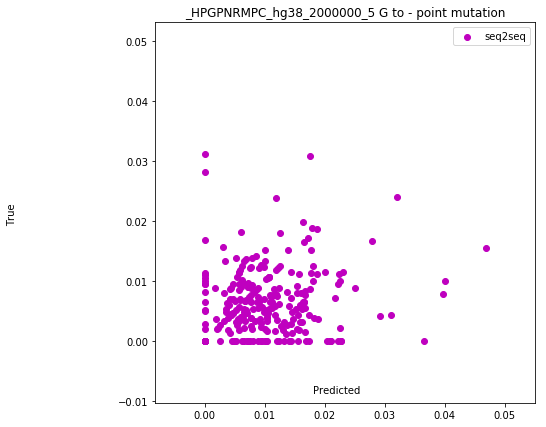

(0.5516310488642967, 4.7464858044553015e-51)


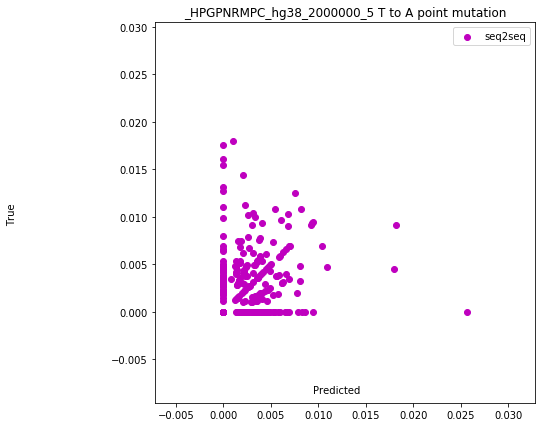

(0.39875255457543307, 2.9757130795882685e-25)


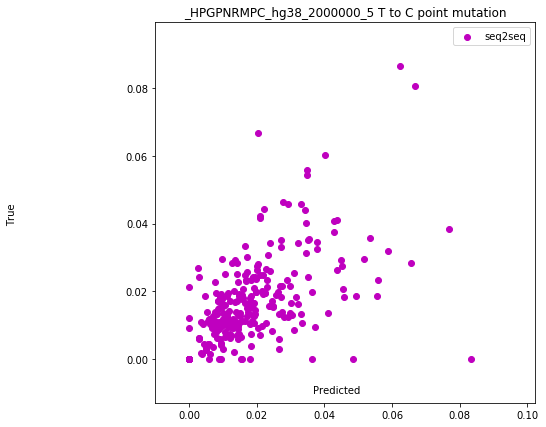

(0.7773322355145325, 1.6279827269127766e-127)


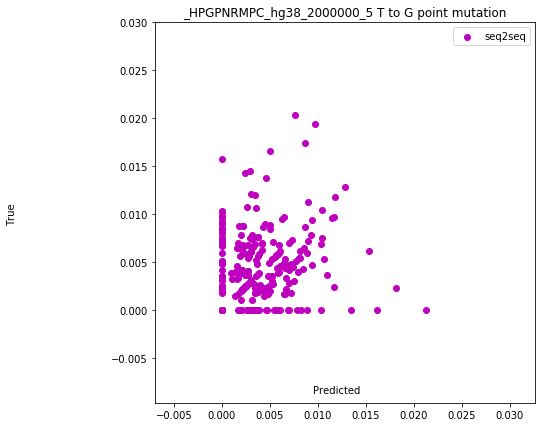

(0.5223832231573097, 4.7229146189725495e-45)


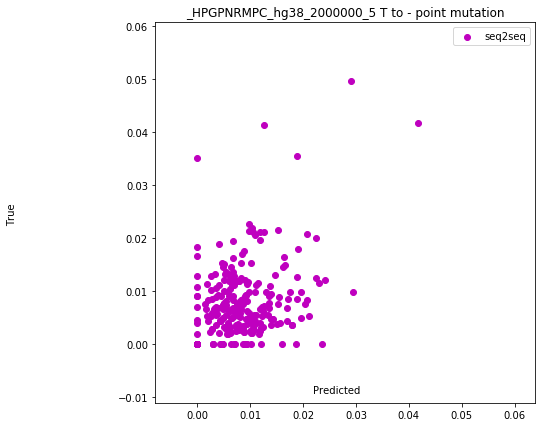

(0.6545426987544467, 1.036812733728242e-77)


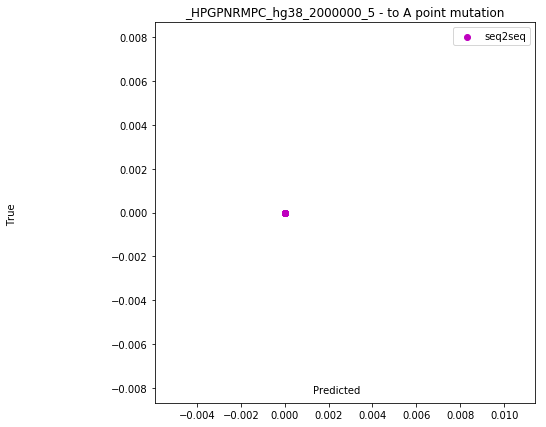

(nan, nan)


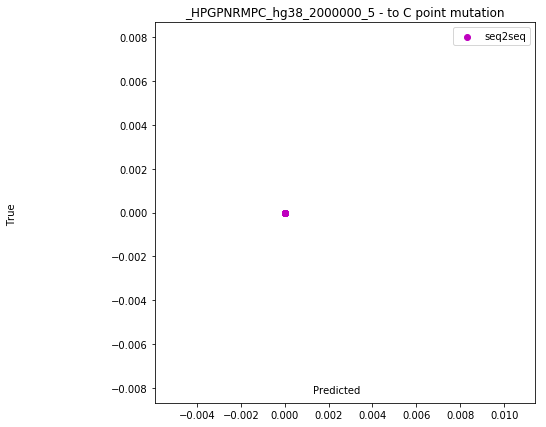

(nan, nan)


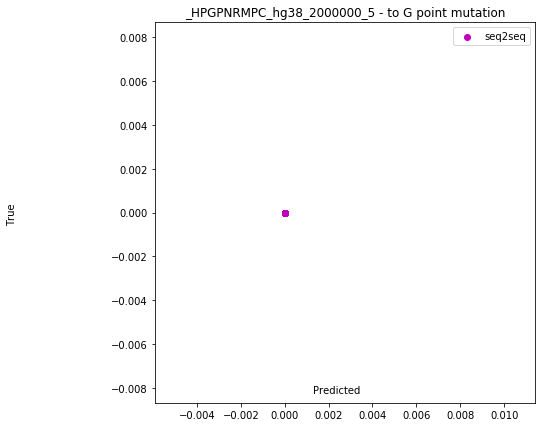

(nan, nan)


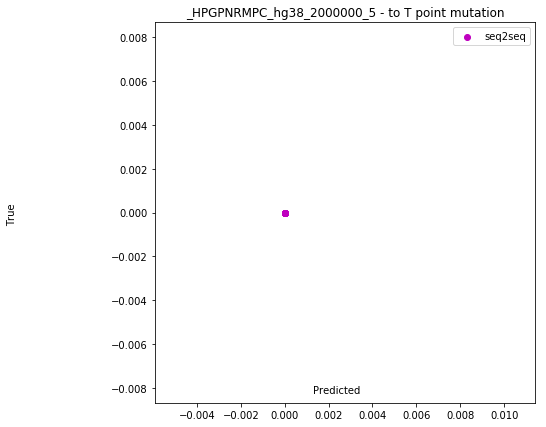

(nan, nan)


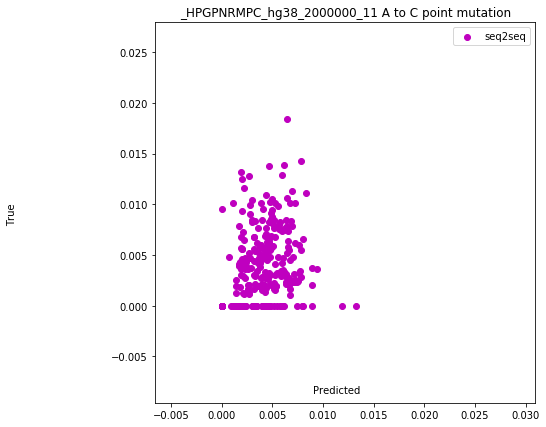

(0.6225589883529252, 2.372438445898207e-68)


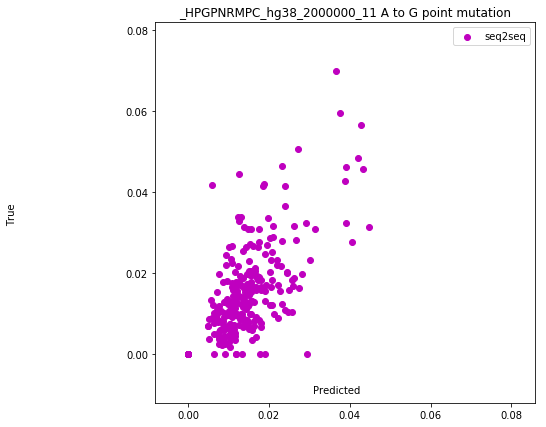

(0.8482094284912215, 4.231507812355752e-174)


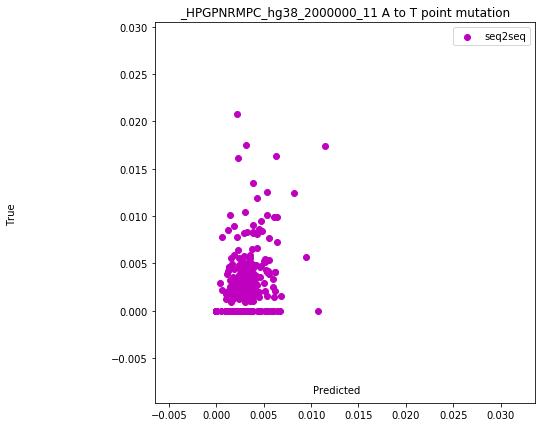

(0.6032550717315764, 3.2917549107624264e-63)


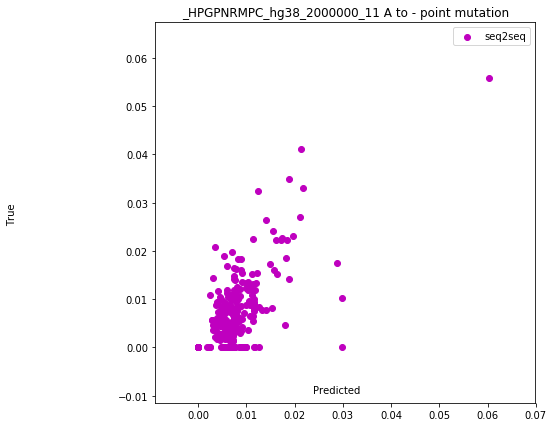

(0.7935411598679634, 1.607901625218962e-136)


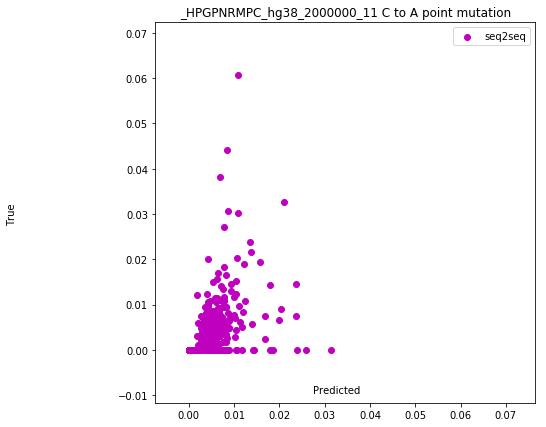

(0.5398787182863147, 1.4365820217984654e-48)


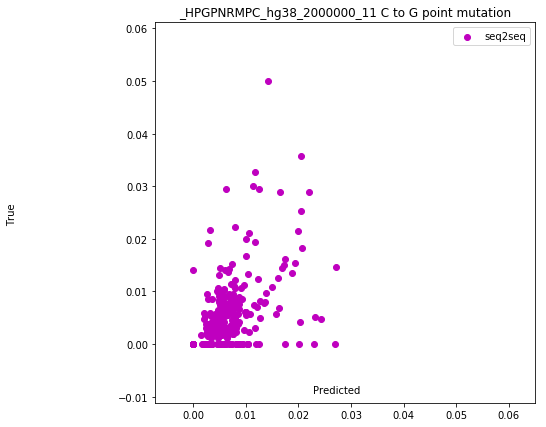

(0.6488854536694167, 5.669544794182687e-76)


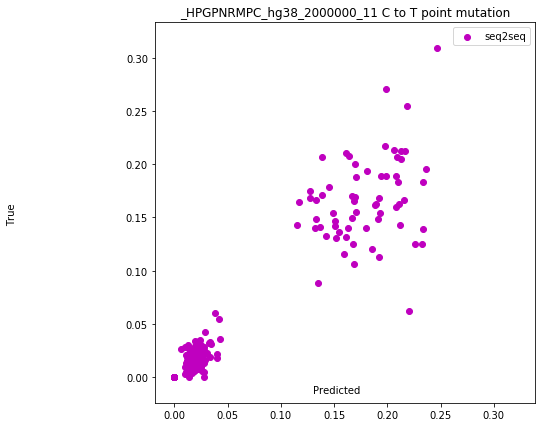

(0.9597678596744856, 0.0)


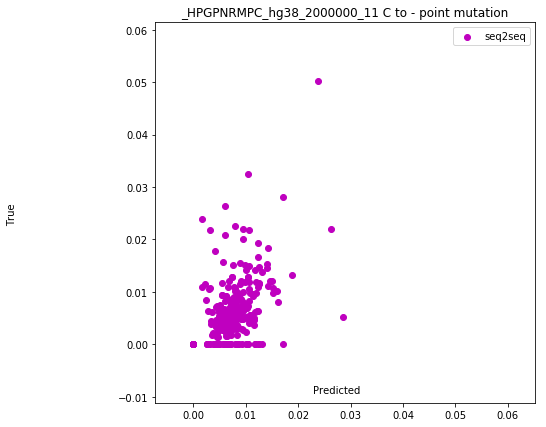

(0.701920245135508, 7.073775151265751e-94)


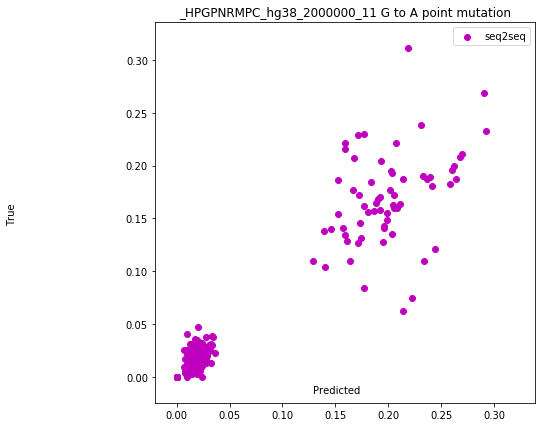

(0.9598642941872965, 0.0)


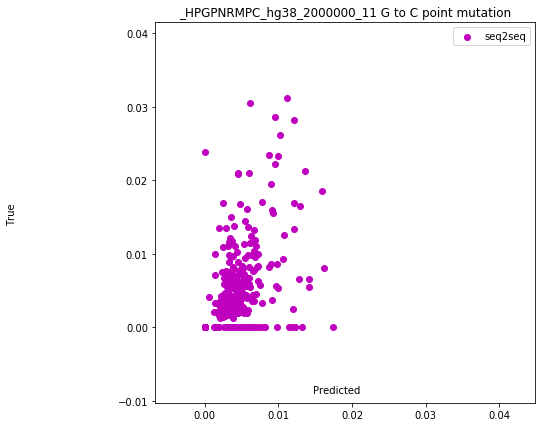

(0.6364001922779607, 2.8882047064927297e-72)


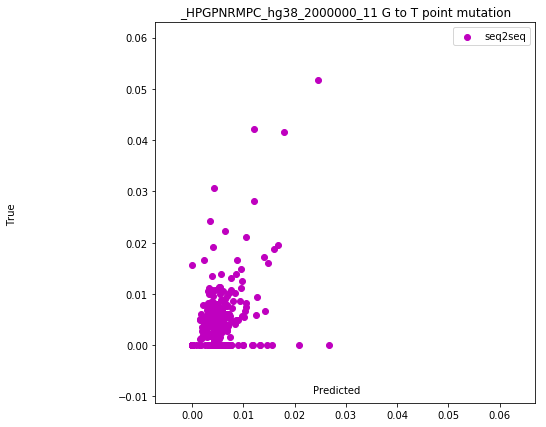

(0.619439046371514, 1.7007311005246772e-67)


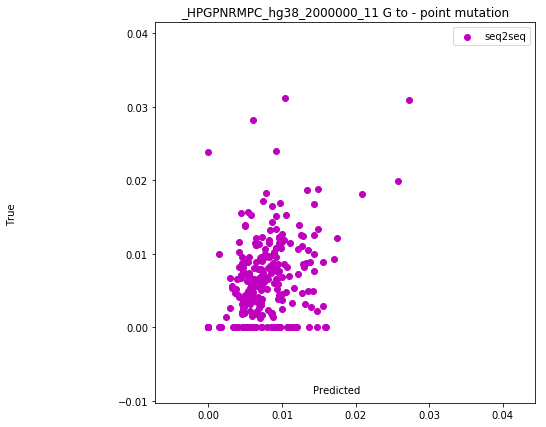

(0.7019320879502704, 7.001811181686708e-94)


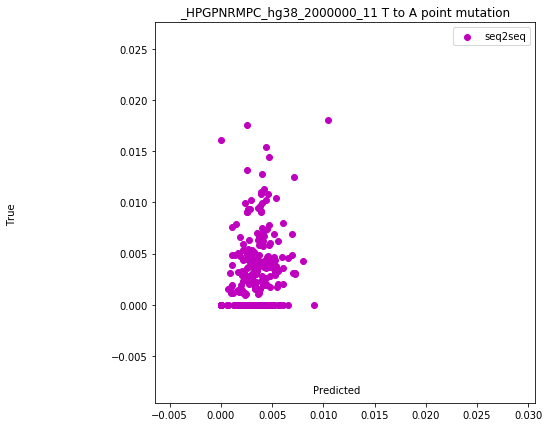

(0.6050938895153216, 1.1033852136789282e-63)


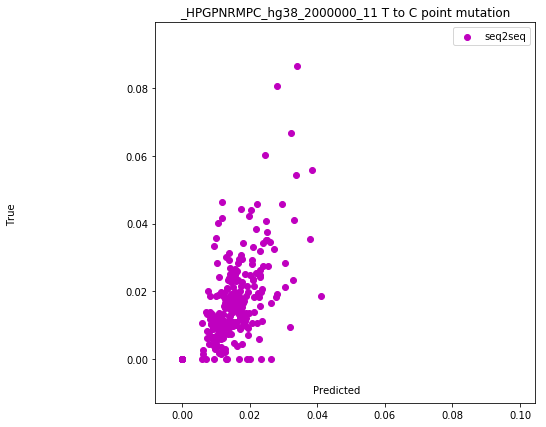

(0.8202339911431936, 2.8925828711520254e-153)


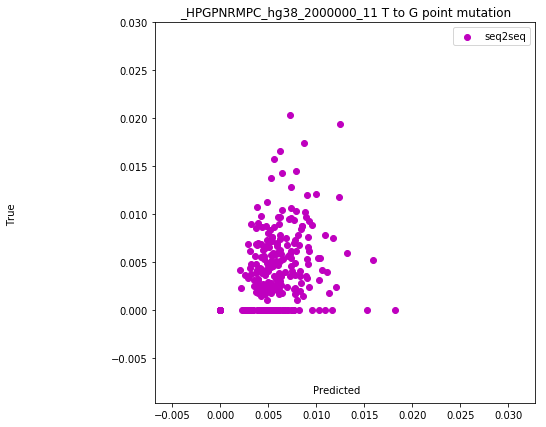

(0.646110731628183, 3.912337355610324e-75)


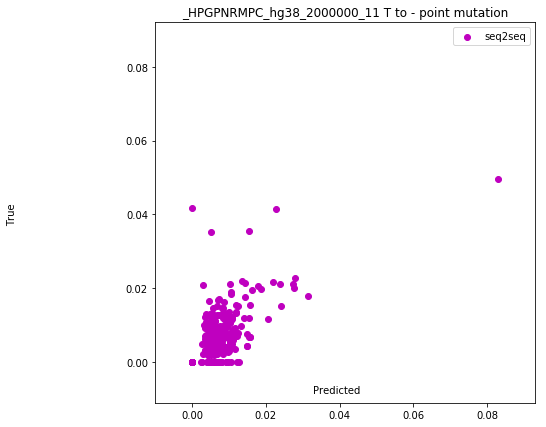

(0.757773773844471, 1.3041548315668034e-117)


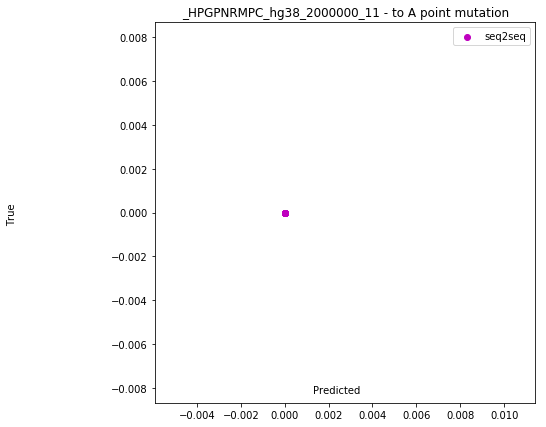

(nan, nan)


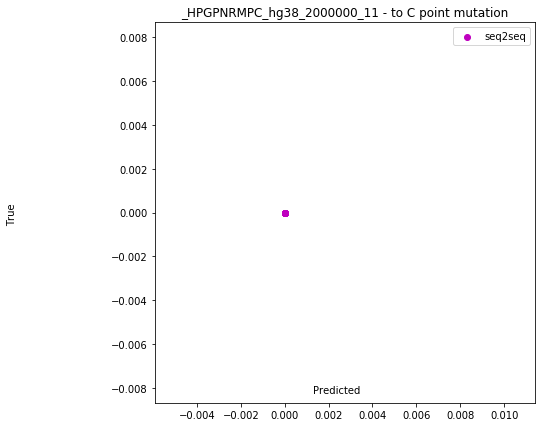

(nan, nan)


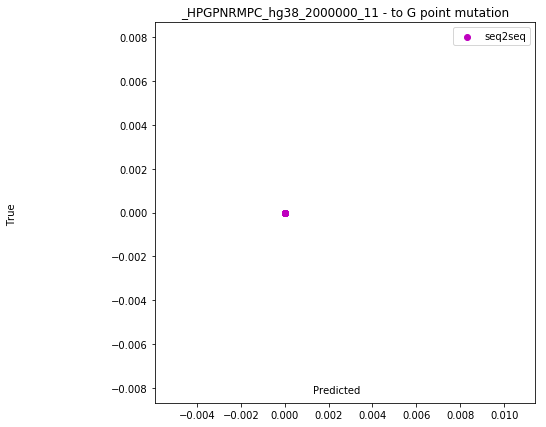

(nan, nan)


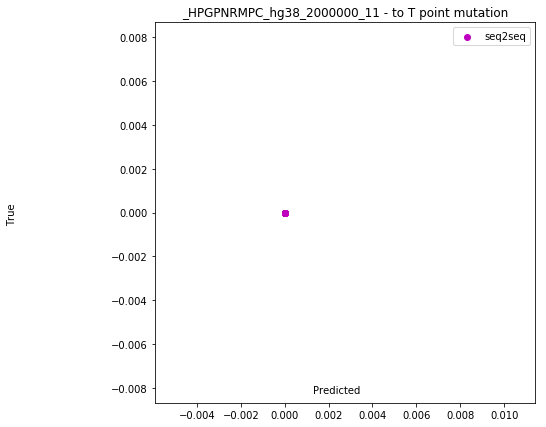

(nan, nan)


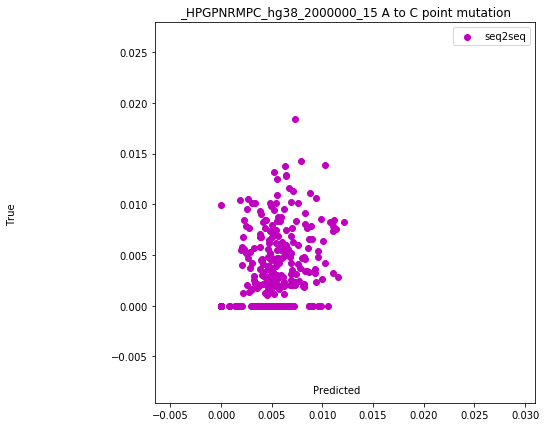

(0.6573984019887866, 1.3309518652139877e-78)


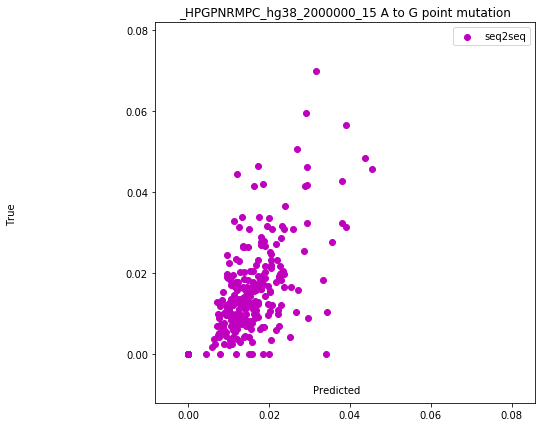

(0.8318997755725306, 1.7480262503262062e-161)


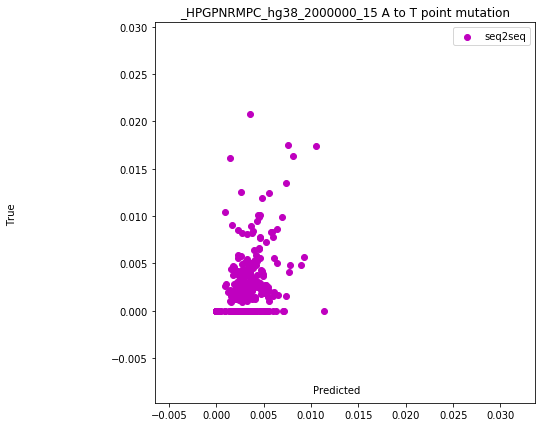

(0.6228473522422173, 1.9753355494331767e-68)


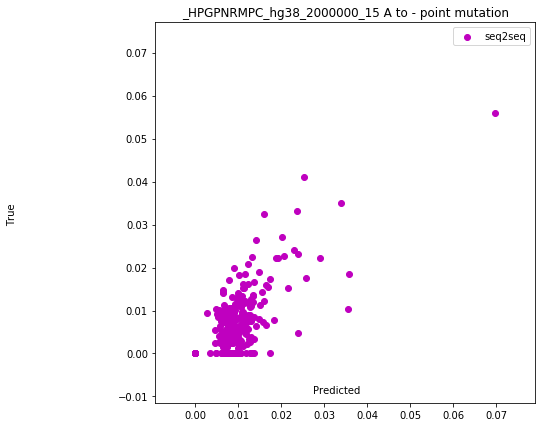

(0.8146300227397243, 1.5847929723474963e-149)


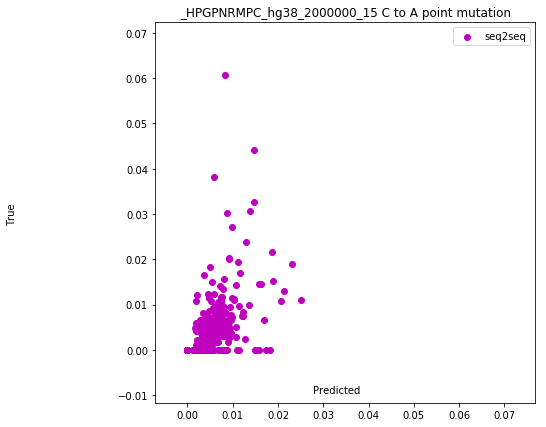

(0.6234422293101107, 1.3528900307031285e-68)


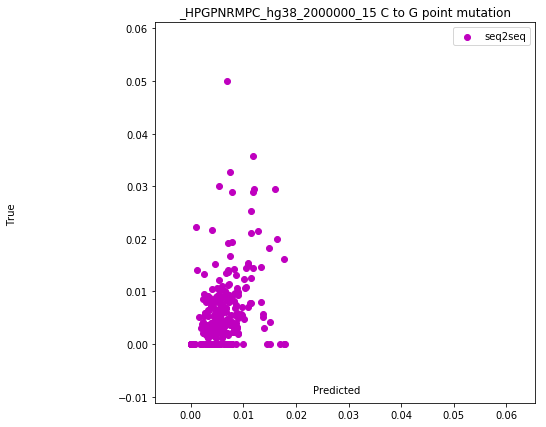

(0.6199206641917248, 1.2566450374139042e-67)


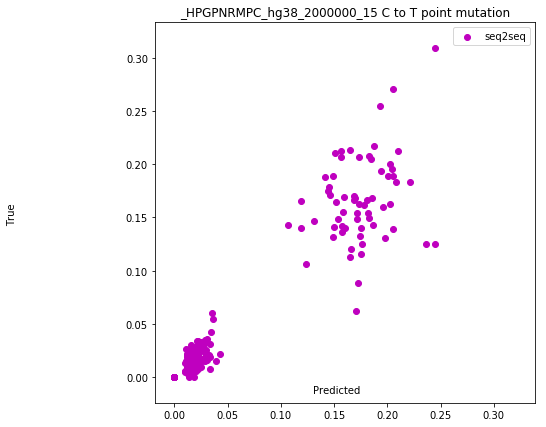

(0.9615202309517499, 0.0)


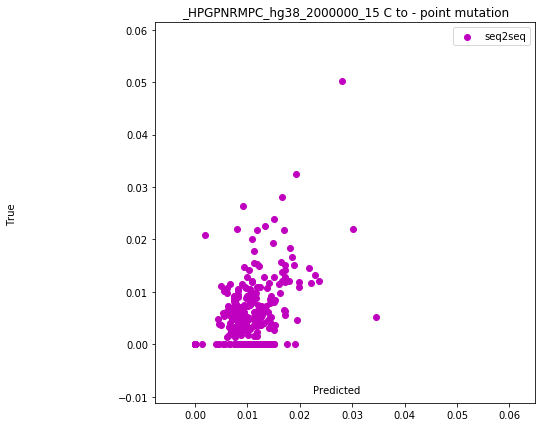

(0.7065709782072003, 1.2263475879576776e-95)


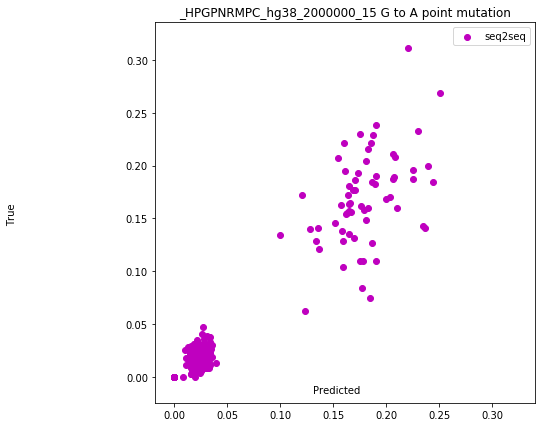

(0.9641037004789896, 0.0)


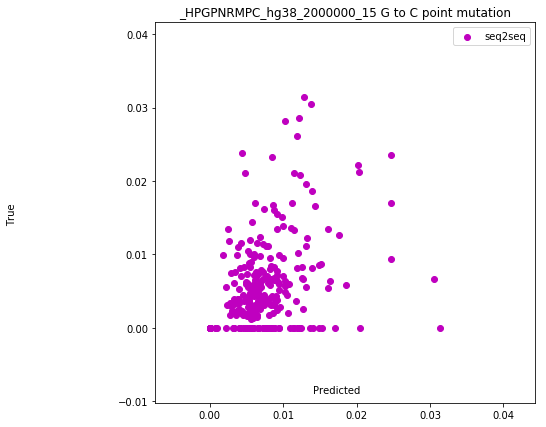

(0.6336691813597123, 1.7735095018398181e-71)


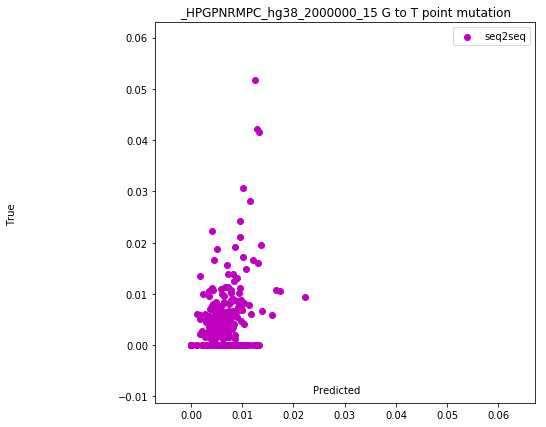

(0.6141787485890458, 4.4802551959597906e-66)


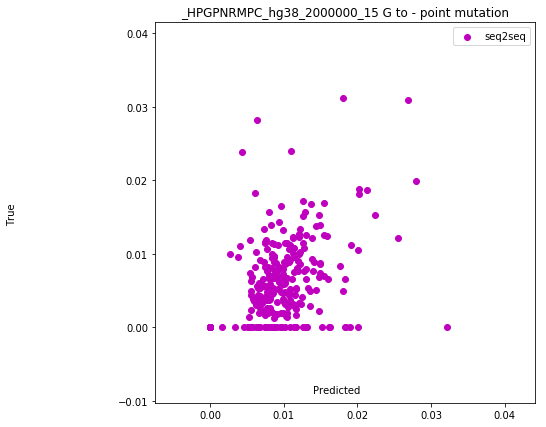

(0.6999114199448898, 3.97884773365005e-93)


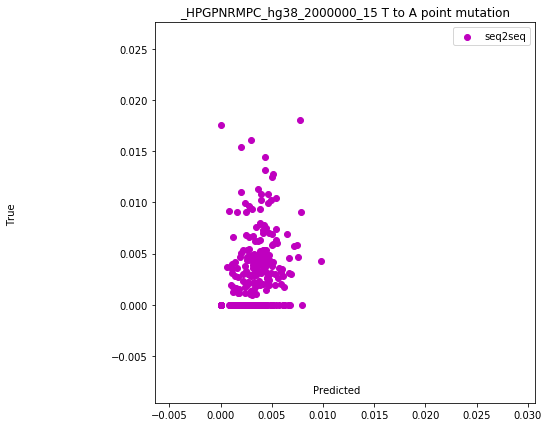

(0.5884464298668453, 1.6993564109799252e-59)


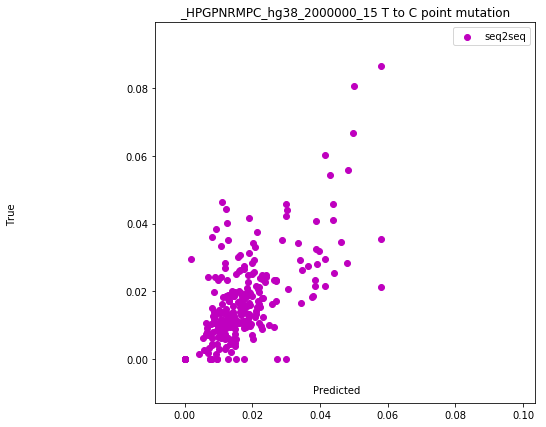

(0.840066467557111, 1.266837703603056e-167)


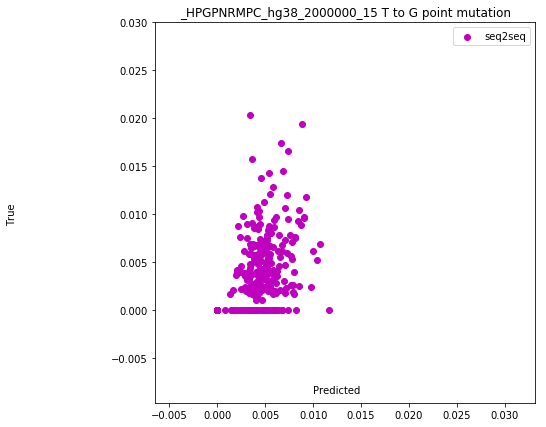

(0.6732982376920038, 9.479057000197878e-84)


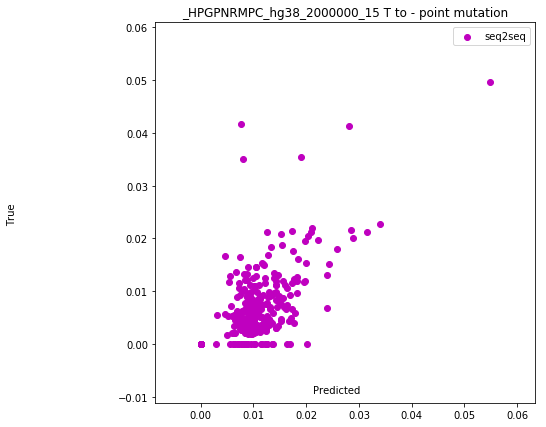

(0.7805448507069647, 3.076963435524577e-129)


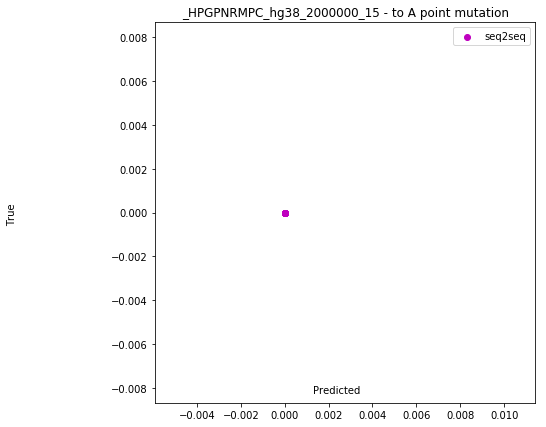

(nan, nan)


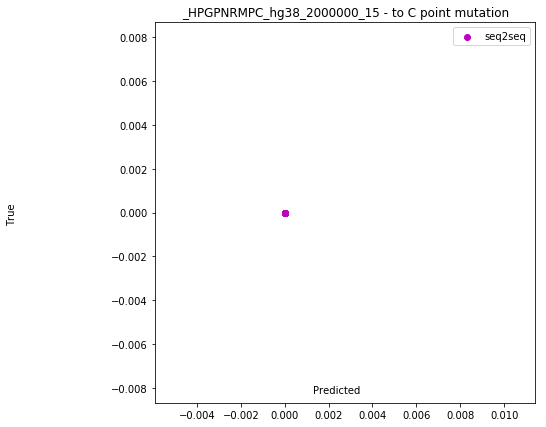

(nan, nan)


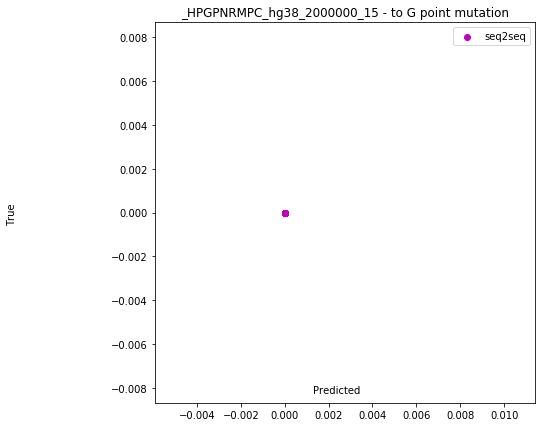

(nan, nan)


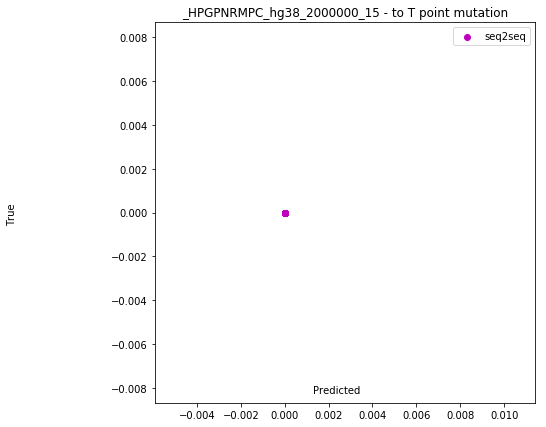

(nan, nan)


FileNotFoundError: [Errno 2] No such file or directory: 'data/pred_contextAC_HPGPNRMPChg38200000021.npy'

In [11]:
def plotScatter(n_groups, ancNuc, desNuc, ancName, desName, train_size, seq_length):
    predSeq = np.load('data/pred_context{}{}{}{}{}{}.npy'.format(ancNuc,desNuc, ancName, desName, train_size, seq_length), allow_pickle = True).item()

    trueSeq = np.load('data/true_context{}{}{}{}{}{}.npy'.format(ancNuc,desNuc, ancName, desName, train_size, seq_length), allow_pickle = True).item()

    evolSeq = np.load('data/true_evol_context{}{}{}{}{}{}.npy'.format(ancNuc,desNuc, ancName, desName, train_size, seq_length), allow_pickle = True).item()
    
    lstmSeq = np.load('data/pred_lstm_context{}{}.npy'.format(ancNuc,desNuc), allow_pickle = True).item()

    true = list(trueSeq.values())
    true_context = list(trueSeq.keys())
    pred = []
    evol = []
    lstm = []
    for i in true_context:
        pred.append(predSeq[i])
        evol.append(evolSeq[i])
        lstm.append(lstmSeq[i])
#     f, (ax1, ax3) = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(10,7))
    f, ax1 = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(10,7))
    f.text(0.5, 0.15, 'Predicted', ha='center', va='center')
    f.text(0.05, 0.5, 'True', ha='center', va='center', rotation='vertical')
    ax1.scatter(pred, true, color = 'm', label = 'seq2seq')
#     ax1.xlabel('Predicted')
#     ax1.ylabel('True')
    ax1.axis('scaled')
    ax1.axis('square')
    ax1.set_title('{}_{}_{}_{} {} to {} point mutation'.format(ancName, desName, train_size, seq_length, ancNuc, desNuc))

    ax1.legend()
    

    
#     ax2.scatter(evol, true, color = 'r', label = 'evolver')
#     ax2.xlabel('Predicted')
#     ax2.ylabel('True')
#     ax2.axis('scaled')
#     ax2.axis('square')
#     ax2.set_title('{} to {} point mutation'.format(ancNuc, desNuc))
#     ax2.legend()

    
#     ax3.scatter(lstm, true, color = 'k', label = 'lstm')
# #     ax3.xlabel('Predicted')
# #     ax3.ylabel('True')
#     ax3.axis('scaled')
#     ax3.axis('square')
#     ax3.legend()
#     ax3.set_title('{} to {} point mutation'.format(ancNuc, desNuc))
    f.savefig('figures/scatter_{}_{}_{}_{}_{}->{}.png'.format(ancName, desName, train_size, seq_length, ancNuc, desNuc))
    f.show()
    plt.show()
    plt.close()
    print(stats.pearsonr(pred, true)) #, stats.pearsonr(lstm, true))
    
for a in ancName:
    for b in desName:
        for t in train_size:
            for s in seq_length:
                for i in ancCase:
                    for j in desCase:
                        if i != j:
                            plotScatter(numBin,i, j,a,b,t,s)